The purpose of this code is to quantify the nuclei, the size and number of synuclein inclusions, and the lysosomal surface area in the lysotracker experiments.

Import Libraries

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.filters import gaussian, threshold_otsu, threshold_multiotsu
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects, binary_dilation, disk
import czifile
import skimage.io as io
from skimage import exposure
from cellpose import models
model = models.Cellpose(model_type='cyto')

c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\cellpose\resnet_torch.py:275: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(filename, 

Define Sub Functions

In [2]:
def show_image(image):
    io.imshow(image)
    plt.show()
    
def calculate_surface_area(labeled_image, channel=None):
    """Calculate the total surface area for labeled regions."""
    props = regionprops(labeled_image, channel)
    return sum(prop.area for prop in props)

def preprocess_green_channel(green_channel):
    """Preprocess the green channel for inclusion quantification."""
    confocal_img = gaussian(green_channel, sigma=2)
    confocal_img = exposure.adjust_sigmoid(green_channel, cutoff=0.25)
    confocal_img = (confocal_img - confocal_img.min()) / (confocal_img.max() - confocal_img.min())
    
    return confocal_img

def preprocess_green_channel_cellpose(green_channel):
    """Alternative to cellpose for segmenting cells?"""
    blurred_dapi = gaussian(green_channel, sigma=2)
    # threshold = threshold_multiotsu(blurred_dapi)[0]
    mask = blurred_dapi < 0.5
    blurred_dapi_no_inclusion = blurred_dapi[mask]
    threshold = threshold_multiotsu(blurred_dapi_no_inclusion)[0]
    binary_image = blurred_dapi > threshold
    # show_image(binary_image)
    cleaned_image = remove_small_objects(binary_image, min_size=400)
    merged_image = binary_dilation(cleaned_image, footprint=disk(5))
    labeled_image = label(merged_image)
    return labeled_image

def preprocess_dapi_channel(dapi_channel):
    """Preprocess the DAPI channel for nuclei quantification."""
    blurred_dapi = gaussian(dapi_channel, sigma=2)
    threshold_value = threshold_otsu(blurred_dapi)
    binary_image = blurred_dapi > threshold_value
    # show_image(binary_image)
    cleaned_image = remove_small_objects(binary_image, min_size=400)
    merged_image = binary_dilation(cleaned_image, footprint=disk(5))
    labeled_image = label(merged_image)
    return labeled_image

def count_nuclei(labeled_image):
    """Count the number of nuclei in the labeled image."""
    return len(np.unique(labeled_image)) - 1

def calculate_metrics(basename, num_inclusions,num_nuclei):
    """Calculate additional metrics and return the second DataFrame."""

    return pd.DataFrame({
        "File_Name:": [basename],
        "Number_of_Inclusions": [np.sum(num_inclusions)],
        "Number_of_Nuclei": [num_nuclei],
        "Number_of_Inclusions_per_Nucleus": [np.sum(num_inclusions) / num_nuclei],
    })



In [3]:
def analyze_image(image_path, basename):
    """
    Analyze an image by its individual cells
    Args:
        image_path: Path to the .czi image file.
        basename: Base name for the file, used in the output DataFrame.

    Returns:
        A DataFrame containing details about each image 
        A second DataFrame containing details about each detected cell
    """
    
    # Load the image and squeeze dimensions
    image = czifile.imread(image_path)
    image_squeezed = np.squeeze(image)

    # Separate the channels
    green_channel = image_squeezed[0, :, :]
    dapi_channel = image_squeezed[1, :, :]

    green_channel = preprocess_green_channel(green_channel)
    print("Green Channel")
    show_image(green_channel)

    # Process DAPI channel for nuclei counting
    labeled_image_dapi = preprocess_dapi_channel(dapi_channel)
    num_nuclei = count_nuclei(labeled_image_dapi)

    
    # show_image(green_channel_cells)
    green_channel_remove_inclusions = np.where(green_channel < 0.4, green_channel, 0)
    

    # Detect cells in the green channel
    masks, flows, styles, diams = model.eval(green_channel_remove_inclusions, diameter=400, channels=[0, 0])
    # labeled_cells = label(masks)
    
    # Alternative way to detect cells:
    green_channel_cells = preprocess_green_channel_cellpose(green_channel)
    labeled_cells = green_channel_cells
    print("Segmented Cells")
    show_image(labeled_cells)


    #threshold = threshold_multiotsu(green_channel)[1]+0.3
    # print(thresholds)
    #show_image(green_channel>threshold)
    # show_image(green_channel>0.7)
    

    # Initialize lists to store results
    cell_counter = []
    cell_size = []
    num_inclusions = []
    total_inclusion_areas = []
    average_inclusion_areas = []

    inclusion_areas_list = []
    inclusion_counter = []

    # Analyze each detected cell
    for i, cell in enumerate(regionprops(labeled_cells)):
        if cell.area < 100:
            continue
        
        cell_counter.append(i)
        cell_size.append(cell.area)
        


        mask = labeled_cells == cell.label

        

        applied_mask = gaussian(green_channel) * mask
        applied_mask_eliminate_background = applied_mask[applied_mask > 0.01]

        show_image(applied_mask)
        # Plot histogram
        hist, bin_edges = np.histogram(applied_mask_eliminate_background, bins='auto')
        print("Bin count", len(bin_edges))
        plt.hist(applied_mask_eliminate_background, bins='auto')  # arguments are passed to np.histogram
        plt.title("Histogram with 'auto' bins")
        plt.show()

        # thresholds = threshold_multiotsu(applied_mask_eliminate_background,classes=3)
        mean_intensity = np.mean(applied_mask_eliminate_background)
        std_intensity = np.std(applied_mask_eliminate_background)

        print("Standard Deviation: ", std_intensity)
        k = 2
        
        # threshold = threshold_otsu(applied_mask)
        # threshold = threshold_otsu(applied_mask_eliminate_background)
        threshold = mean_intensity + k * std_intensity
        print("Threshold: ", threshold)
        inclusions = applied_mask > threshold
        inclusions_labeled = label(inclusions)
        cell_area = cell.area
        
        
        
        inclusion_areas = [inclusion.area for inclusion in regionprops(inclusions_labeled) if inclusion.area > 10]
        inclusion_areas = np.array(inclusion_areas)
        total_inclusion_area = np.sum(inclusion_areas)
        average_inclusion_area = np.mean(inclusion_areas)
        
        # if (total_inclusion_area == 0 or 
        #     total_inclusion_area/cell_area > 0.3 or 
        #     np.any(inclusion_areas>max(cell_area*0.3,2000)) or
        #     average_inclusion_area/cell_area > 0.1): 
        #     # cells that seem to have abnormally large inclusions after thresholding actually have no inclusions.
        #     num_inclusions.append(0)
        #     total_inclusion_areas.append(0)
        #     average_inclusion_areas.append(0)
        #     continue

        # print('Cell: ', i)
        # print('Inclusion Area', total_inclusion_area)
        # print('Max Inclusion Area:',np.max(inclusion_areas))
        # print('Cell Area:', cell_area)
        # print('Ratio:', total_inclusion_area/cell_area)
        # print('Max Inclusion/Cell Area:', np.max(inclusion_areas)/cell_area)
        # print('Average Inclusion/Cell Area', average_inclusion_area/cell_area)


        if len(inclusion_areas) > 0:
            print("Inclusion Areas: ", inclusion_areas)
            show_image(inclusions)
            
        

        total_inclusion_areas.append(total_inclusion_area)
        
   

        num_inclusions.append(len(inclusion_areas))

        inclusion_areas_list.append(inclusion_areas)
        inclusion_counter.append(range(len(inclusion_areas)))

        average_inclusion_areas.append(average_inclusion_area)
    
    df1 = calculate_metrics(basename, num_inclusions,num_nuclei)
    
    df2 = pd.DataFrame({
        "File_Name": [basename] * len(cell_counter),
        "Cell": cell_counter,
        "Num_Inclusions": num_inclusions
    })
    if len(inclusion_counter) == 0:
        df3 = pd.DataFrame()
    else:
        df3 = pd.DataFrame({
            "File_Name": [basename] * len(np.concatenate(inclusion_counter)),
            "Inclusion": np.concatenate(inclusion_counter),
            "Inclusion_Area": np.concatenate(inclusion_areas_list)
        })

    
    return df1, df2, df3


In [4]:
def analyze_all_images(image_folder):
    all_data_1 = []
    all_data_2 = []
    all_data_3 = []
    for well_image in os.listdir(image_folder):
        
        if well_image.lower().endswith(".czi"):  # Filter for CZI files
            print("-" * 50)
            print(well_image)

            well_image_path = os.path.join(image_folder, well_image)
            well_image_base_name = os.path.basename(well_image)[:-4]
            
            df1, df2, df3 = analyze_image(well_image_path, well_image_base_name)
            all_data_1.append(df1)
            all_data_2.append(df2)
            all_data_3.append(df3)
            
            print("-" * 50)

    combined_df_1 = pd.concat(all_data_1, ignore_index=True)
    combined_df_1.to_excel(f"{image_folder[:6]}_analysis_by_image_NEW.xlsx", index=False)

    combined_df_2 = pd.concat(all_data_2, ignore_index=True)
    combined_df_2.to_excel(f"{image_folder[:6]}_analysis_by_cell_NEW.xlsx", index=False)

    combined_df_3 = pd.concat(all_data_3, ignore_index=True)
    combined_df_3.to_excel(f"{image_folder[:6]}_analysis_by_inclusion_NEW.xlsx", index=False)

Define Main Function

--------------------------------------------------
1K_ADAMTS19_01.czi
Green Channel


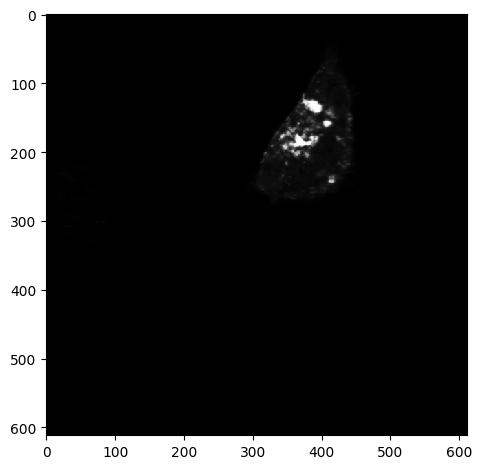

Segmented Cells


c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:158: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


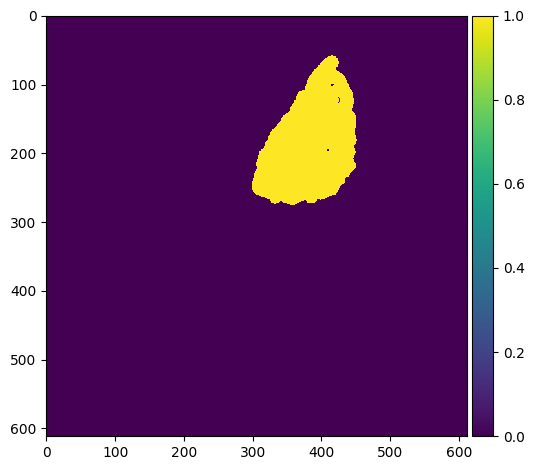

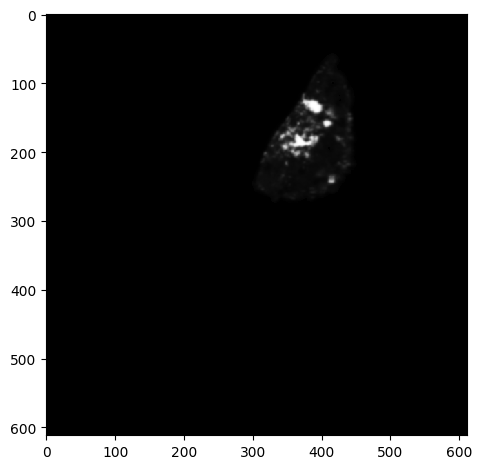

Bin count 230


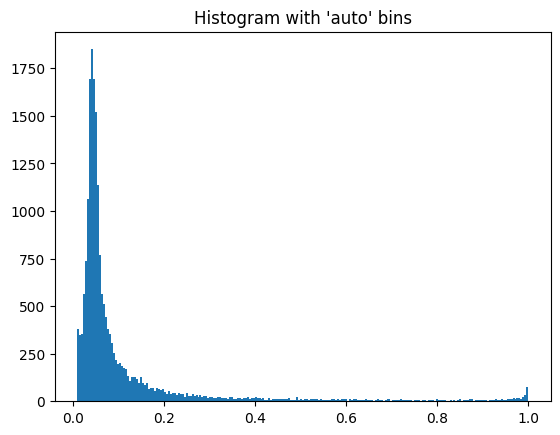

Standard Deviation:  0.17482231361490835
Threshold:  0.4658228167985199
Inclusion Areas:  [367.  94.  27. 451.  27.  46.  57.  13.  33.]


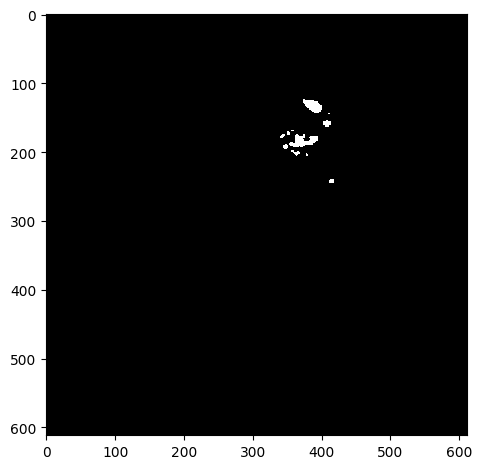

--------------------------------------------------
--------------------------------------------------
1K_ADAMTS19_02.czi
Green Channel


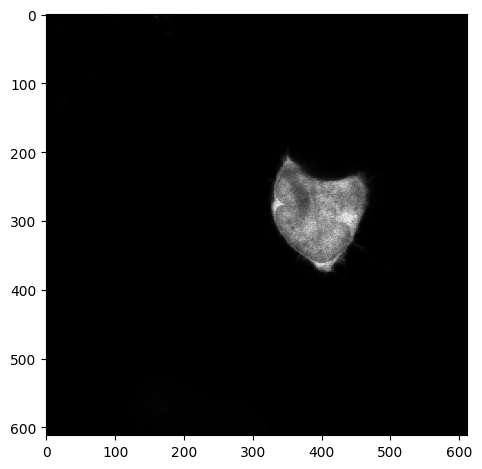

Segmented Cells


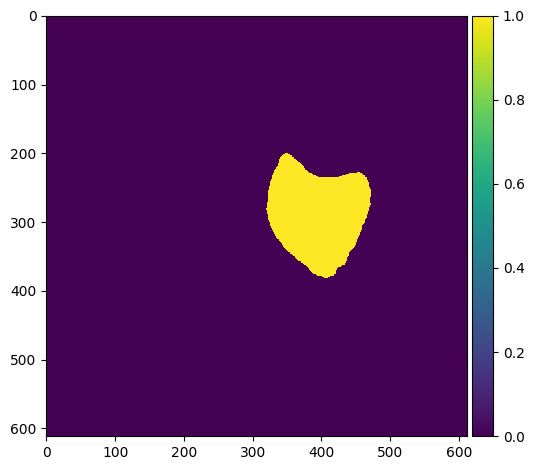

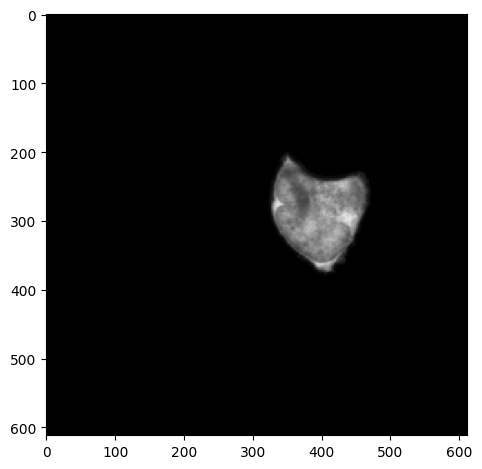

Bin count 48


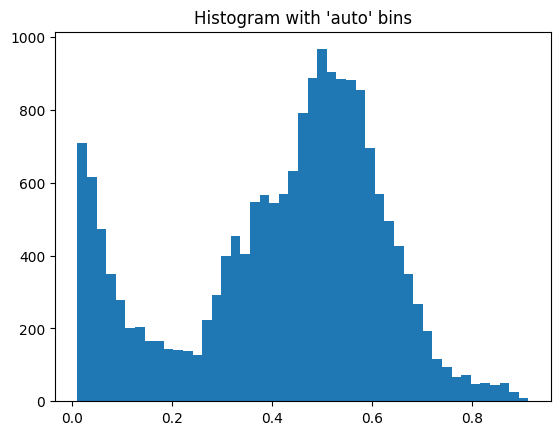

Standard Deviation:  0.2015795619800951
Threshold:  0.8247788261979184
Inclusion Areas:  [ 30. 125.]


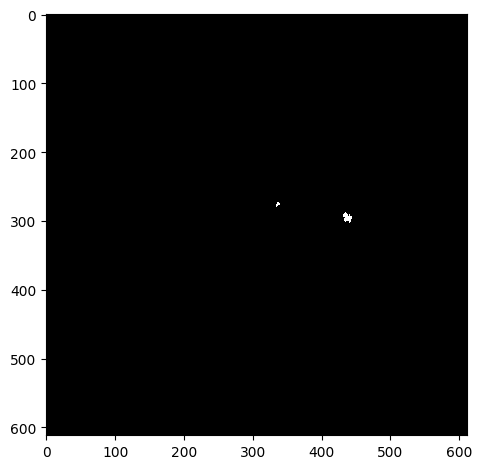

--------------------------------------------------
--------------------------------------------------
1K_ADAMTS19_03.czi
Green Channel


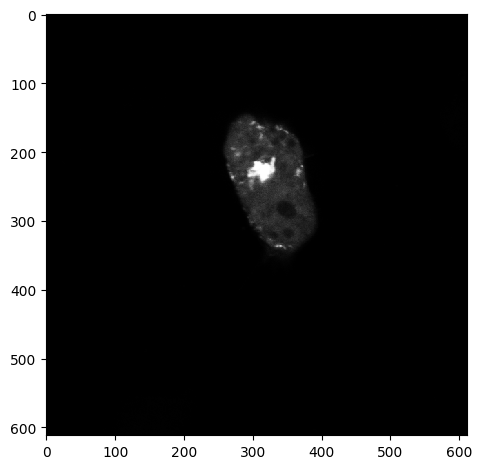

Segmented Cells


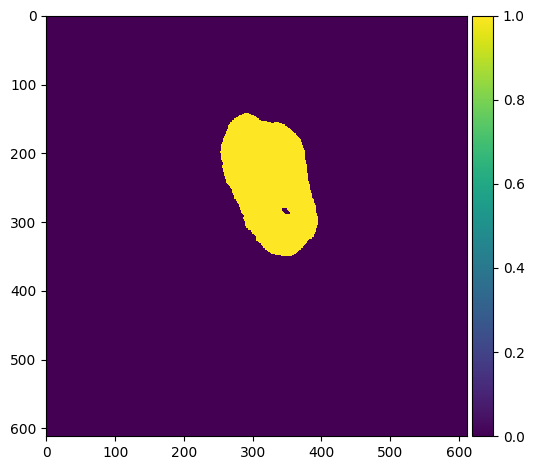

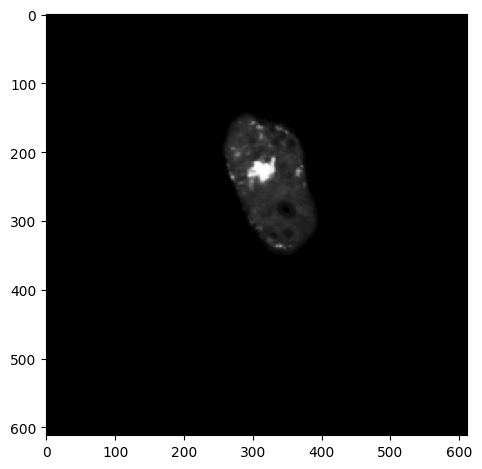

Bin count 170


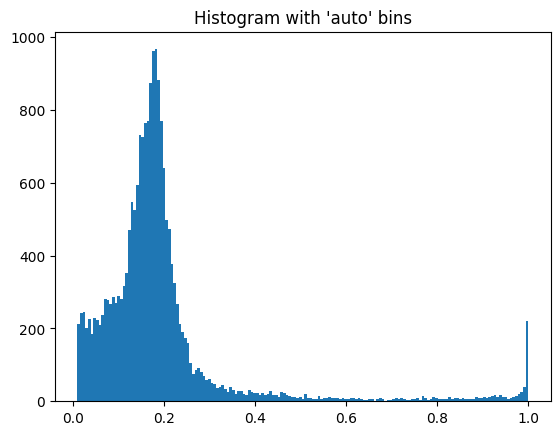

Standard Deviation:  0.1647715920540988
Threshold:  0.524128158190447
Inclusion Areas:  [ 11. 870.  18.]


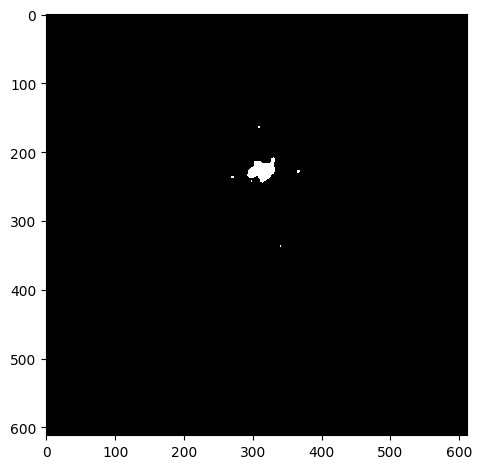

--------------------------------------------------
--------------------------------------------------
1K_ADAMTS19_04.czi
Green Channel


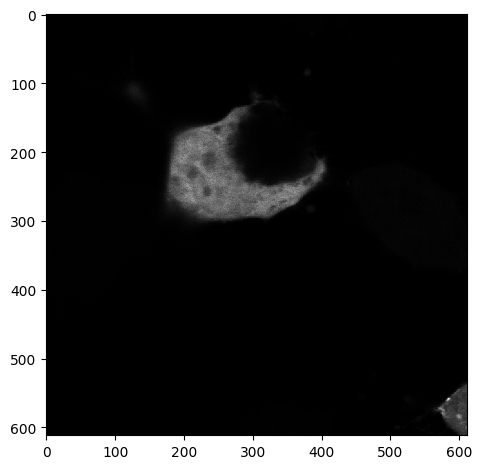

Segmented Cells


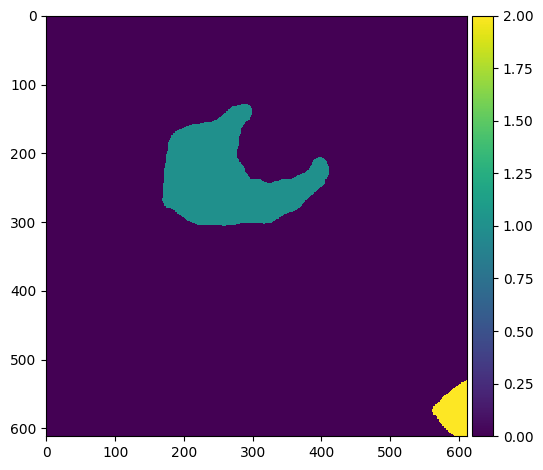

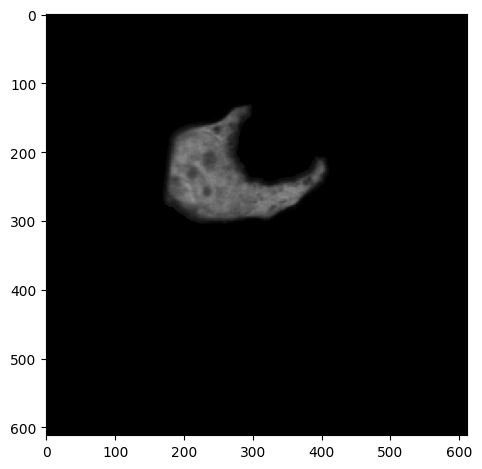

Bin count 37


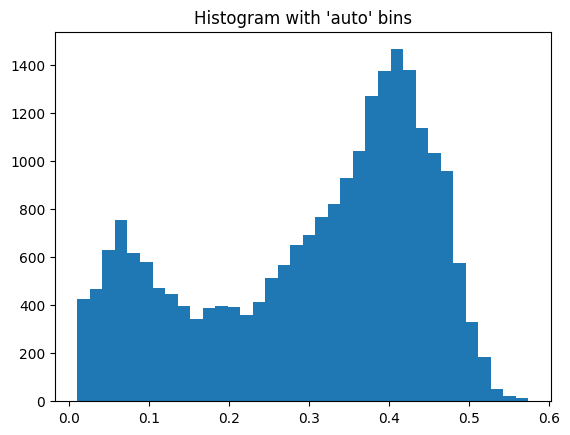

Standard Deviation:  0.14158061476500558
Threshold:  0.5866716660905011


c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


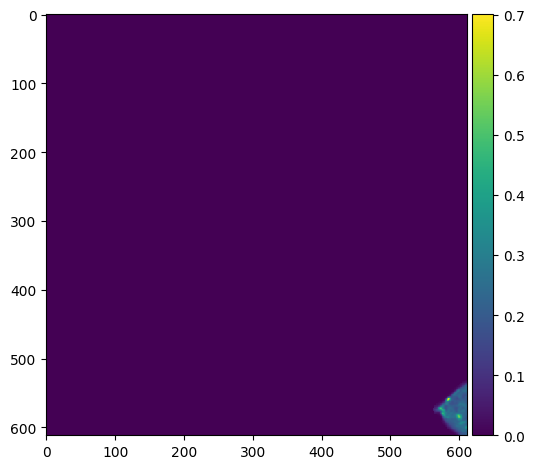

Bin count 65


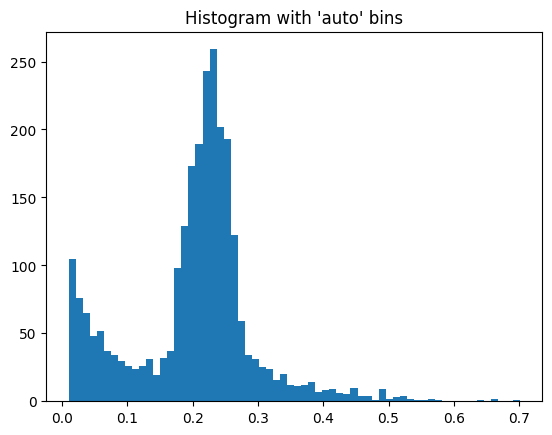

Standard Deviation:  0.09554697911720098
Threshold:  0.39326805776546603
Inclusion Areas:  [18. 20. 31.]


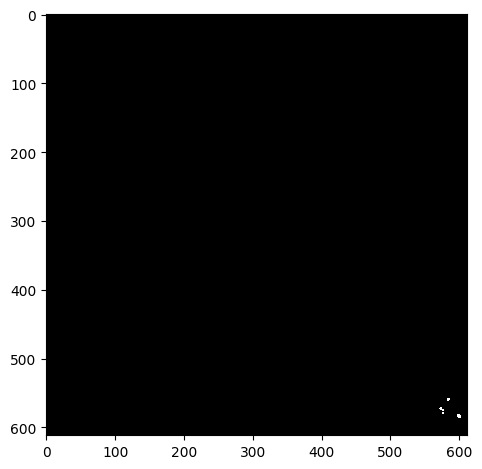

--------------------------------------------------
--------------------------------------------------
1K_ADAMTS19_05.czi
Green Channel


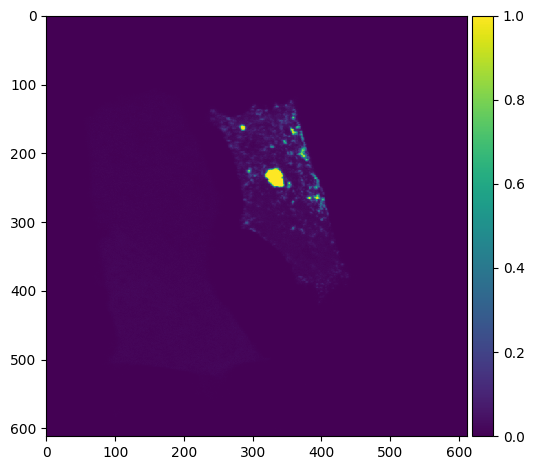

Segmented Cells


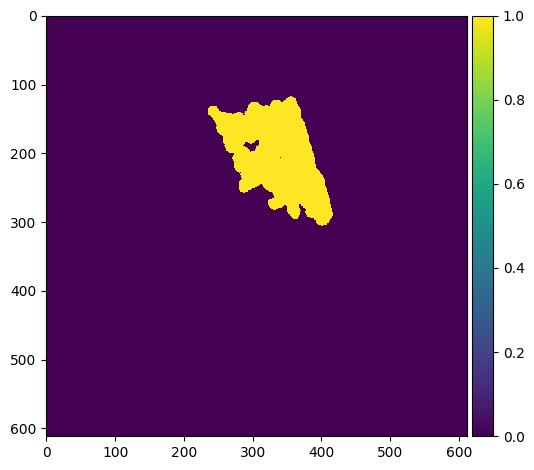

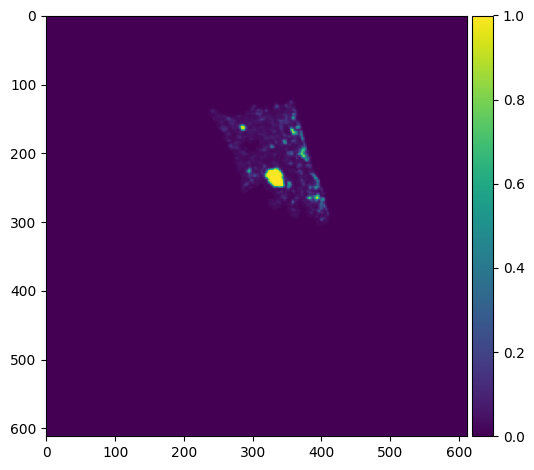

Bin count 257


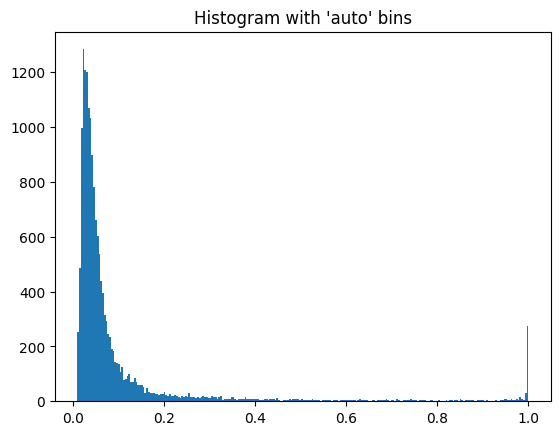

Standard Deviation:  0.1827606982111427
Threshold:  0.4691296722713879
Inclusion Areas:  [ 48.  50.  81. 567.  43.  12.]


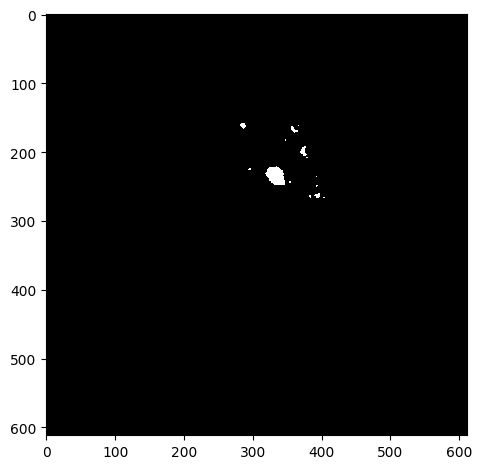

--------------------------------------------------
--------------------------------------------------
1K_ADAMTS19_06.czi
Green Channel


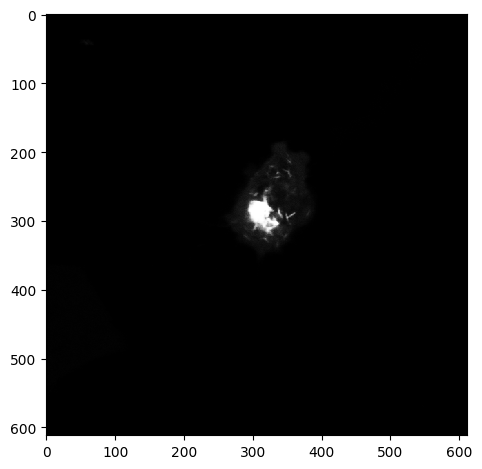

Segmented Cells


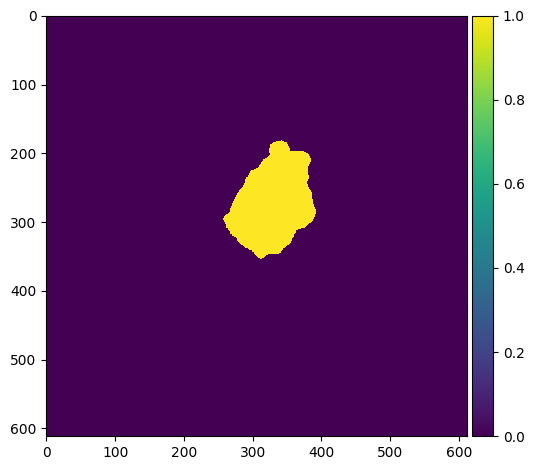

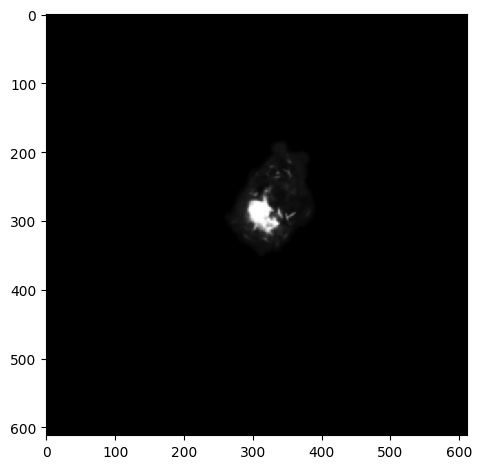

Bin count 185


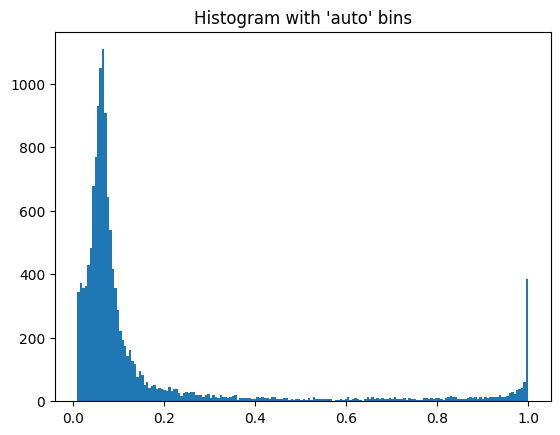

Standard Deviation:  0.24754144767823263
Threshold:  0.6583578836006743
Inclusion Areas:  [1187.]


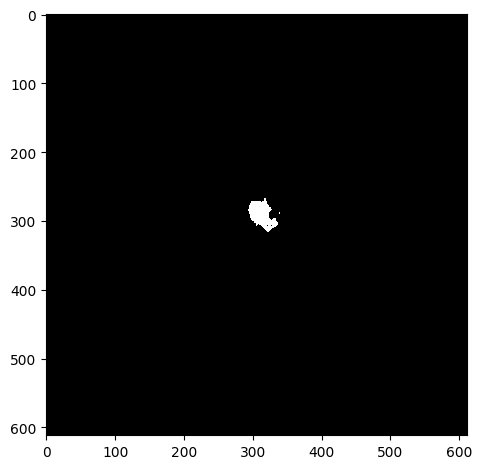

--------------------------------------------------
--------------------------------------------------
1K_ADAMTS19_07.czi
Green Channel


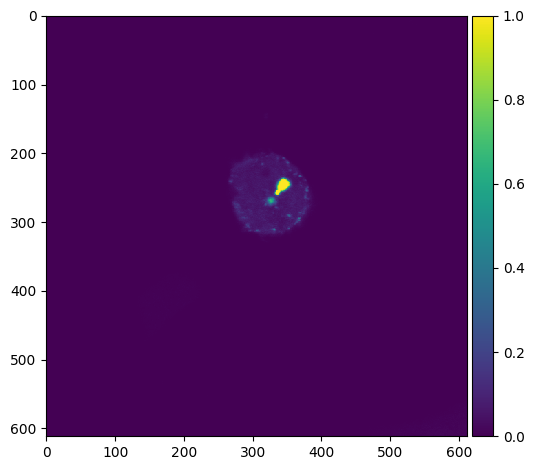

Segmented Cells


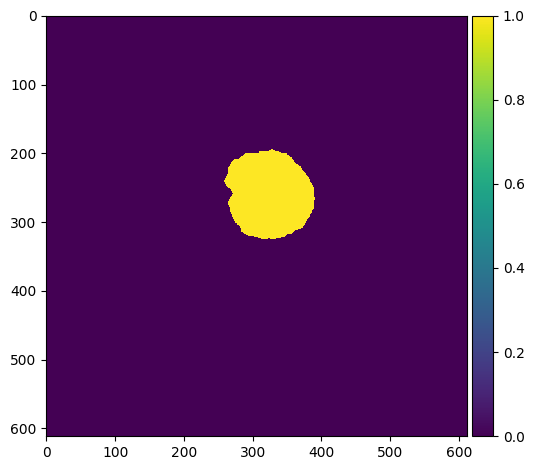

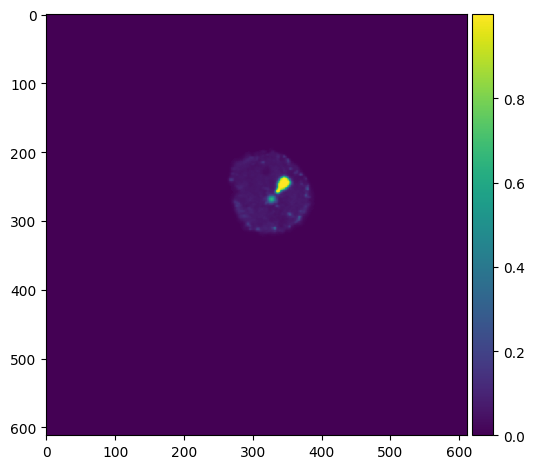

Bin count 504


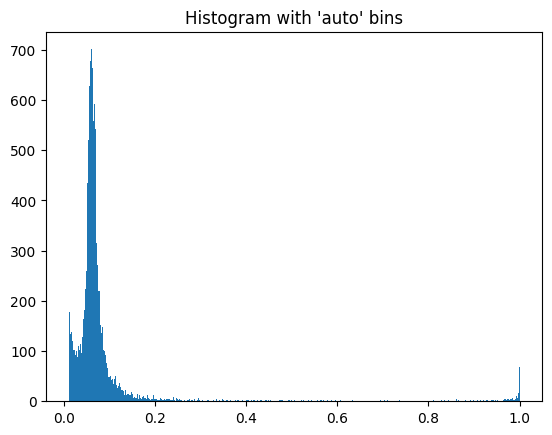

Standard Deviation:  0.14046544679327752
Threshold:  0.37132670845025545
Inclusion Areas:  [369.  58.]


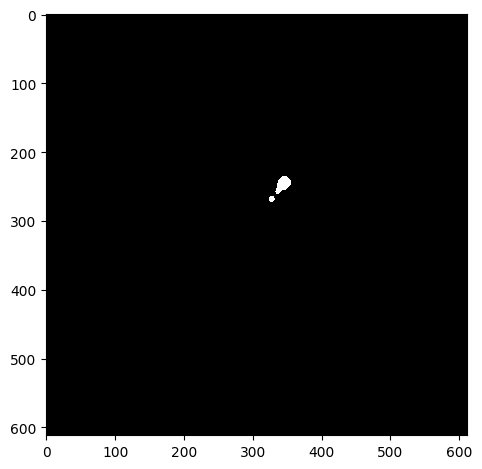

--------------------------------------------------
--------------------------------------------------
1K_ADAMTS19_08.czi
Green Channel


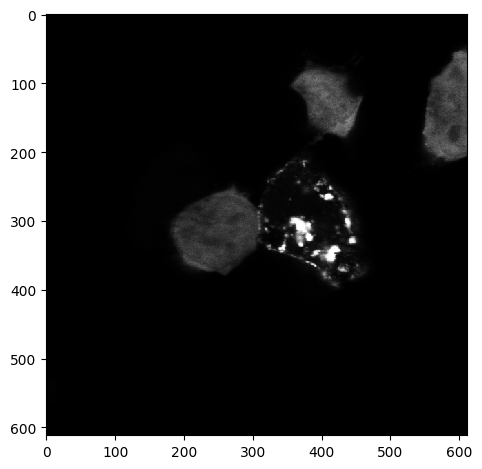

Segmented Cells


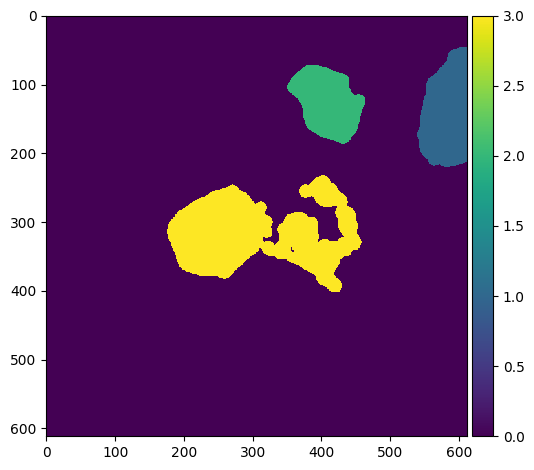

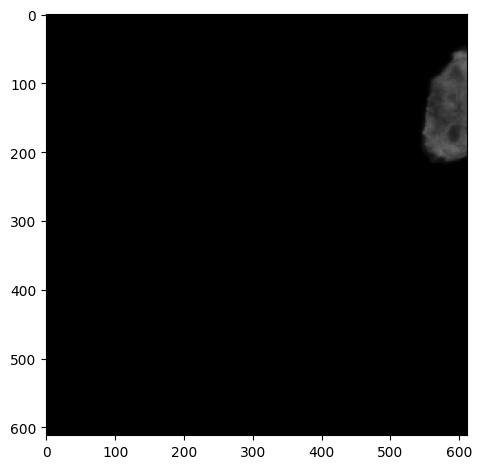

Bin count 41


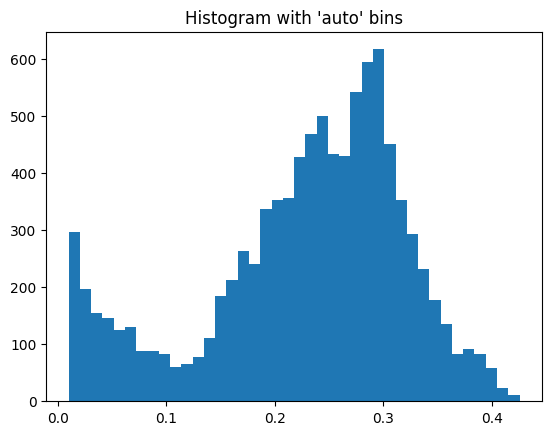

Standard Deviation:  0.0932750841345306
Threshold:  0.41445007533913564


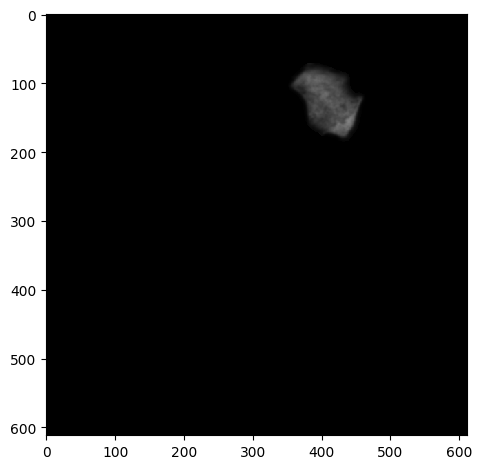

Bin count 29


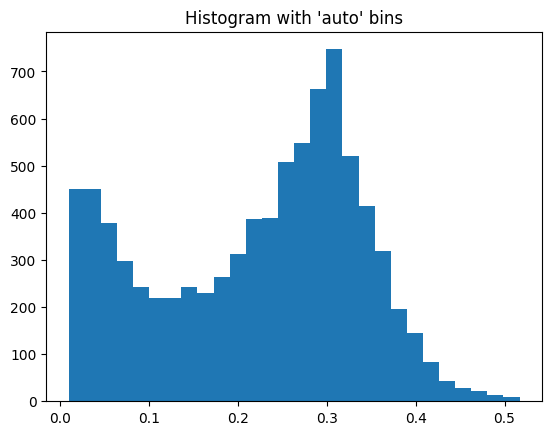

Standard Deviation:  0.11530732226984769
Threshold:  0.4526340111070938
Inclusion Areas:  [60.]


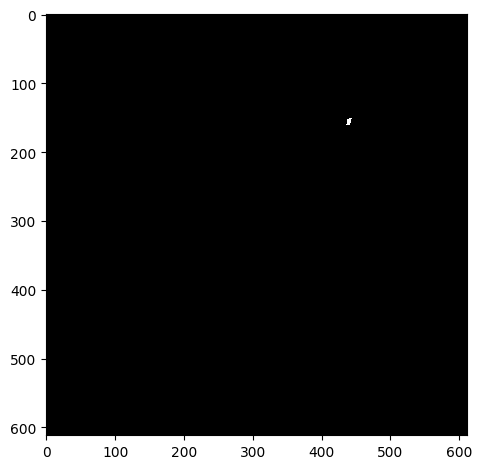

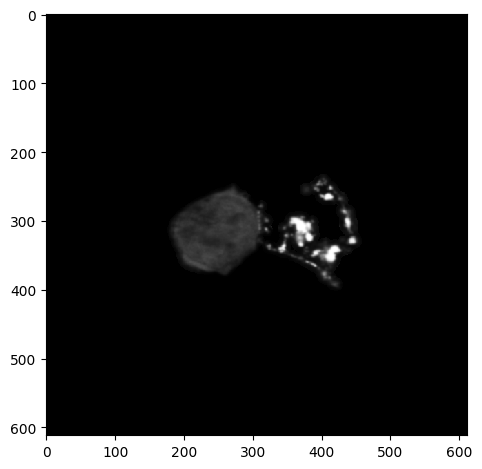

Bin count 102


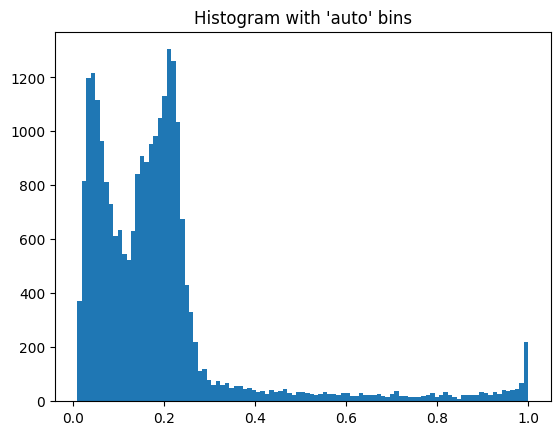

Standard Deviation:  0.18221521361726842
Threshold:  0.5550697562726716
Inclusion Areas:  [106.  12. 664.  87.  62.  66. 322.  61.  15.]


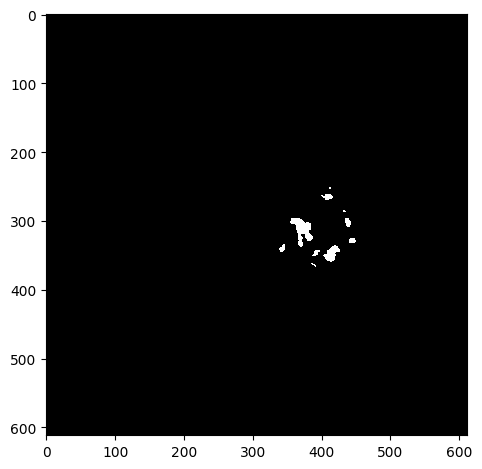

--------------------------------------------------
--------------------------------------------------
1K_ADAMTS19_09.czi
Green Channel


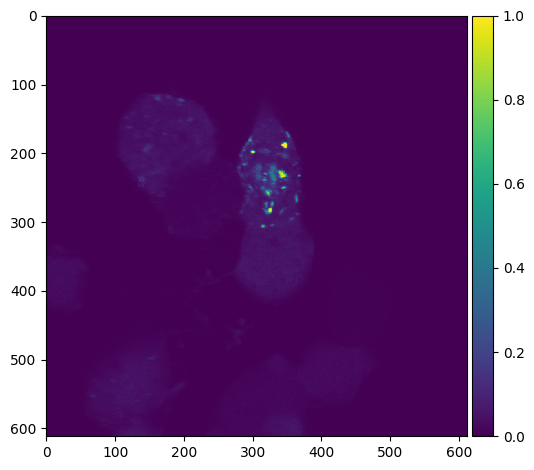

Segmented Cells


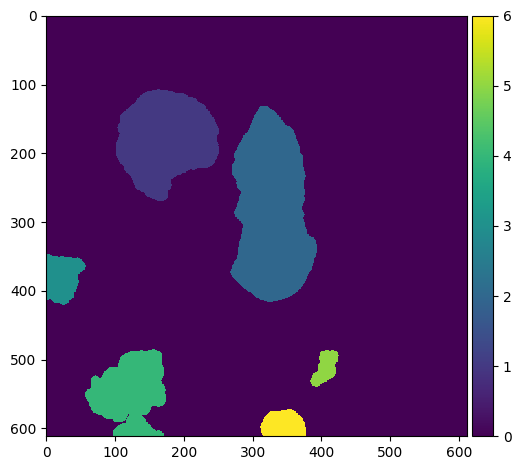

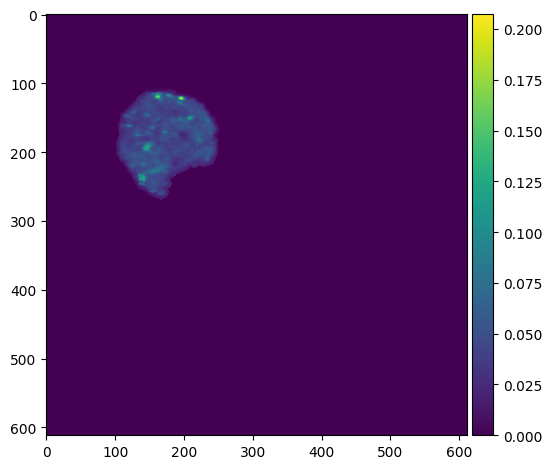

Bin count 171


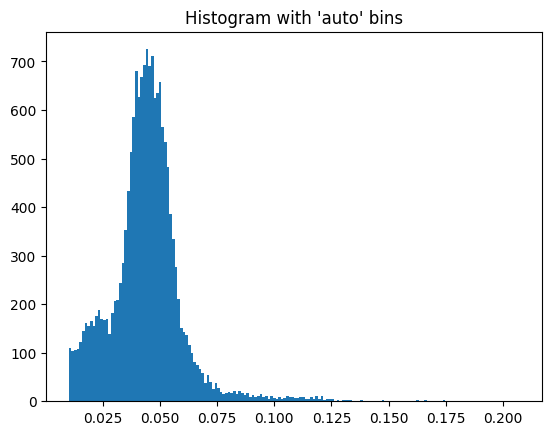

Standard Deviation:  0.016233600215769042
Threshold:  0.07651689921241003
Inclusion Areas:  [ 81.  26.  49.  39. 112.  51.  85.]


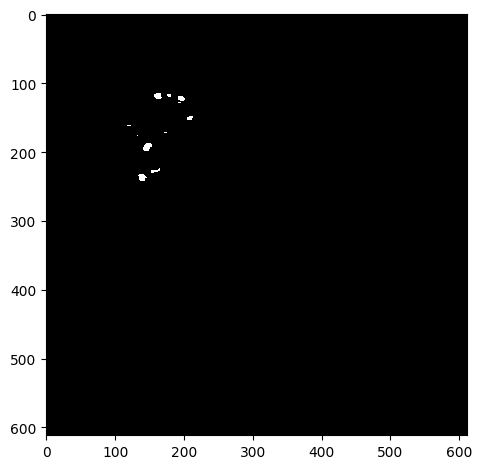

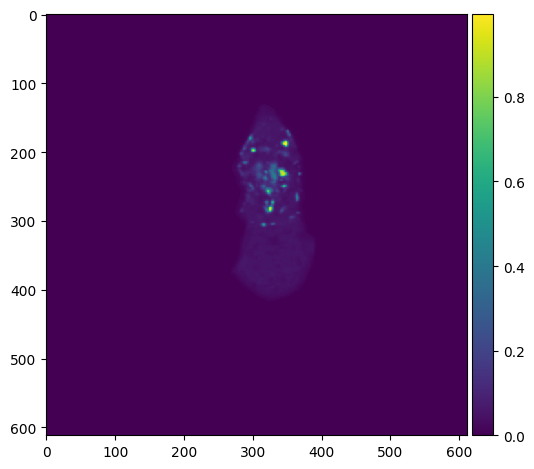

Bin count 616


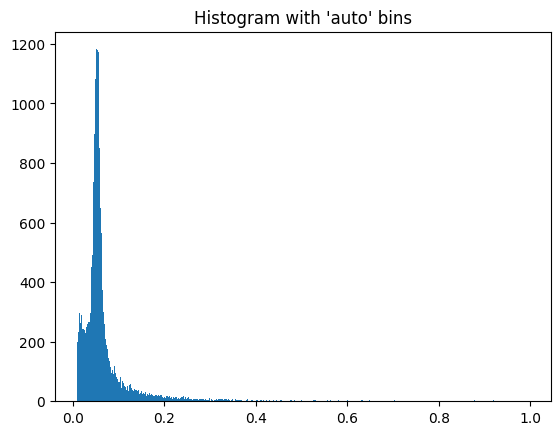

Standard Deviation:  0.08816589619450245
Threshold:  0.25070907367880796
Inclusion Areas:  [ 13.  25.  90.  39.  11. 184. 144.  11.  23.  26.  11.  79.  28. 115.
  15.  21.]


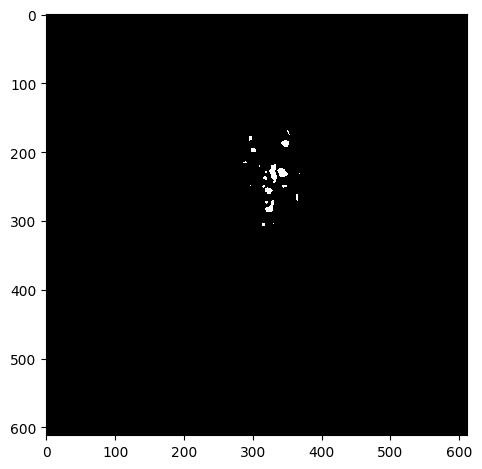

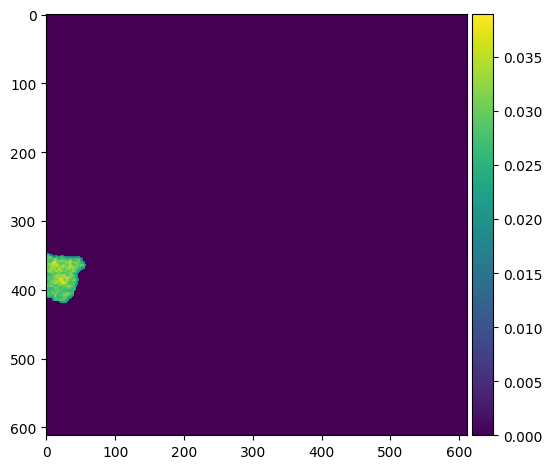

Bin count 47


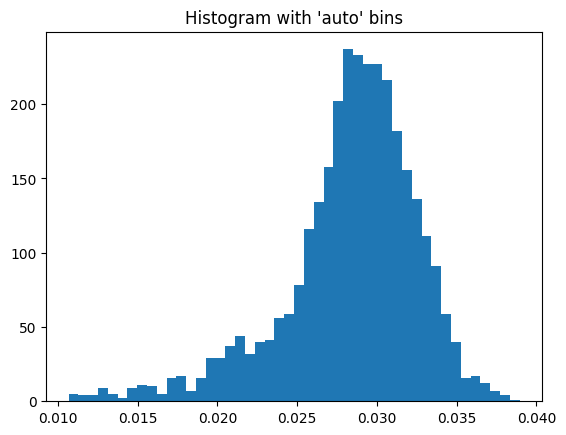

Standard Deviation:  0.004235079988128553
Threshold:  0.03682512723775848


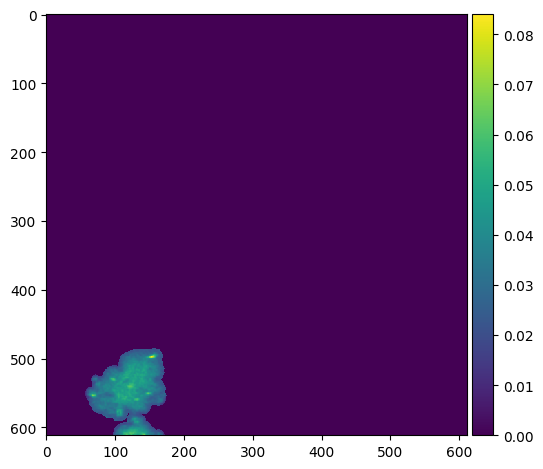

Bin count 52


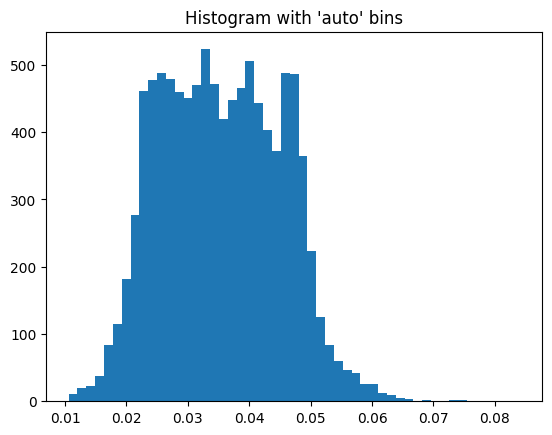

Standard Deviation:  0.00983125192045602
Threshold:  0.05517174984626412
Inclusion Areas:  [32. 11. 38. 16. 58. 14.]


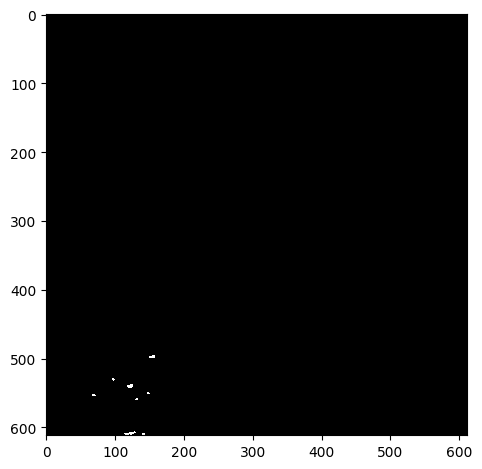

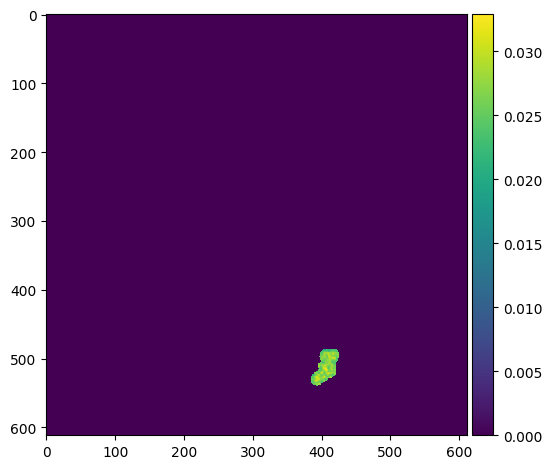

Bin count 32


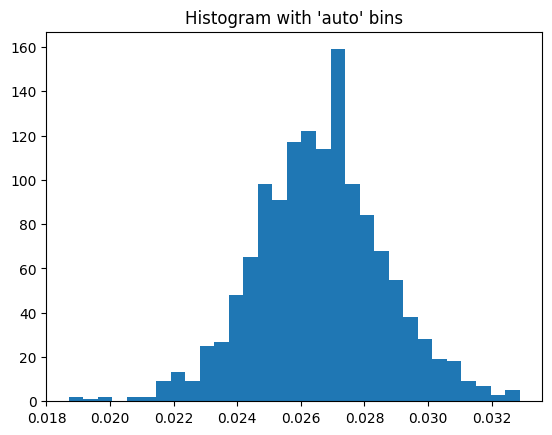

Standard Deviation:  0.002033799694407246
Threshold:  0.03067598523295934
Inclusion Areas:  [15.]


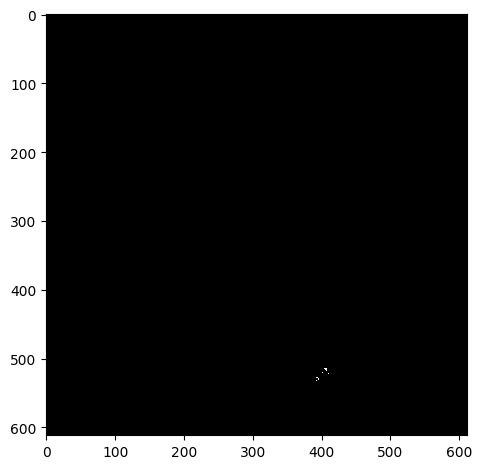

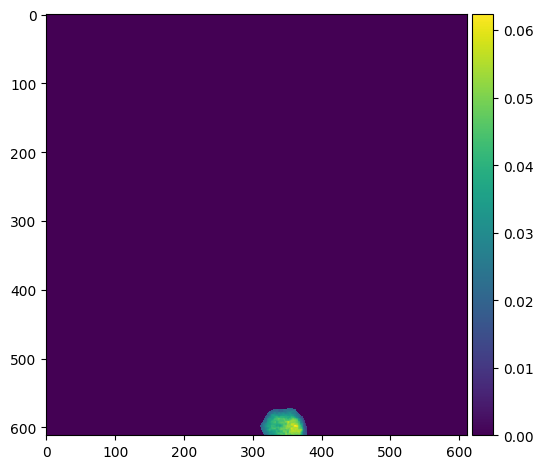

Bin count 19


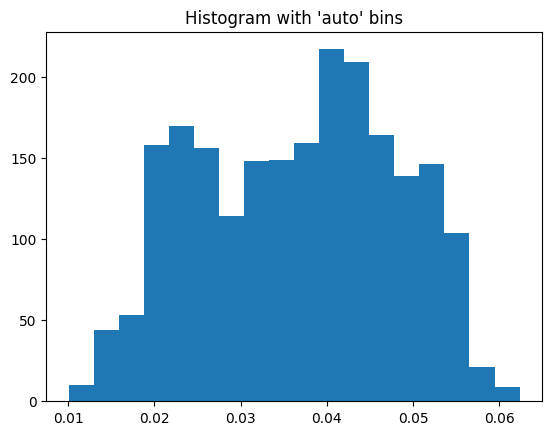

Standard Deviation:  0.01144364087261034
Threshold:  0.05950585295085712
--------------------------------------------------
--------------------------------------------------
1K_ADAMTS19_10.czi
Green Channel


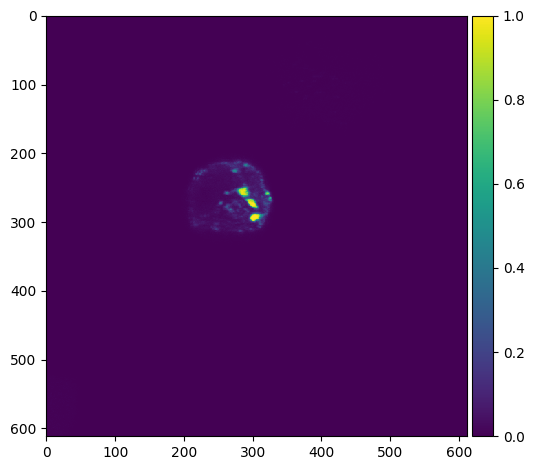

Segmented Cells


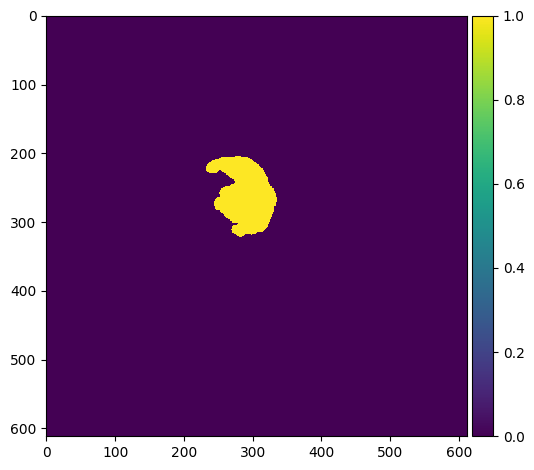

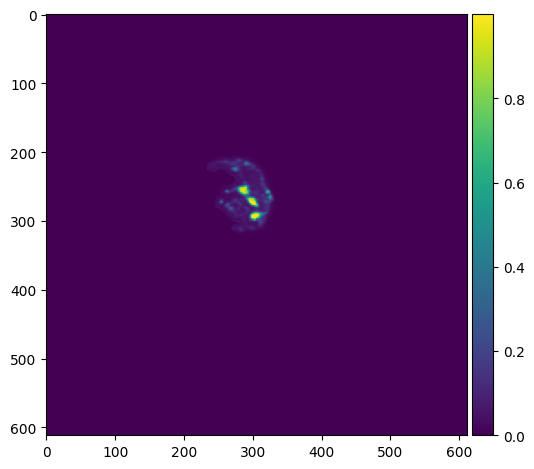

Bin count 122


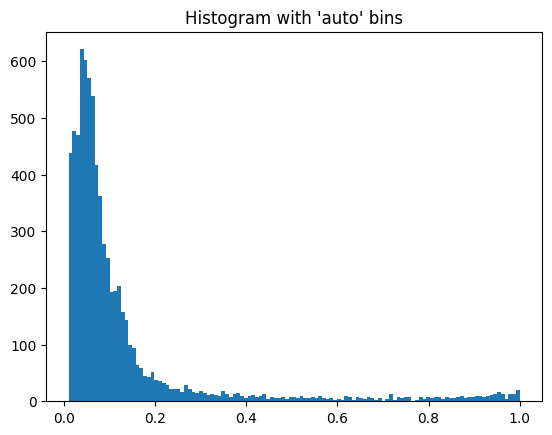

Standard Deviation:  0.1840036080875382
Threshold:  0.4956144156111952
Inclusion Areas:  [155.  12. 131. 130.]


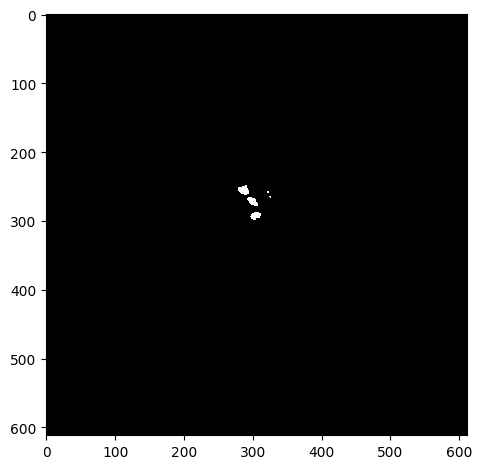

--------------------------------------------------
--------------------------------------------------
1K_SCR_01.czi
Green Channel


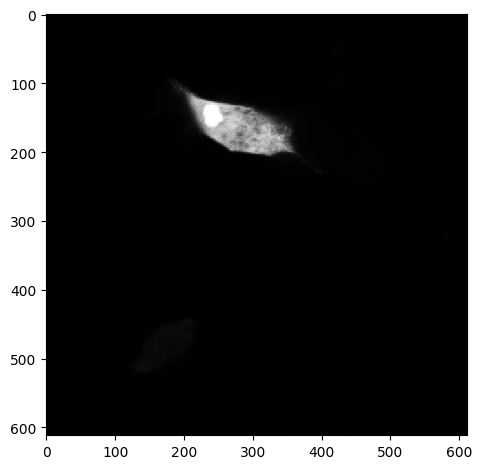

Segmented Cells


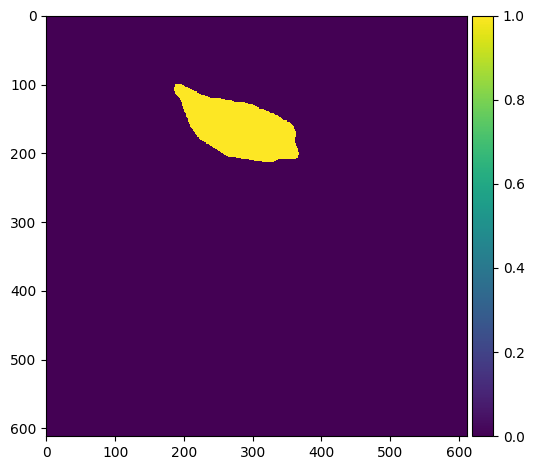

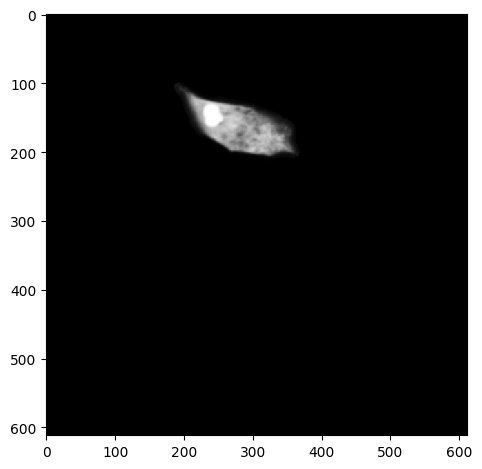

Bin count 22


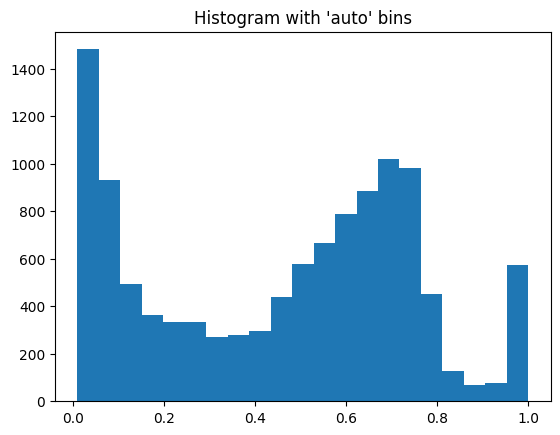

Standard Deviation:  0.29176001612379243
Threshold:  1.0404480834944203
--------------------------------------------------
--------------------------------------------------
1K_SCR_02.czi
Green Channel


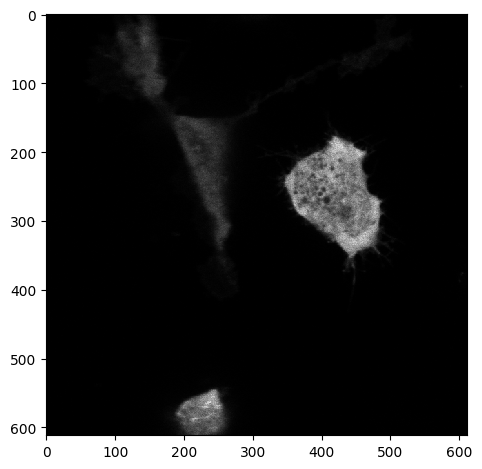

Segmented Cells


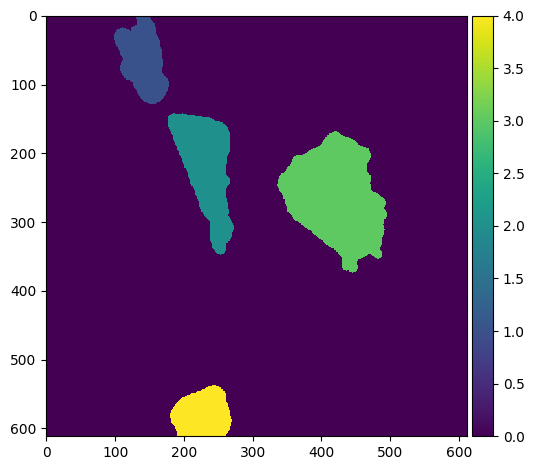

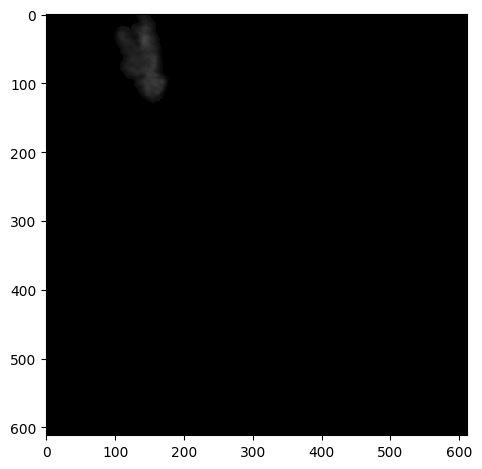

Bin count 32


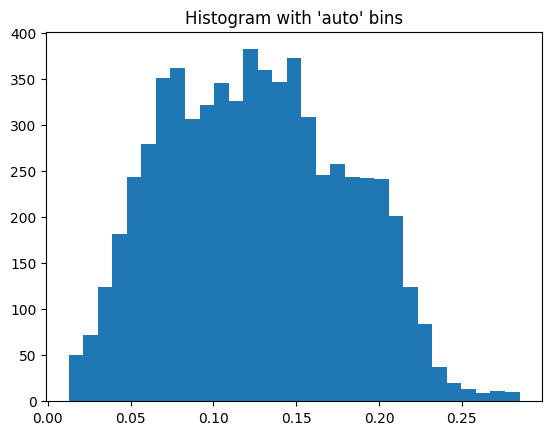

Standard Deviation:  0.053845858465454983
Threshold:  0.23350271747967138
Inclusion Areas:  [91.]


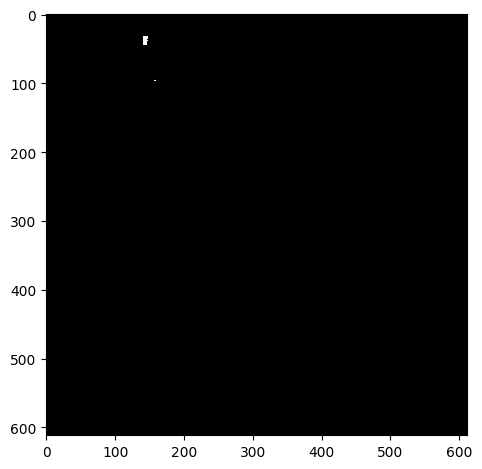

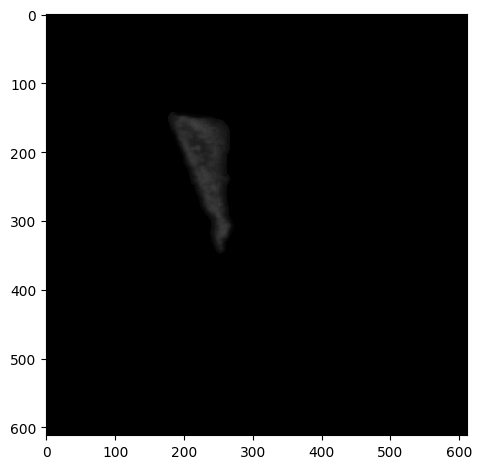

Bin count 29


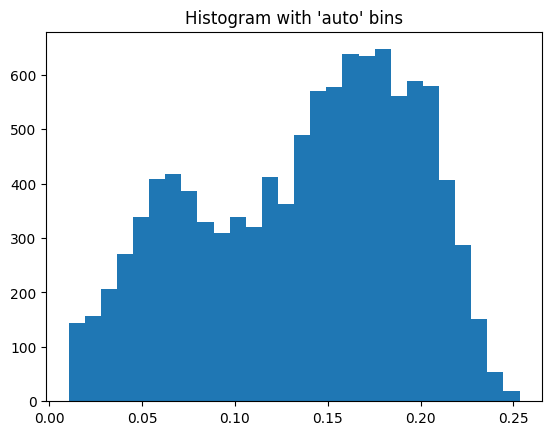

Standard Deviation:  0.0577551329663386
Threshold:  0.25263967210734756


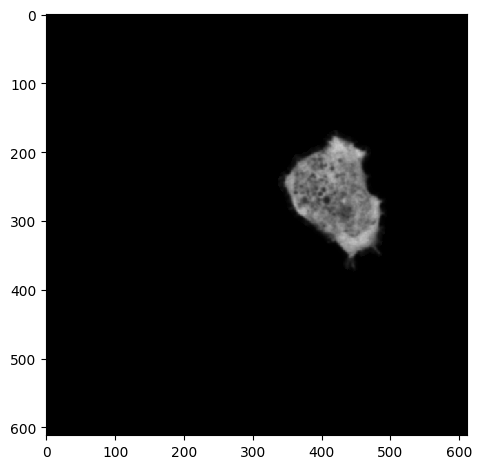

Bin count 42


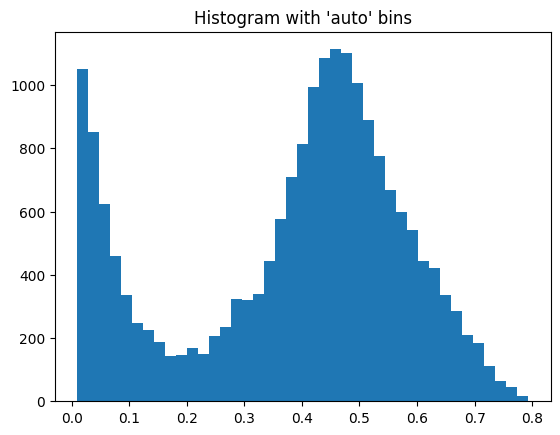

Standard Deviation:  0.19666873062868814
Threshold:  0.7778659277634091


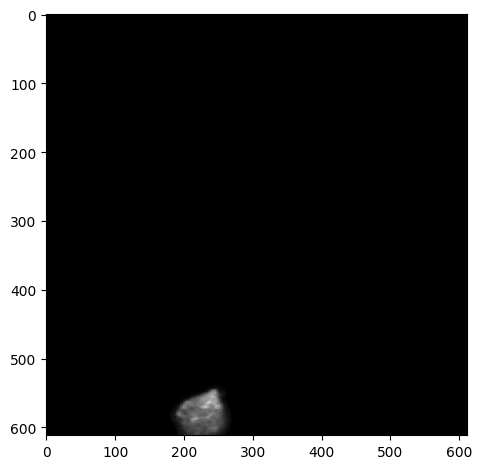

Bin count 25


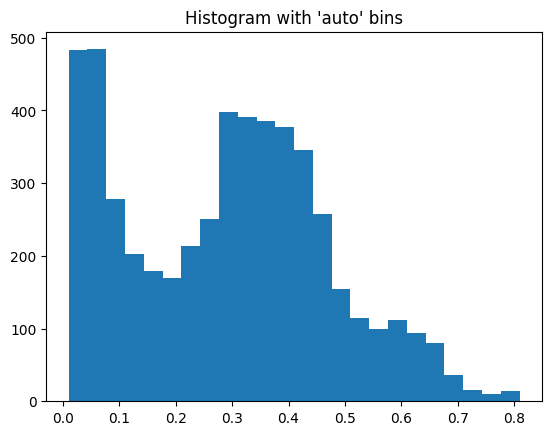

Standard Deviation:  0.18111207764592757
Threshold:  0.6517667347230989
Inclusion Areas:  [23. 55. 11. 30.]


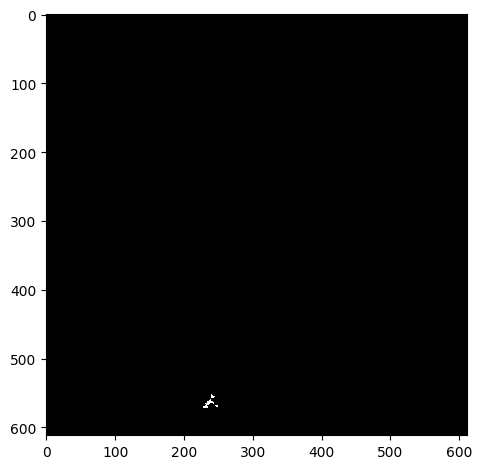

--------------------------------------------------
--------------------------------------------------
1K_SCR_03.czi
Green Channel


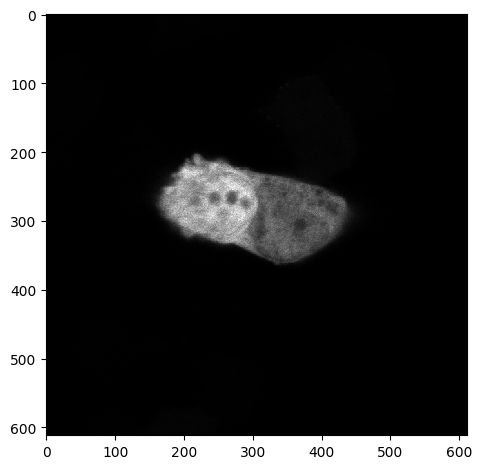

Segmented Cells


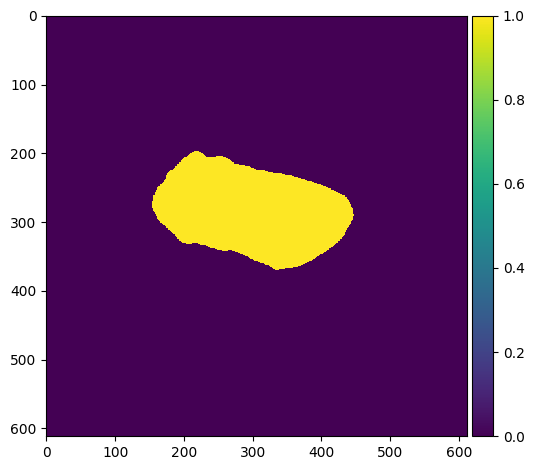

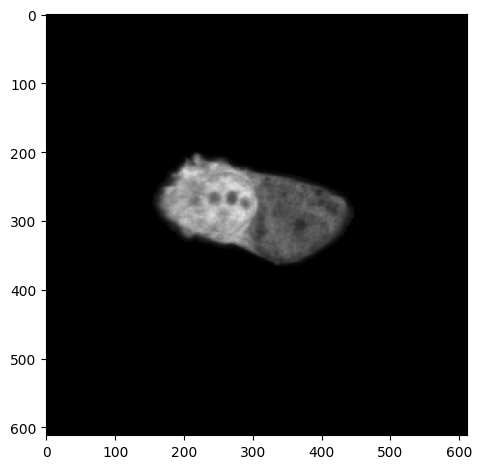

Bin count 45


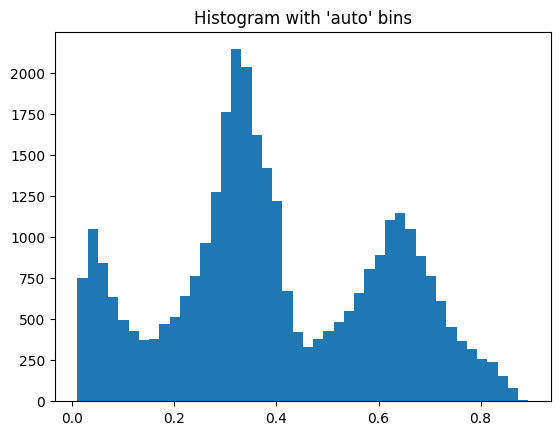

Standard Deviation:  0.21239776288625165
Threshold:  0.8254506478021857
Inclusion Areas:  [ 39. 105.  49.  93.  26.]


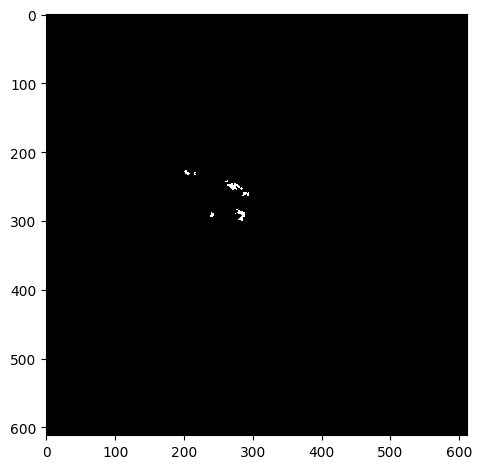

--------------------------------------------------
--------------------------------------------------
1K_SCR_04.czi
Green Channel


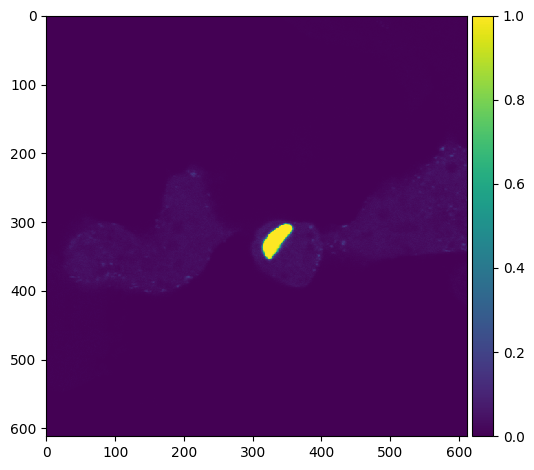

Segmented Cells


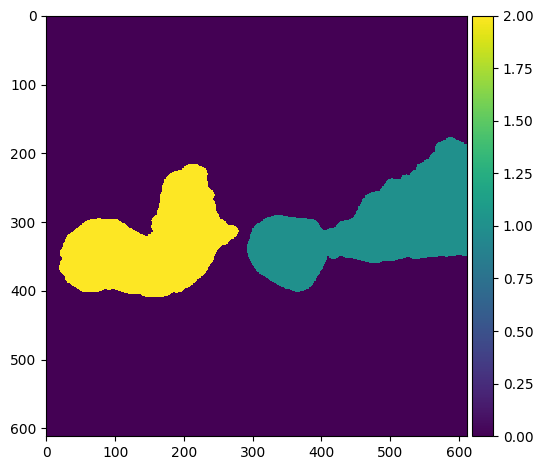

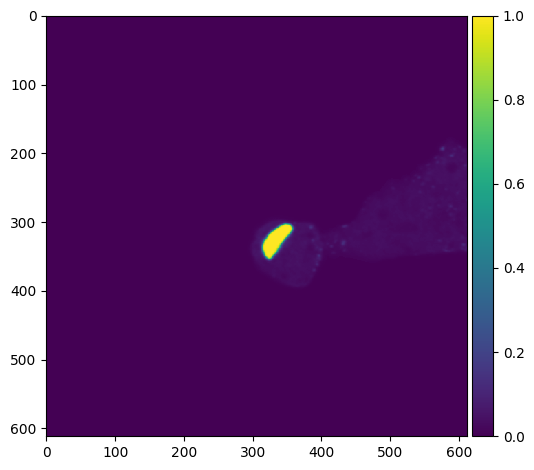

Bin count 1348


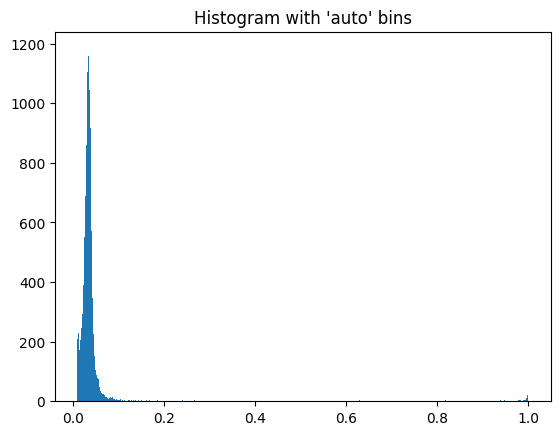

Standard Deviation:  0.17553628817878328
Threshold:  0.42192477436802694
Inclusion Areas:  [1232.]


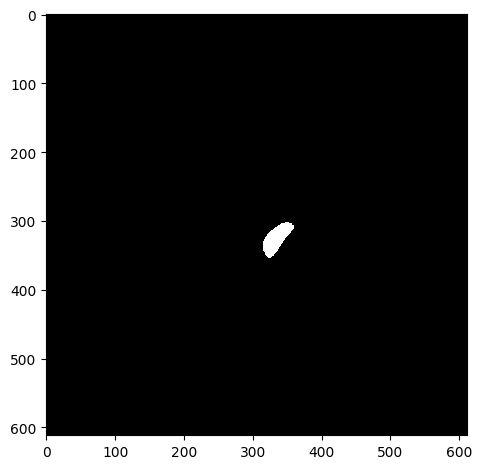

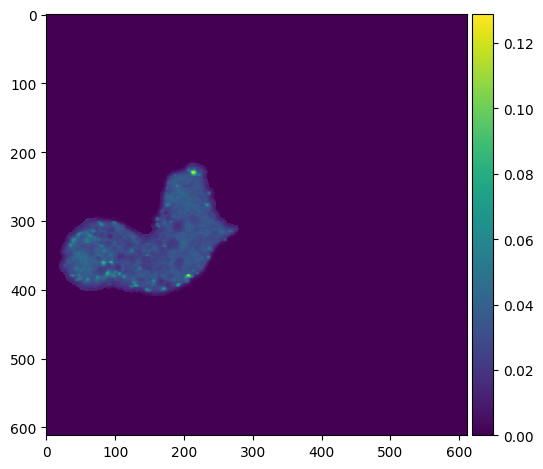

Bin count 188


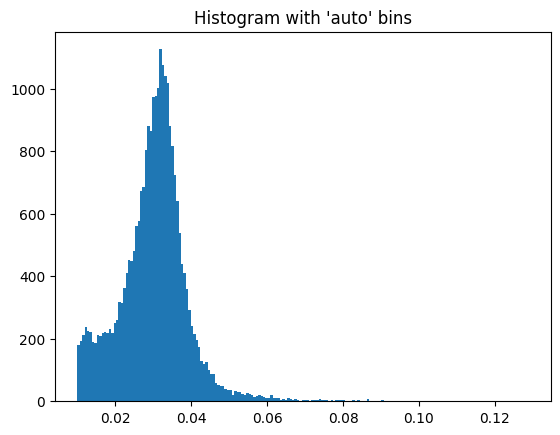

Standard Deviation:  0.009454632146879896
Threshold:  0.04914267950887083
Inclusion Areas:  [74. 16. 17. 18. 21. 49. 13. 12. 39. 22. 64. 16. 64. 17. 12. 14. 12. 39.
 18. 16. 12.]


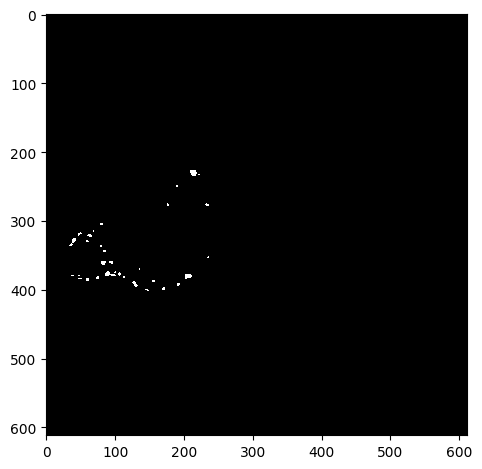

--------------------------------------------------
--------------------------------------------------
1K_SCR_05.czi
Green Channel


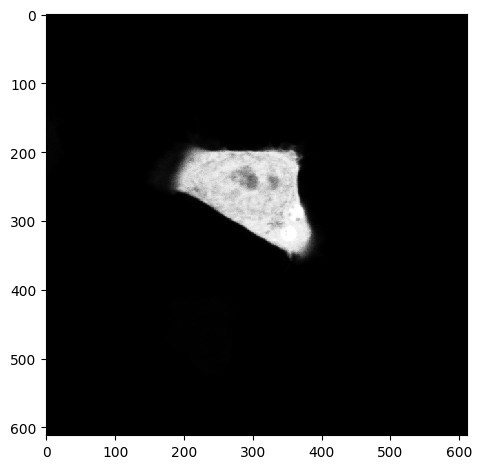

Segmented Cells


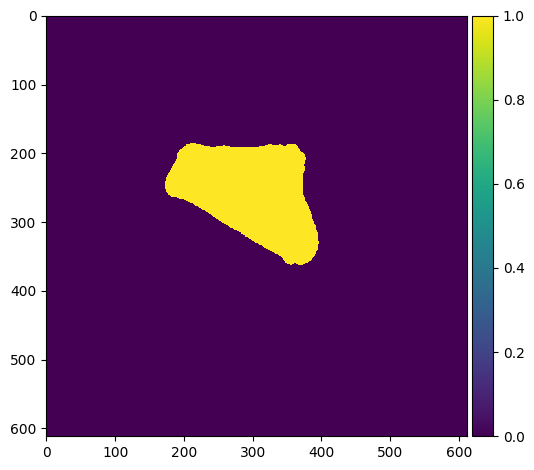

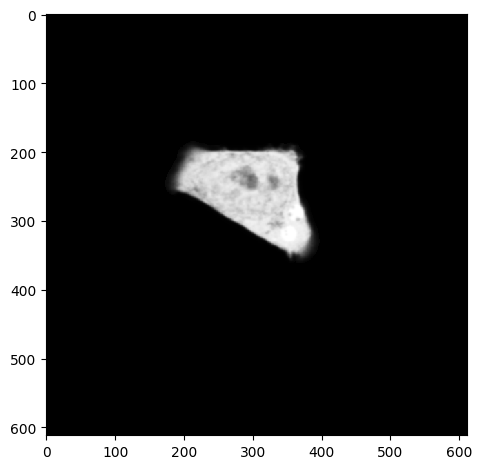

Bin count 42


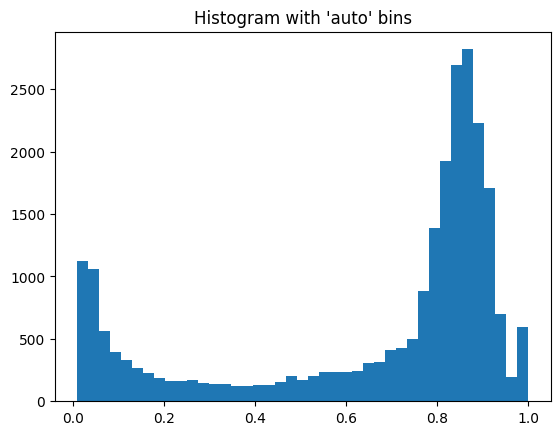

Standard Deviation:  0.30841158457017204
Threshold:  1.2789761483233963
--------------------------------------------------
--------------------------------------------------
1K_SCR_06.czi
Green Channel


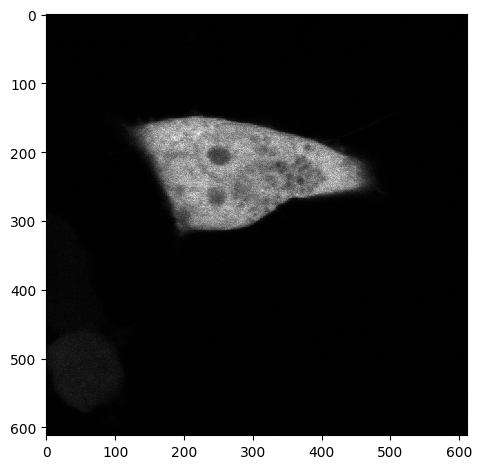

Segmented Cells


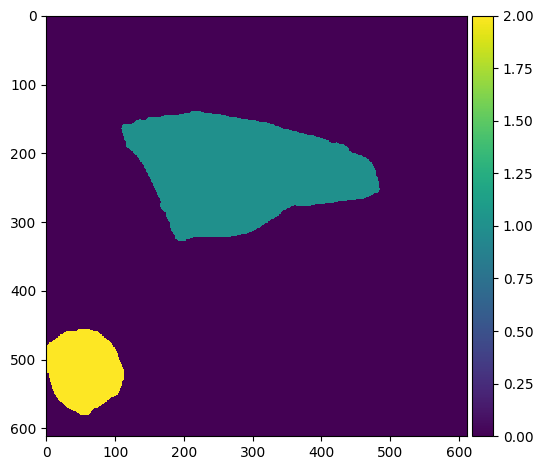

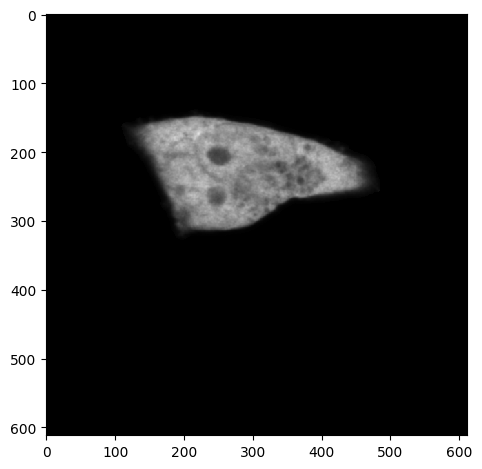

Bin count 56


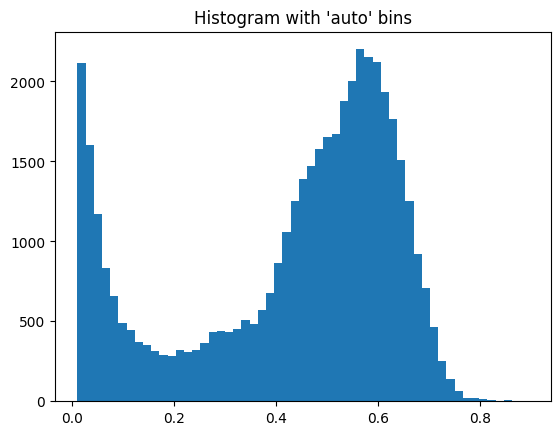

Standard Deviation:  0.21001154137235123
Threshold:  0.8500279111261935


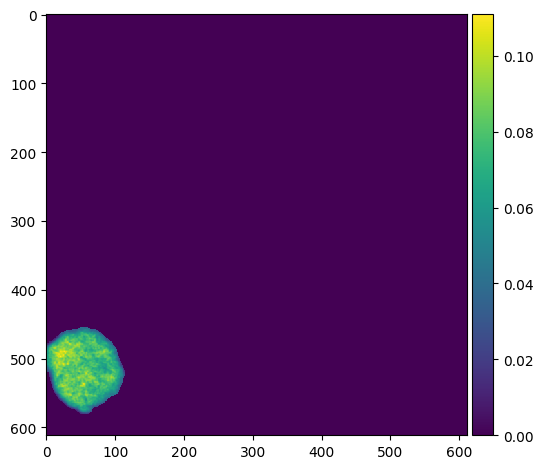

Bin count 60


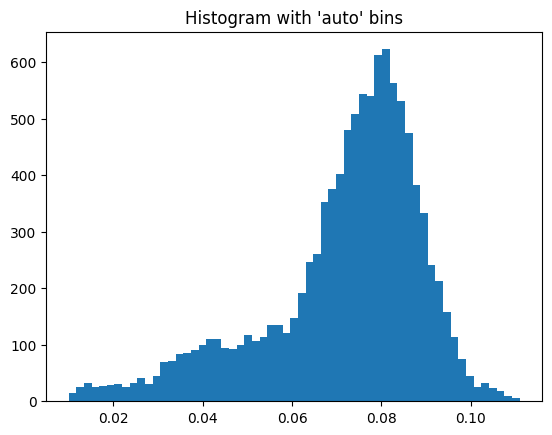

Standard Deviation:  0.017717382527198008
Threshold:  0.10717313550639074
--------------------------------------------------
--------------------------------------------------
1K_SCR_07.czi
Green Channel


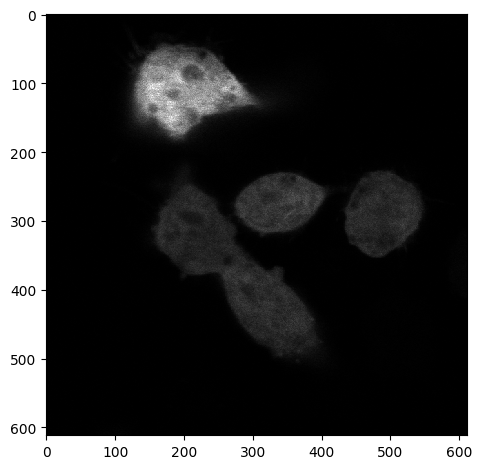

Segmented Cells


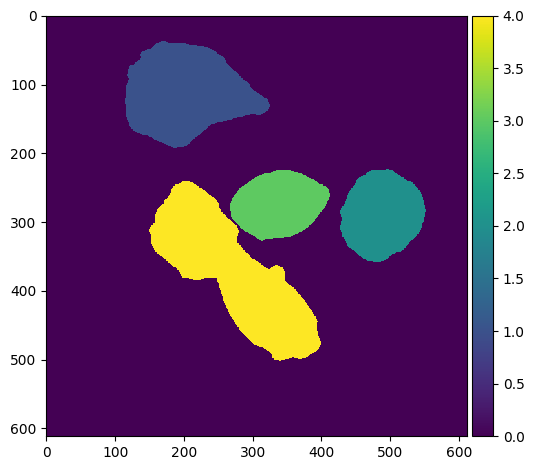

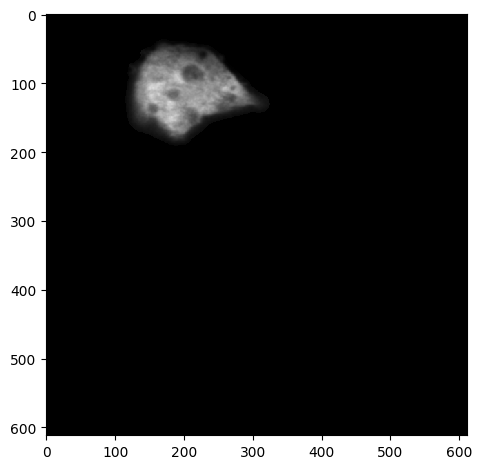

Bin count 30


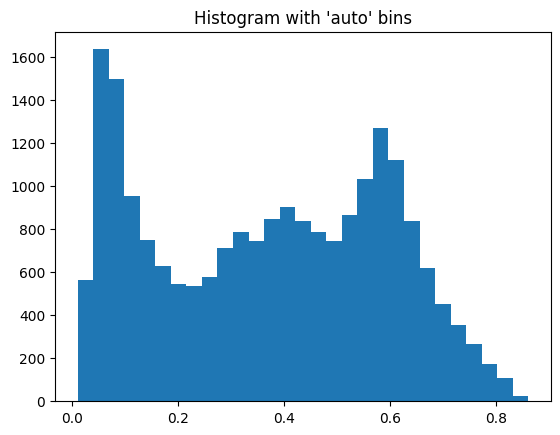

Standard Deviation:  0.22033336972388967
Threshold:  0.81148598568815
Inclusion Areas:  [60. 11.]


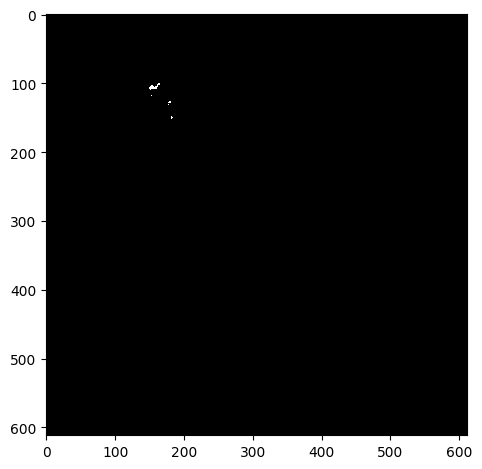

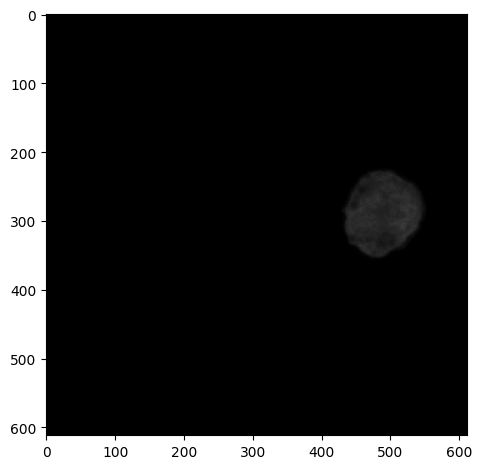

Bin count 50


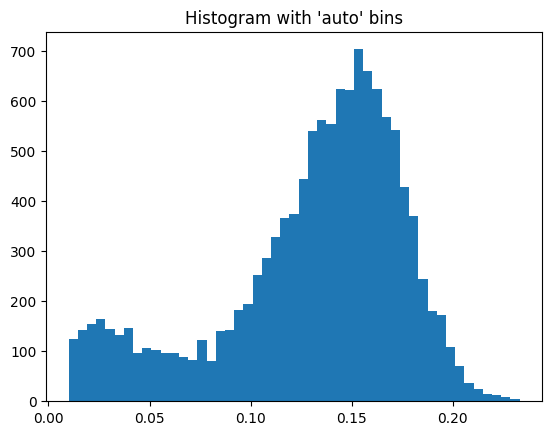

Standard Deviation:  0.04585262142930455
Threshold:  0.22221431751691262
Inclusion Areas:  [17.]


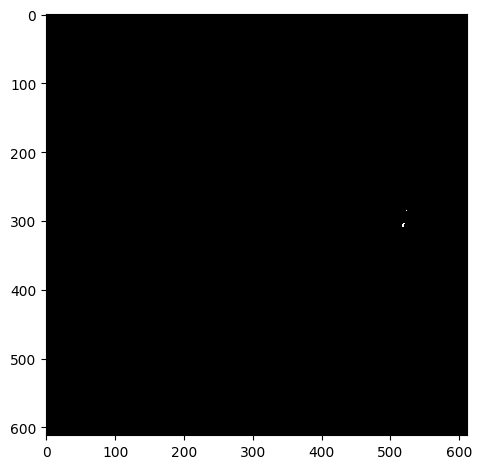

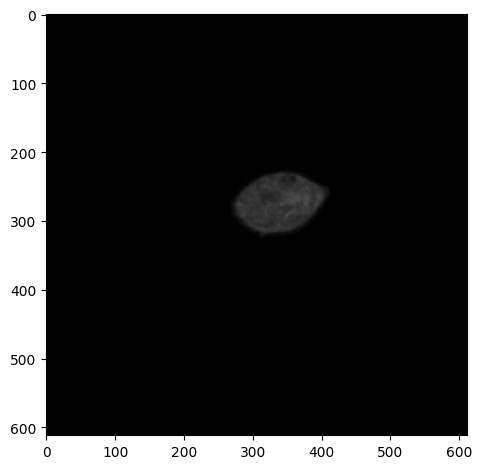

Bin count 44


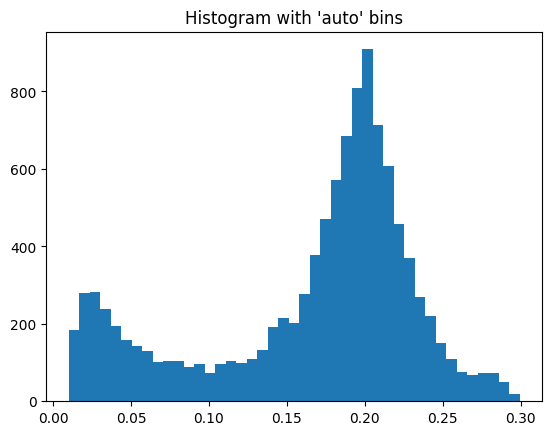

Standard Deviation:  0.06875290636949359
Threshold:  0.3030449808456927


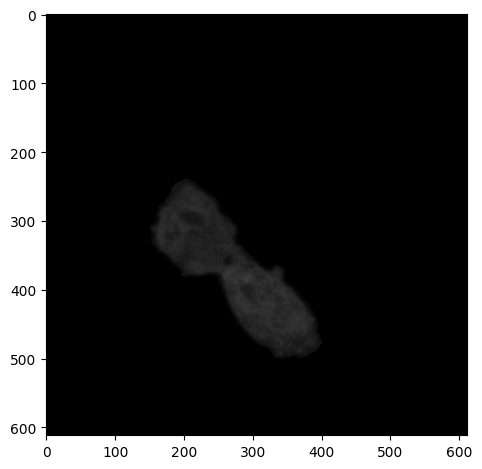

Bin count 72


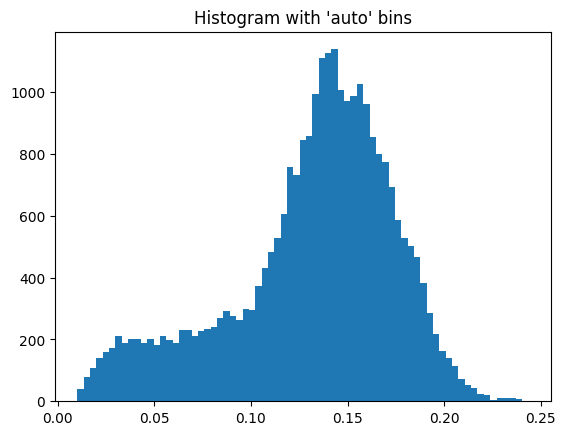

Standard Deviation:  0.04296064038112007
Threshold:  0.21737211861433486
Inclusion Areas:  [67.]


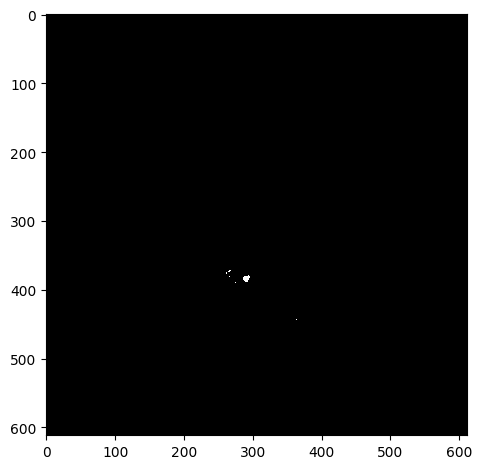

--------------------------------------------------
--------------------------------------------------
1K_SCR_08.czi
Green Channel


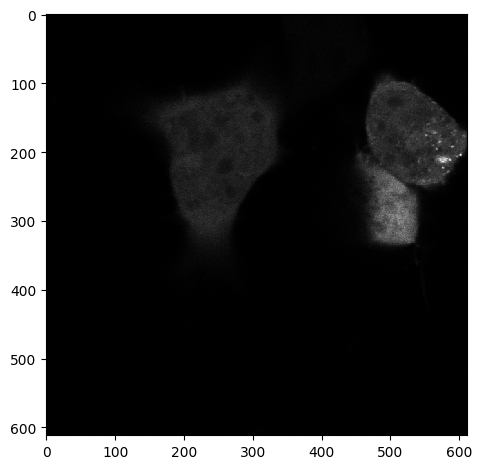

Segmented Cells


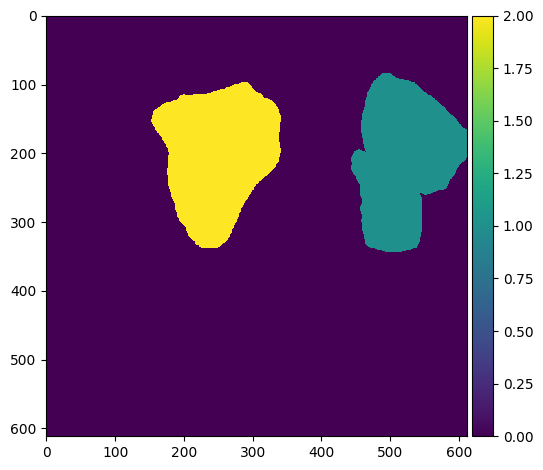

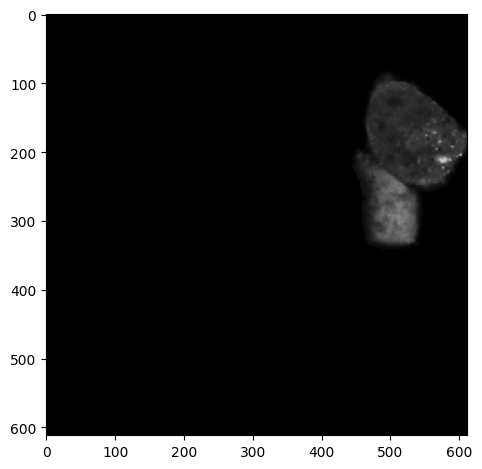

Bin count 135


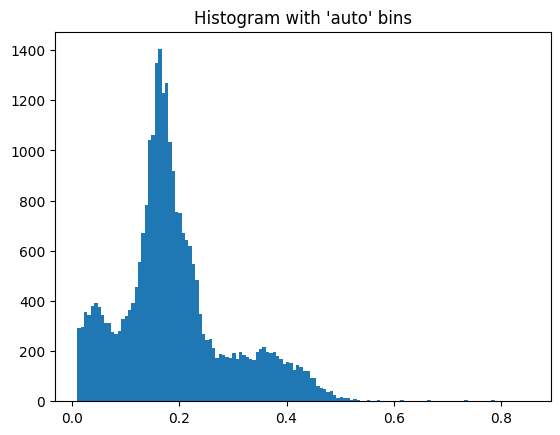

Standard Deviation:  0.1050646936539563
Threshold:  0.4021830692493682
Inclusion Areas:  [ 14.  14.  12. 145. 301. 949.  35.]


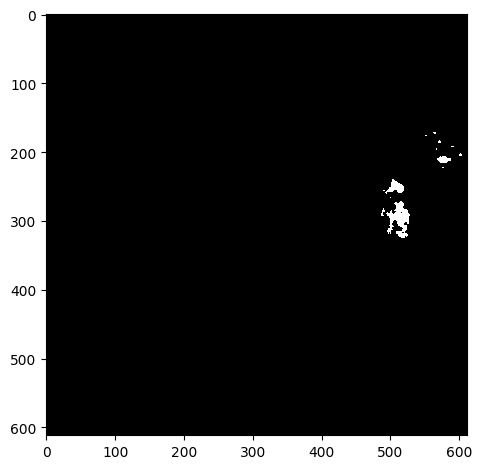

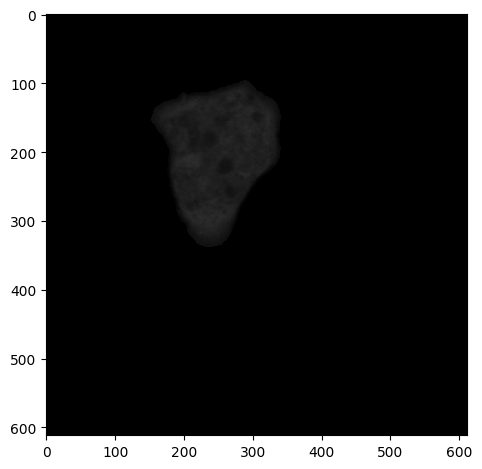

Bin count 82


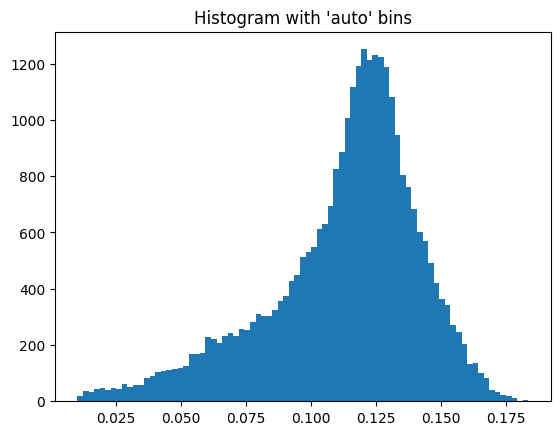

Standard Deviation:  0.029187563293599655
Threshold:  0.17101643644287684
Inclusion Areas:  [35. 25.]


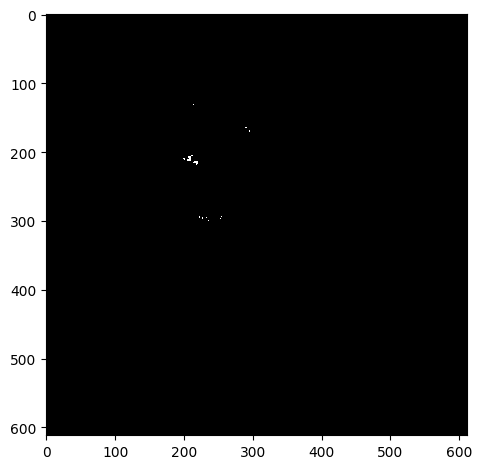

--------------------------------------------------
--------------------------------------------------
1K_SCR_09.czi
Green Channel


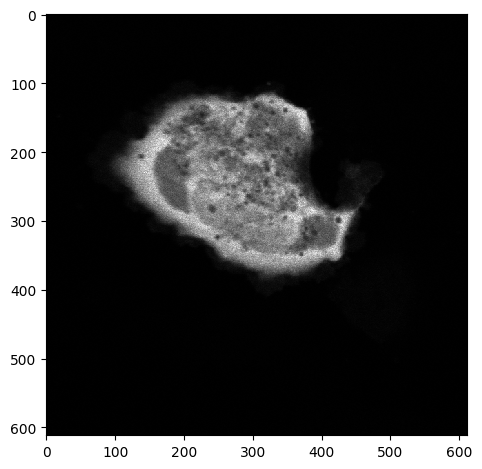

Segmented Cells


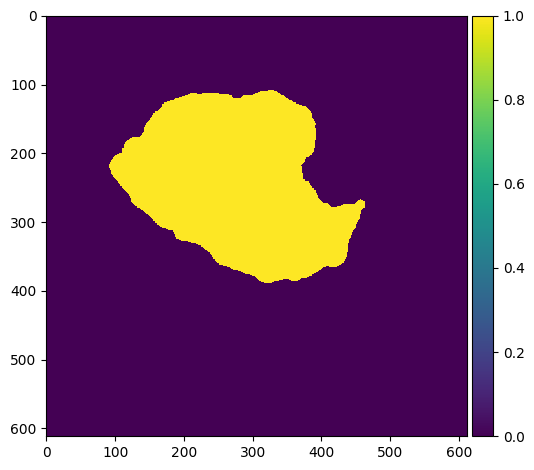

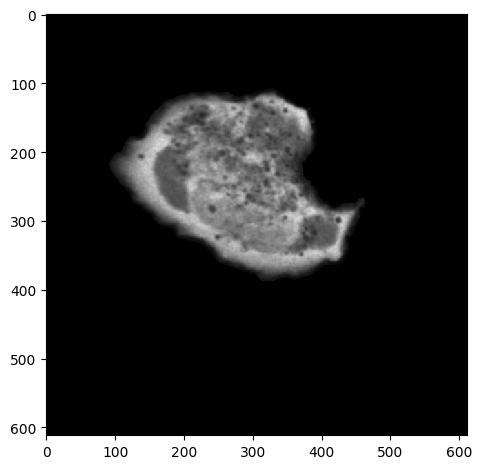

Bin count 77


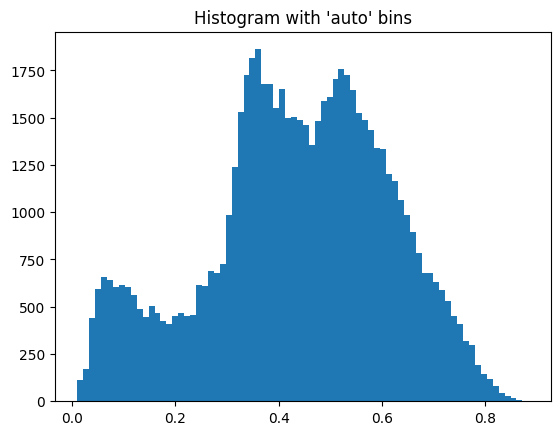

Standard Deviation:  0.17798514572791724
Threshold:  0.7911835509292455
Inclusion Areas:  [ 90.  29. 161.  42.  12.  41.  11.  17.]


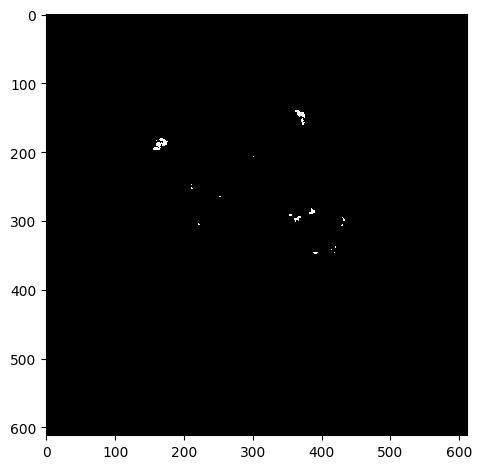

--------------------------------------------------
--------------------------------------------------
1K_SCR_10.czi
Green Channel


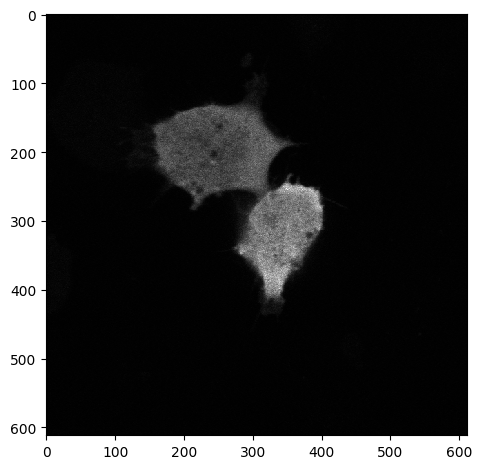

Segmented Cells


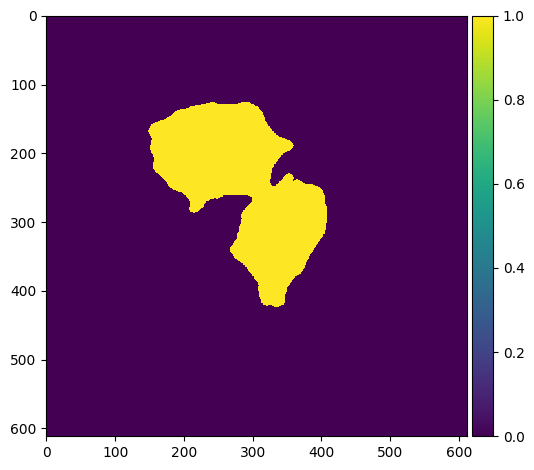

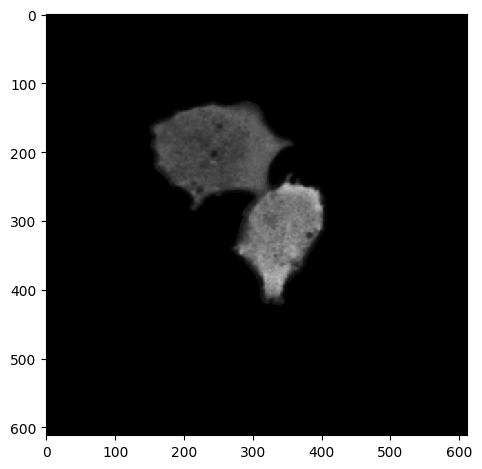

Bin count 67


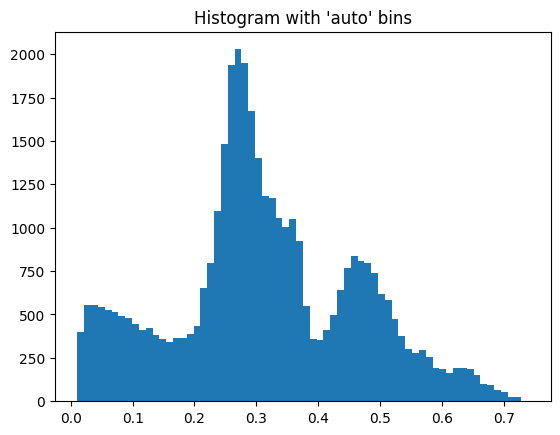

Standard Deviation:  0.1498284315025204
Threshold:  0.6128888998549699
Inclusion Areas:  [534.  24.  29.  12. 545.]


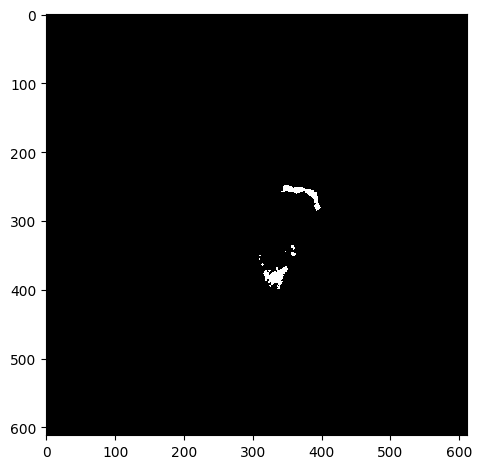

--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_01.czi
Green Channel


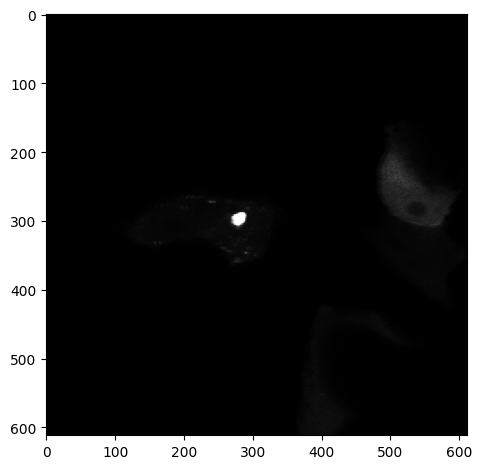

Segmented Cells


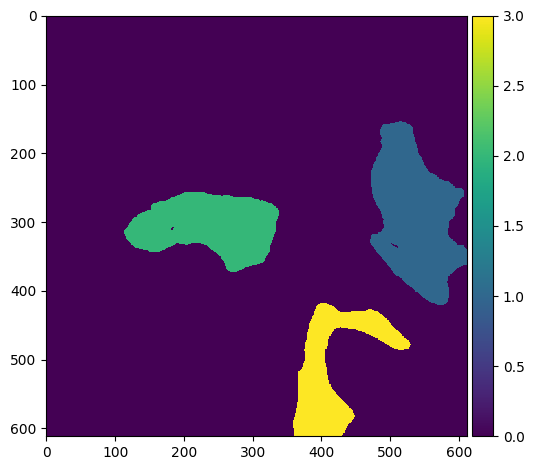

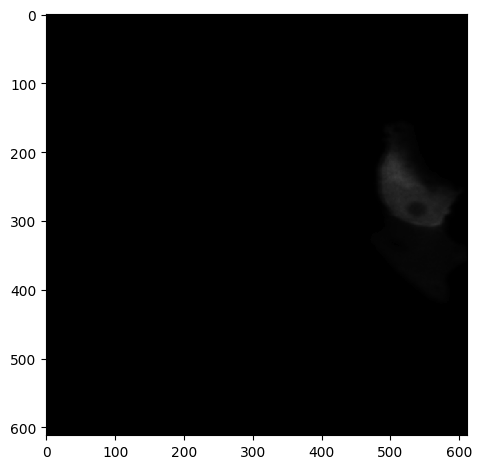

Bin count 46


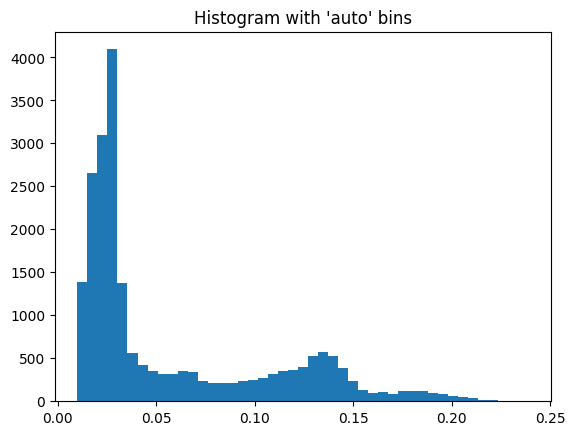

Standard Deviation:  0.05030476778479814
Threshold:  0.15867135604371377
Inclusion Areas:  [951.  32.]


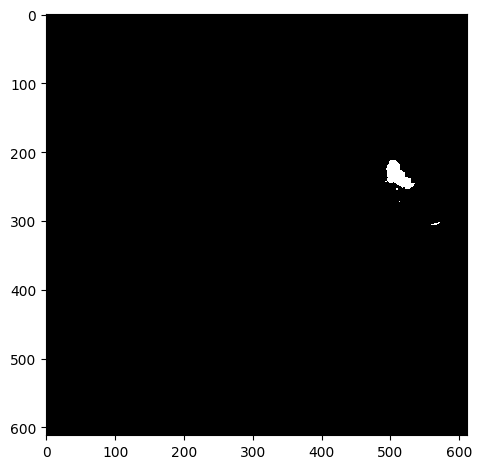

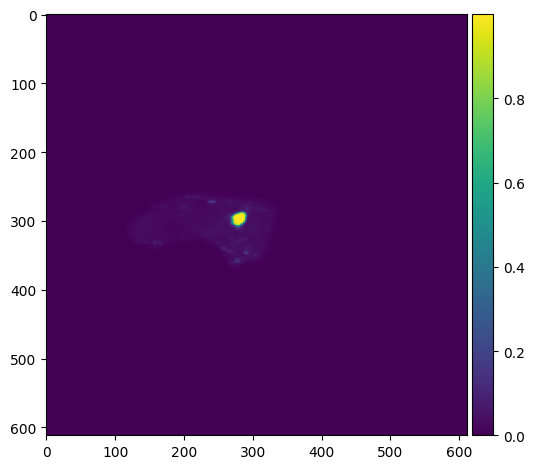

Bin count 847


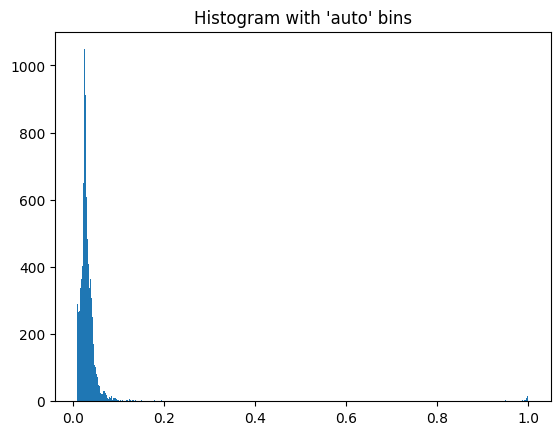

Standard Deviation:  0.12600313422275744
Threshold:  0.3028425483009543
Inclusion Areas:  [371.]


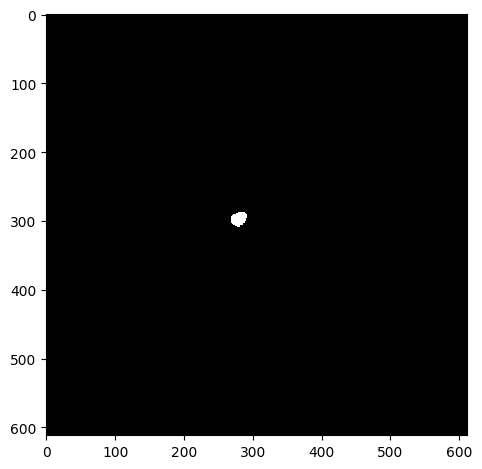

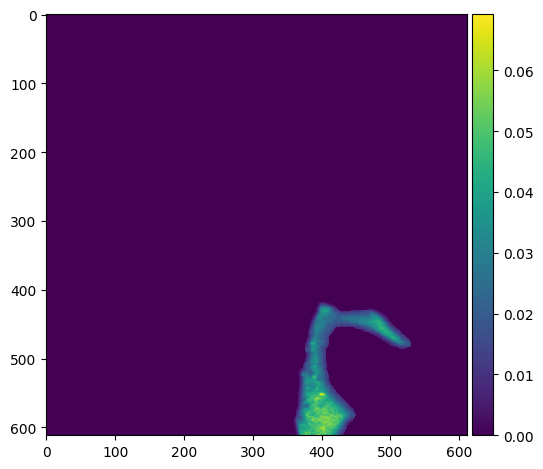

Bin count 33


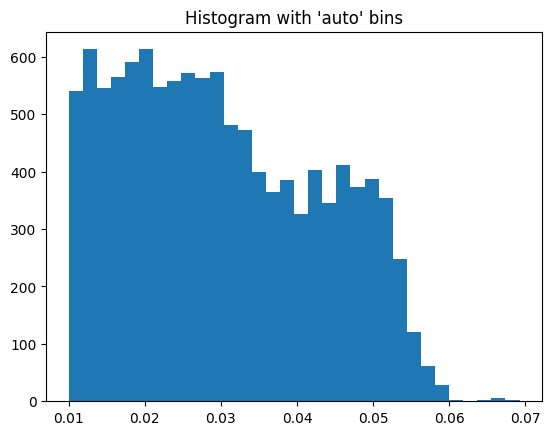

Standard Deviation:  0.012850172249695552
Threshold:  0.05588667672347014
Inclusion Areas:  [20. 14. 21. 15. 34.]


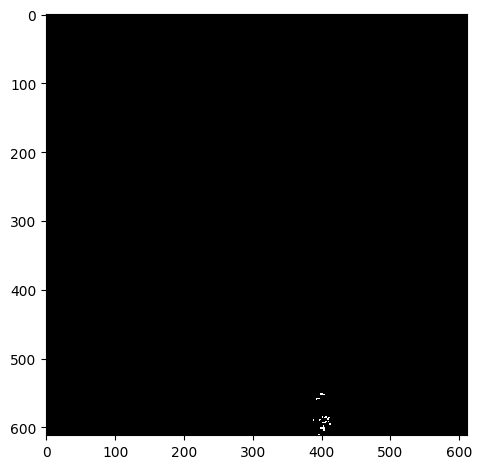

--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_02.czi
Green Channel


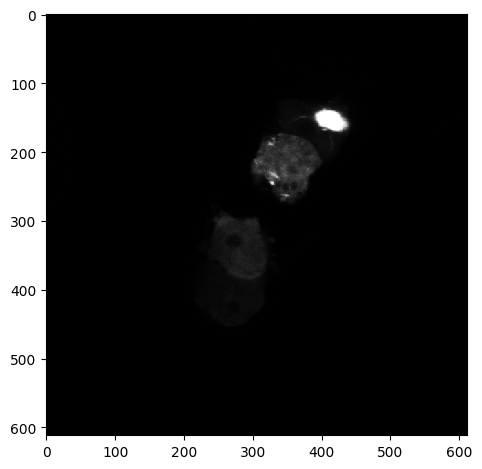

Segmented Cells


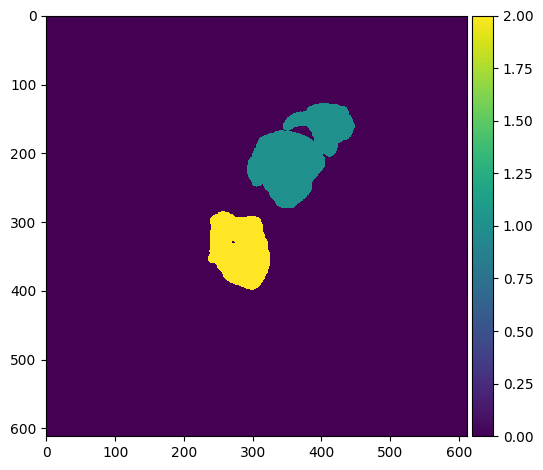

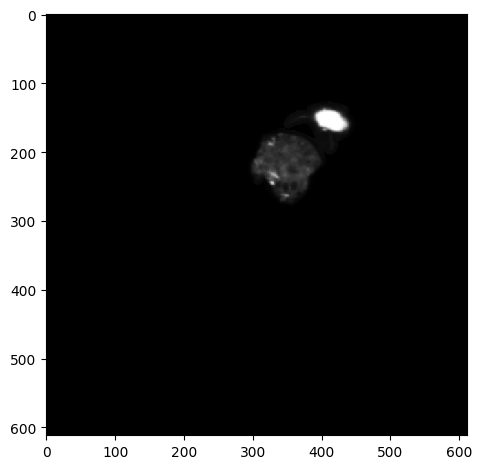

Bin count 76


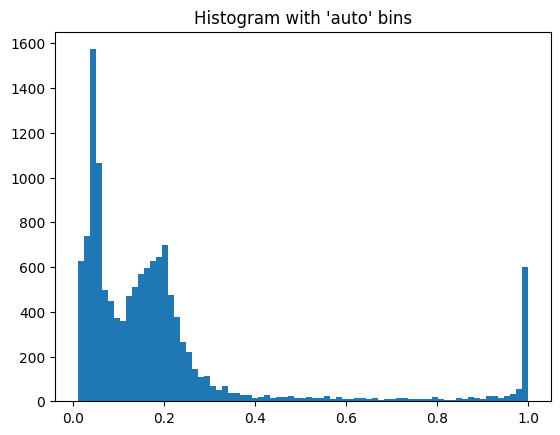

Standard Deviation:  0.2357807357783154
Threshold:  0.6696084162073933
Inclusion Areas:  [955.  11.]


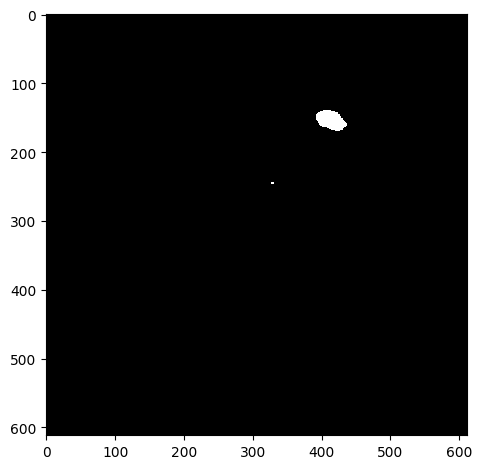

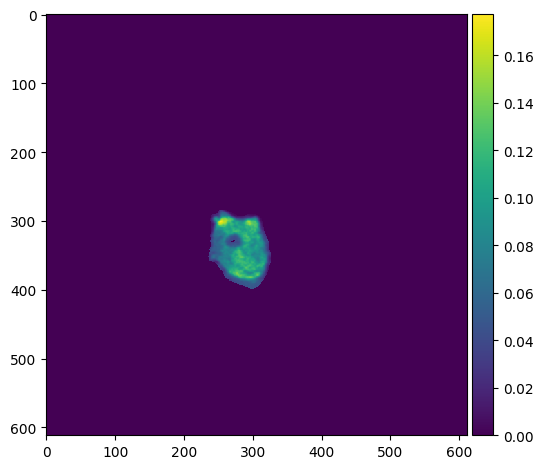

Bin count 33


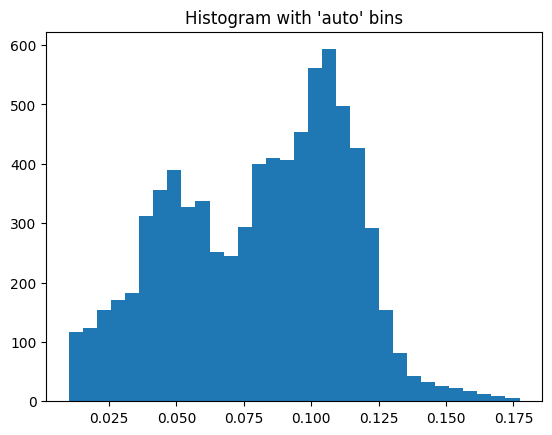

Standard Deviation:  0.03231111602565423
Threshold:  0.14567364885128653
Inclusion Areas:  [80. 15.]


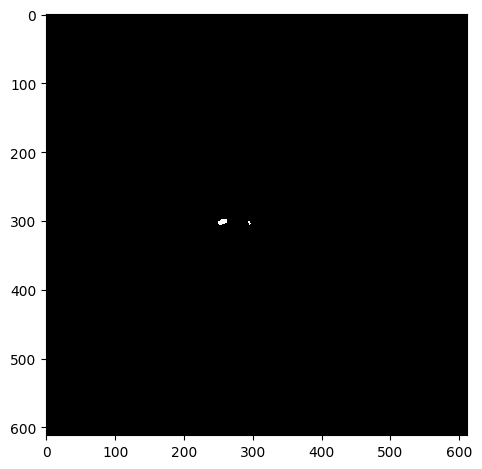

--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_03.czi
Green Channel


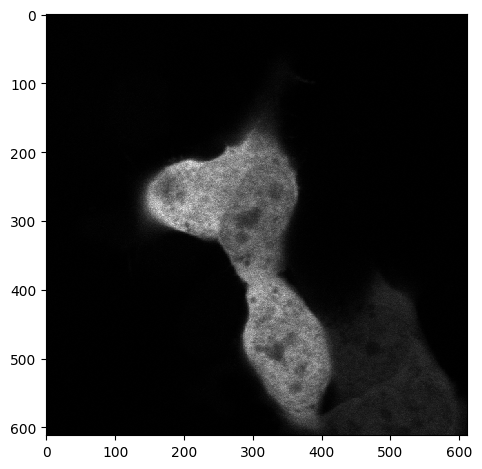

Segmented Cells


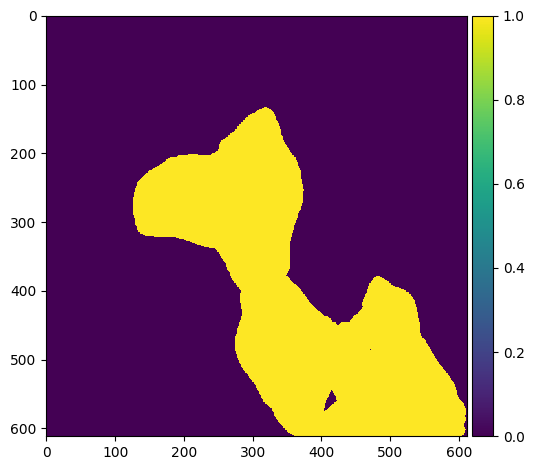

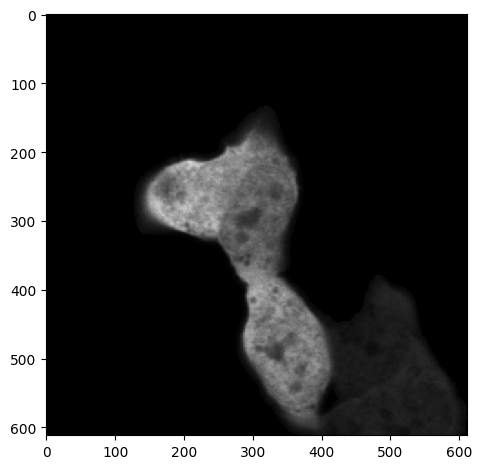

Bin count 61


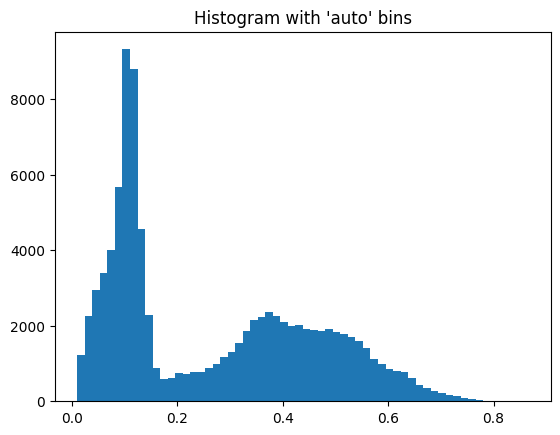

Standard Deviation:  0.1905004370227768
Threshold:  0.6504946236779465
Inclusion Areas:  [282.  11.  25.  20.  46.  81. 520. 295.  17.  21. 180.  96.  34.  59.
  60.  23.]


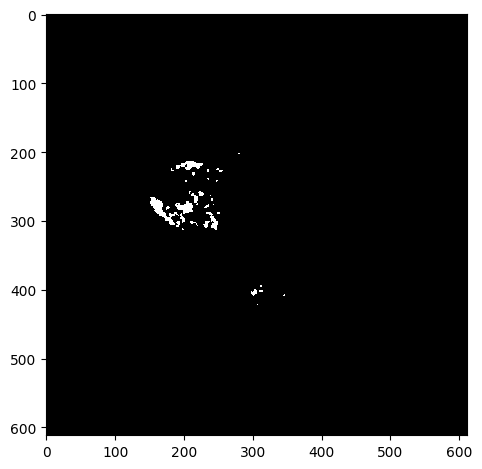

--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_04.czi
Green Channel


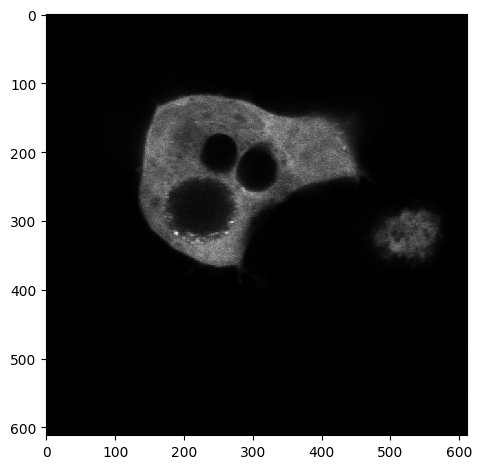

Segmented Cells


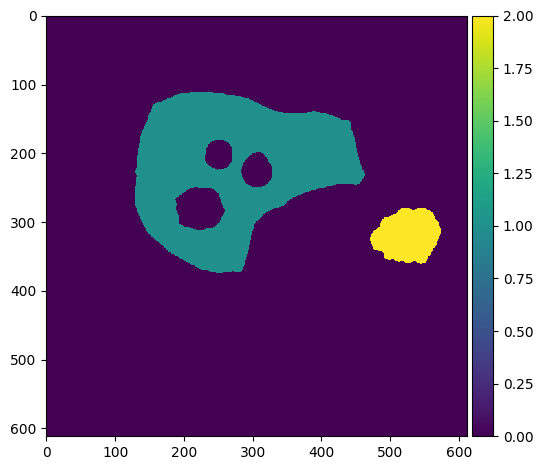

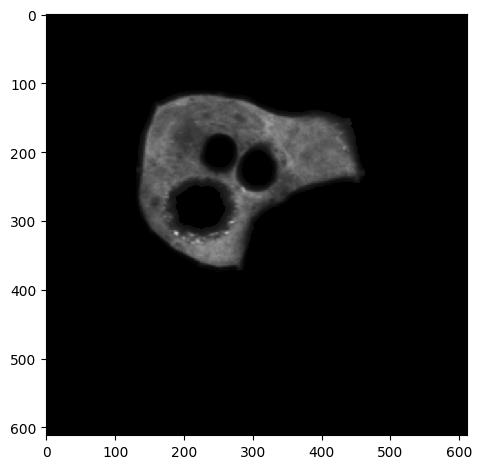

Bin count 75


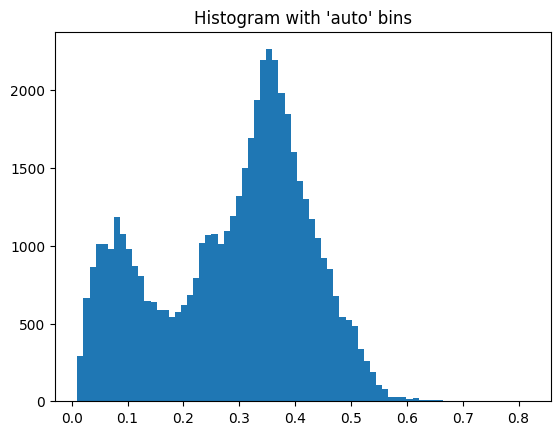

Standard Deviation:  0.13538548145532503
Threshold:  0.5589368408359274
Inclusion Areas:  [72. 20. 24. 22. 14. 23. 11.]


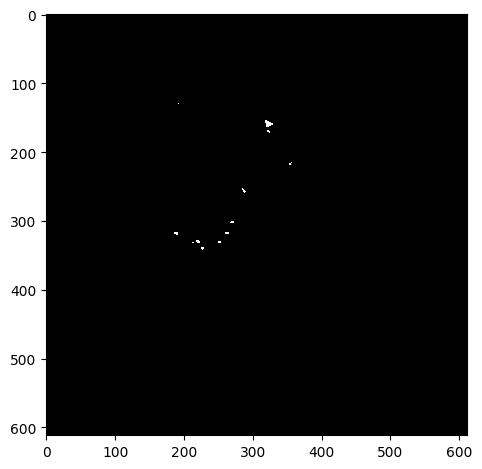

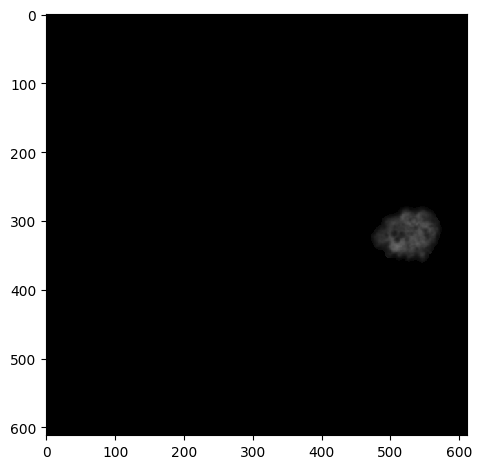

Bin count 29


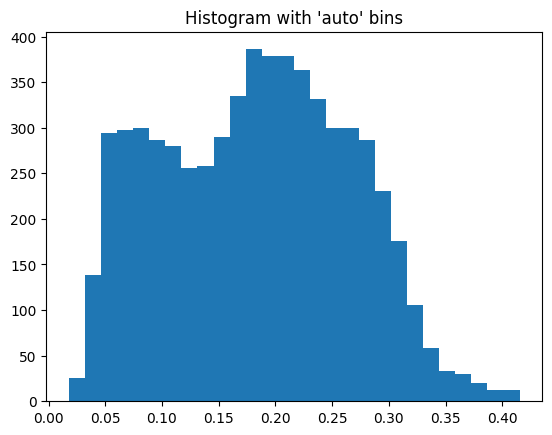

Standard Deviation:  0.08250337139715483
Threshold:  0.3478525728749199
Inclusion Areas:  [93.]


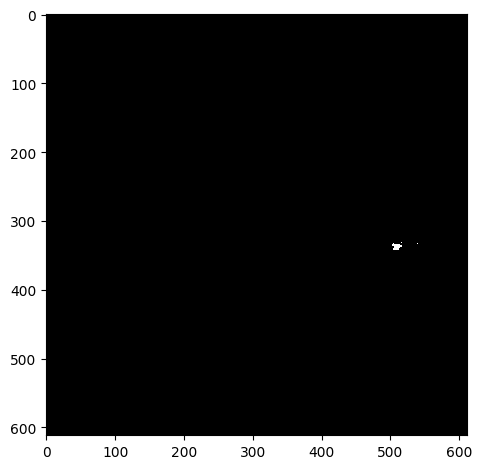

--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_05.czi
Green Channel


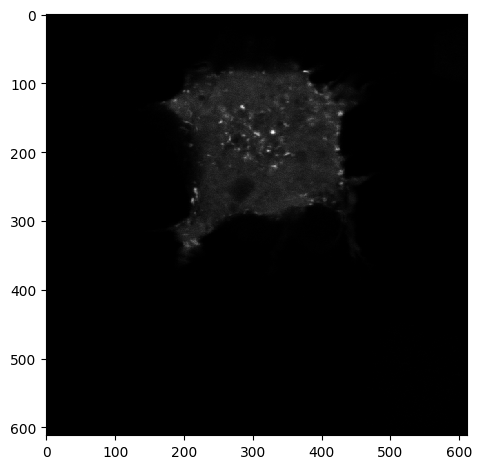

Segmented Cells


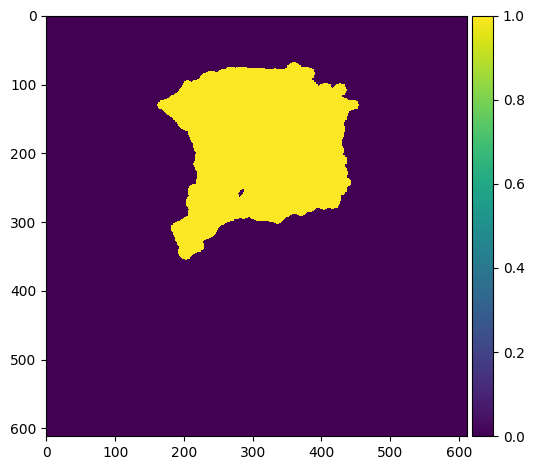

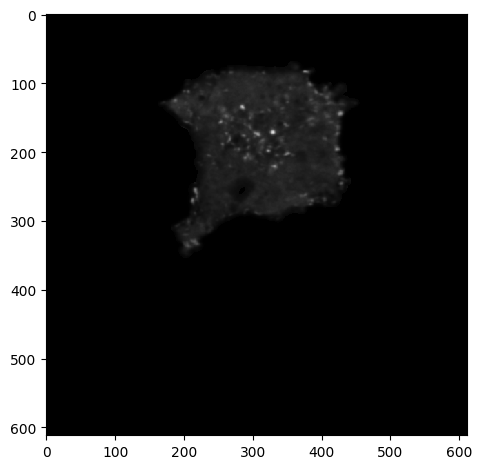

Bin count 321


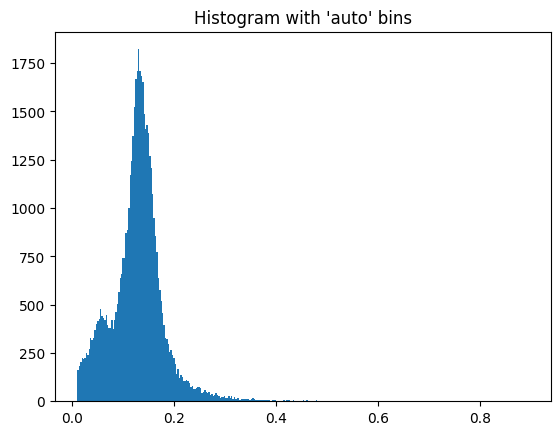

Standard Deviation:  0.05642424714751522
Threshold:  0.24198670509436127
Inclusion Areas:  [30. 33. 23. 22. 31. 18. 55. 35. 57. 32. 53. 29. 11. 30. 32. 26. 24. 15.
 72. 87. 15. 13. 20. 31. 11. 35. 12. 41. 11. 31. 44. 70. 57. 49. 13. 47.
 33. 19. 15. 46. 23.]


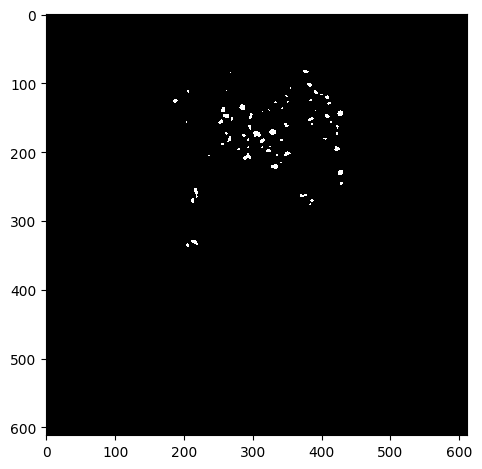

--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_06.czi
Green Channel


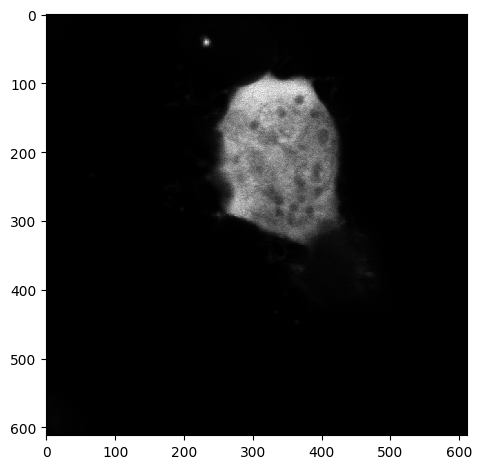

Segmented Cells


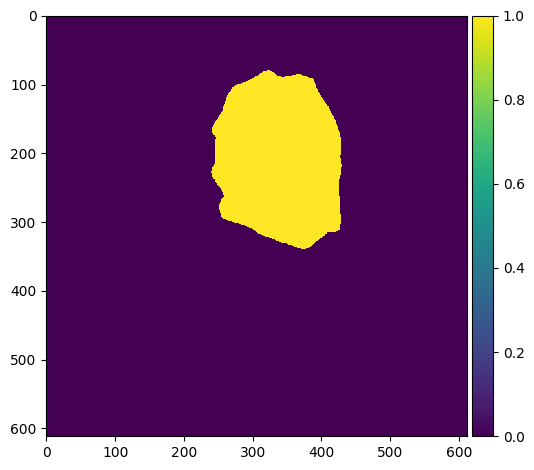

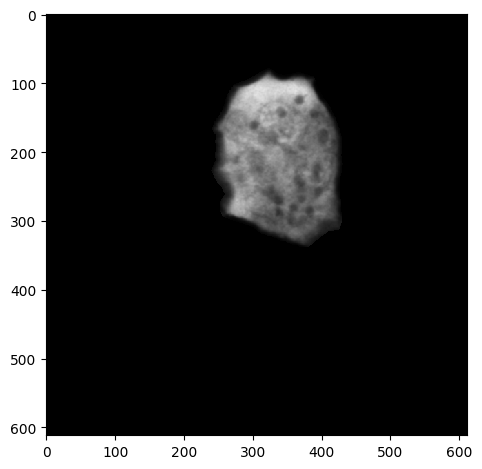

Bin count 63


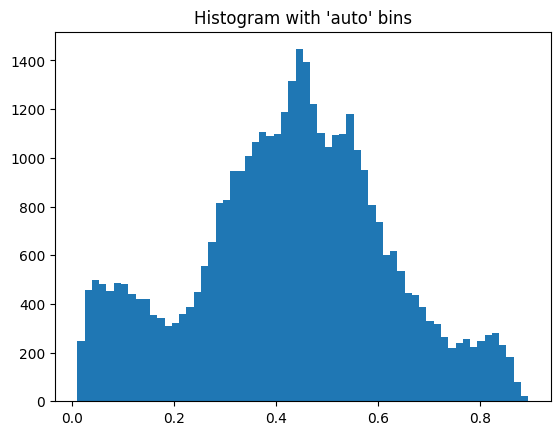

Standard Deviation:  0.19173445780206963
Threshold:  0.809674947480133
Inclusion Areas:  [1026.   15.]


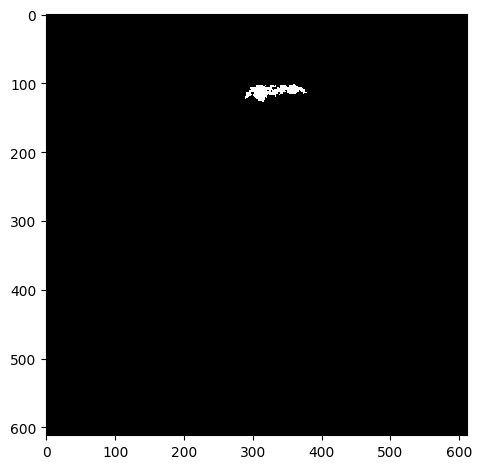

--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_07.czi
Green Channel


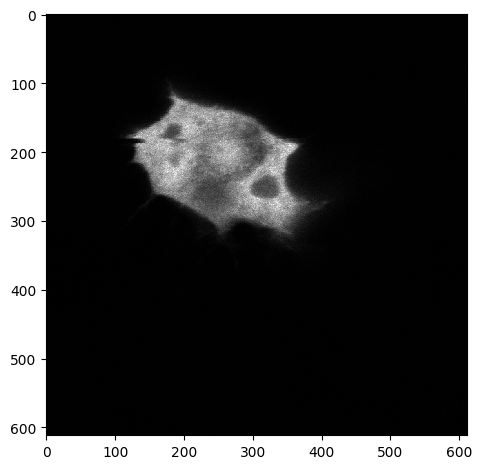

Segmented Cells


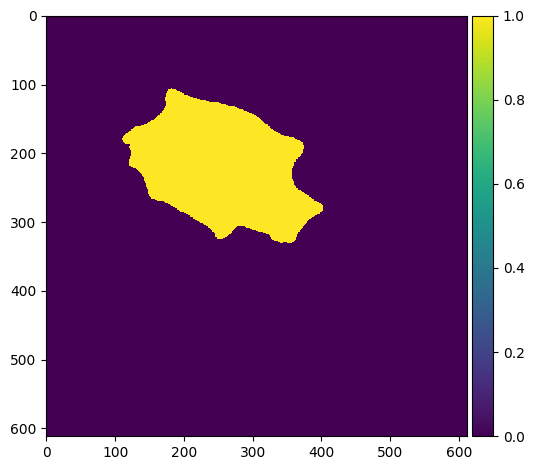

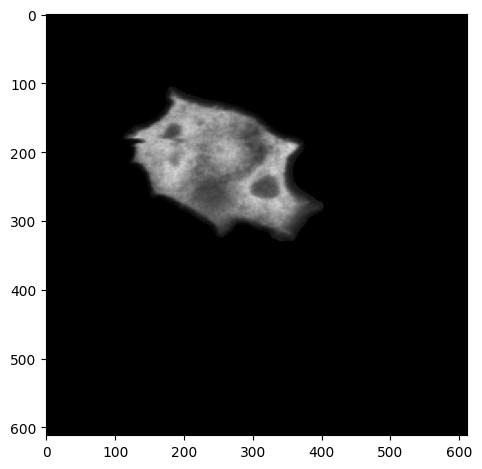

Bin count 48


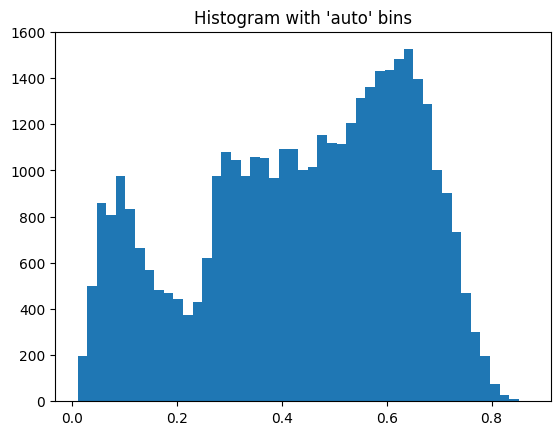

Standard Deviation:  0.2030644481690944
Threshold:  0.8454880444367114
--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_08.czi
Green Channel


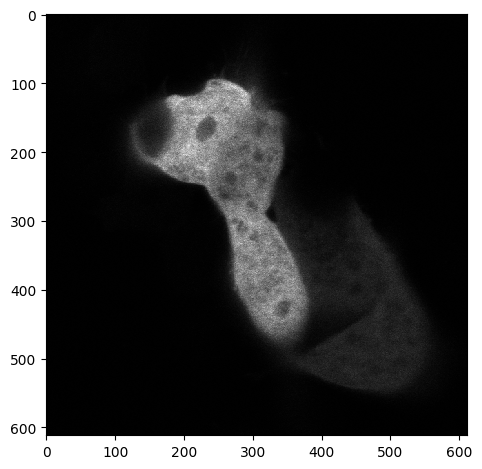

Segmented Cells


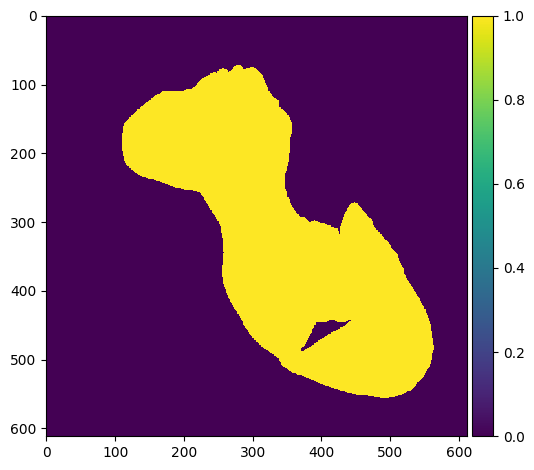

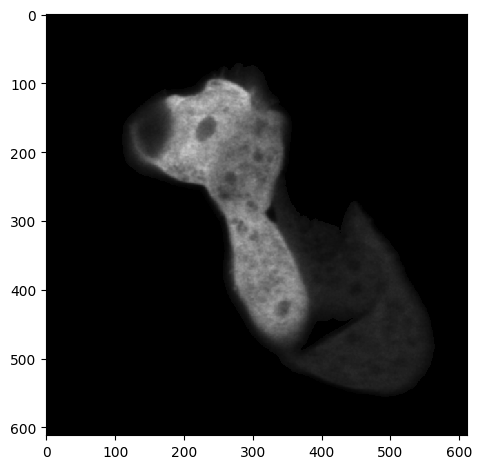

Bin count 58


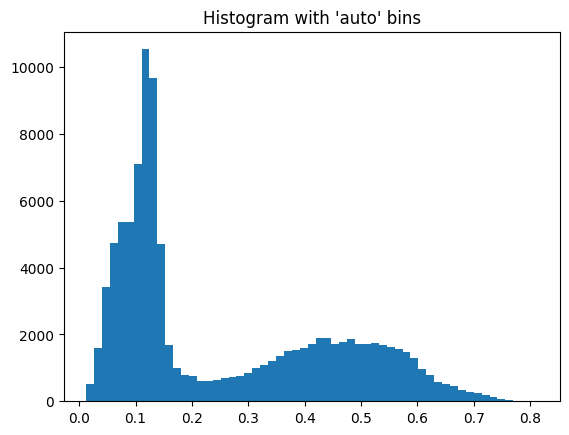

Standard Deviation:  0.19233318160000618
Threshold:  0.6408277509852254
Inclusion Areas:  [431.  11. 478.  14.  42. 159.  30.  44.  18. 177. 113.  37. 676.  21.
  92.  24.]


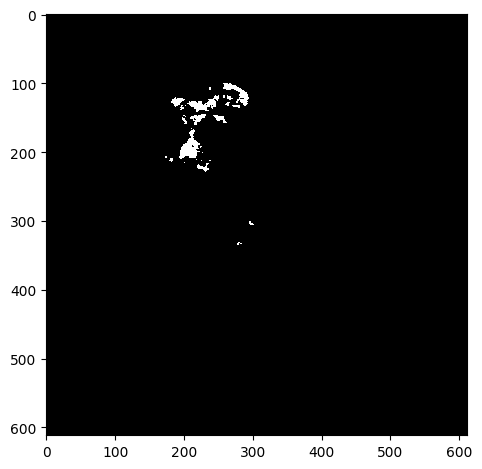

--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_09.czi
Green Channel


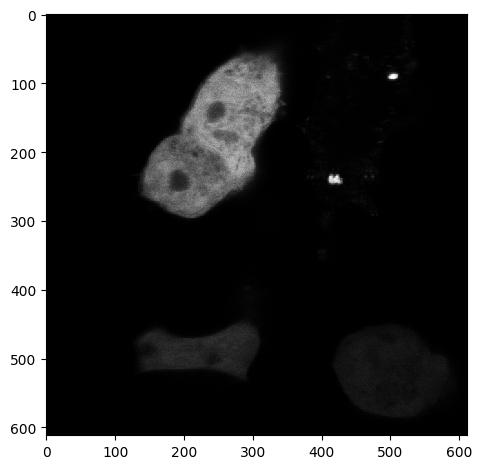

Segmented Cells


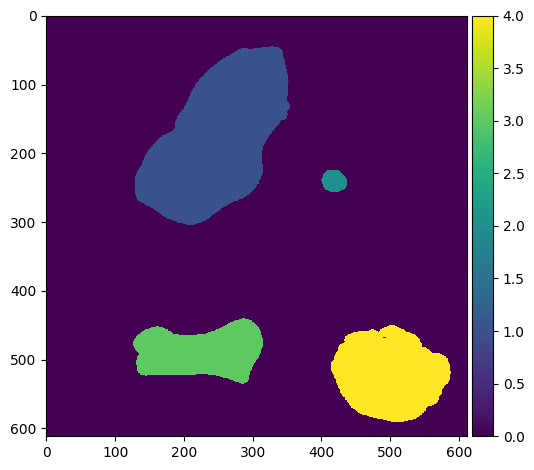

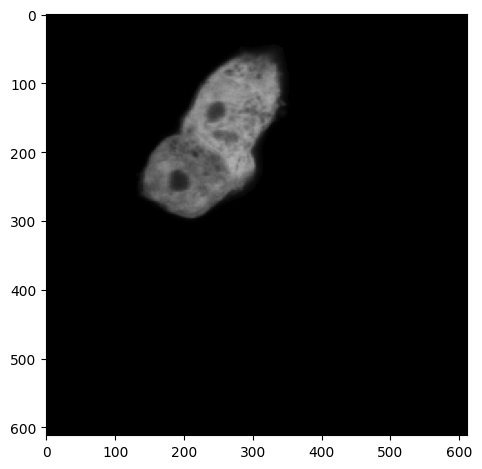

Bin count 44


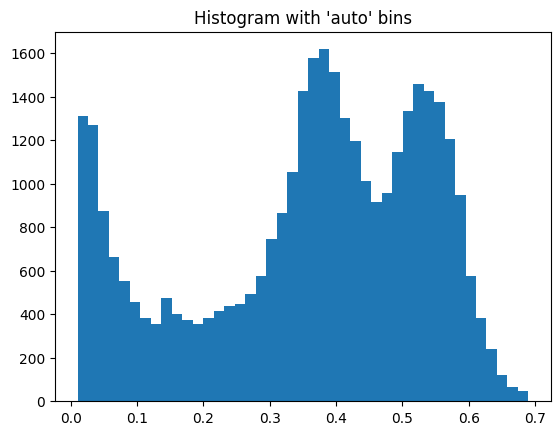

Standard Deviation:  0.17630174401320908
Threshold:  0.7122411249704799


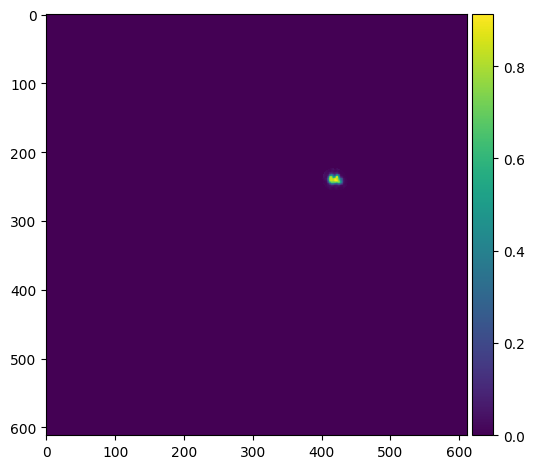

Bin count 16


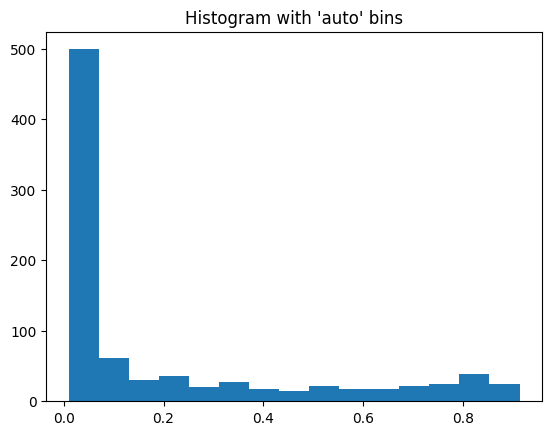

Standard Deviation:  0.274404324897319
Threshold:  0.7545250199923177
Inclusion Areas:  [79.]


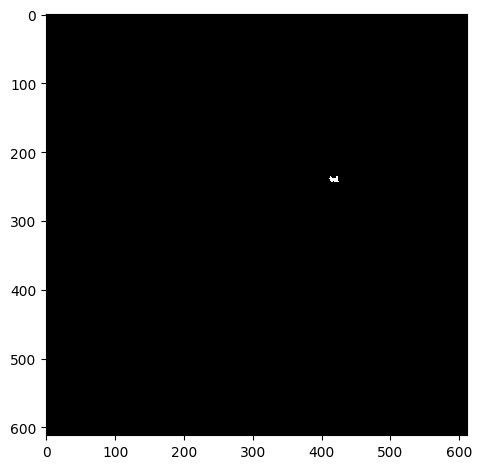

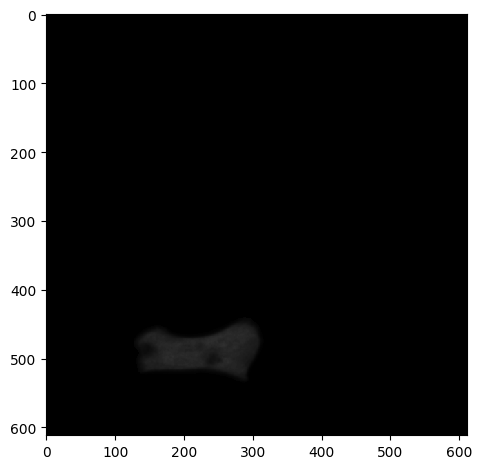

Bin count 29


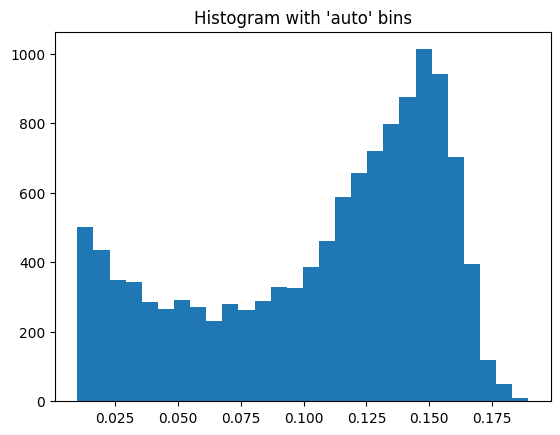

Standard Deviation:  0.04739183606808346
Threshold:  0.201293021226936


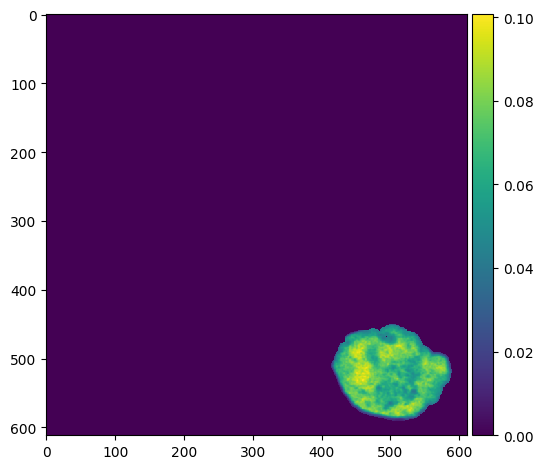

Bin count 64


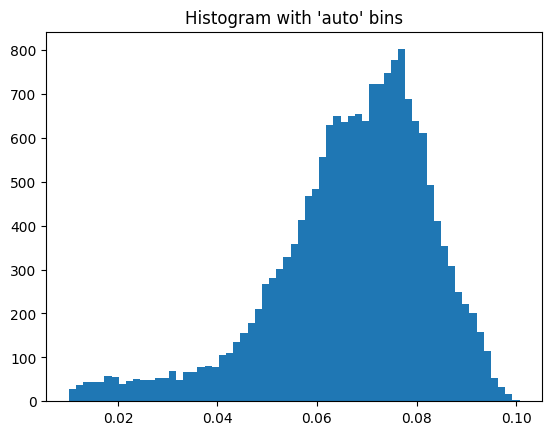

Standard Deviation:  0.015850998023084994
Threshold:  0.09871802675914351
--------------------------------------------------
--------------------------------------------------
1K_TAX1BP1_10.czi
Green Channel


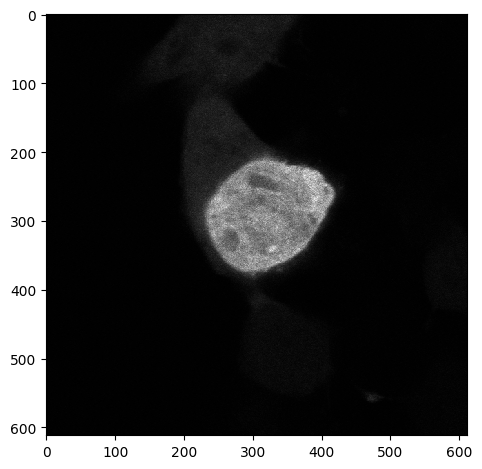

Segmented Cells


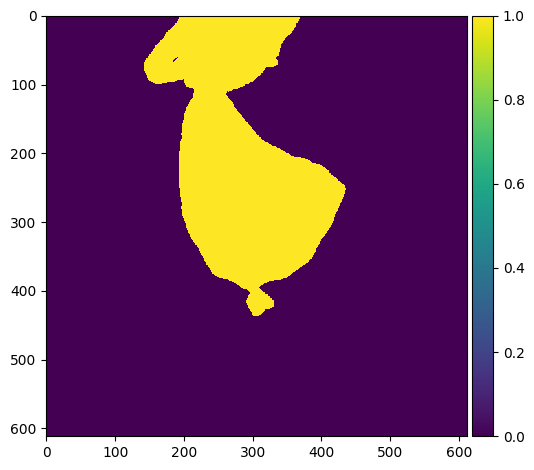

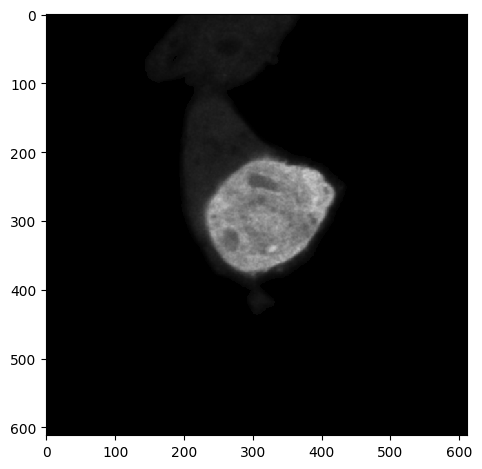

Bin count 42


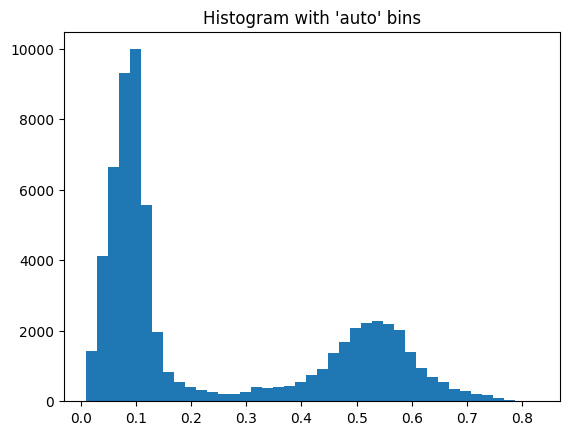

Standard Deviation:  0.2151381932856459
Threshold:  0.6731722428406858
Inclusion Areas:  [ 59. 738.  13.  56.  50.  58.]


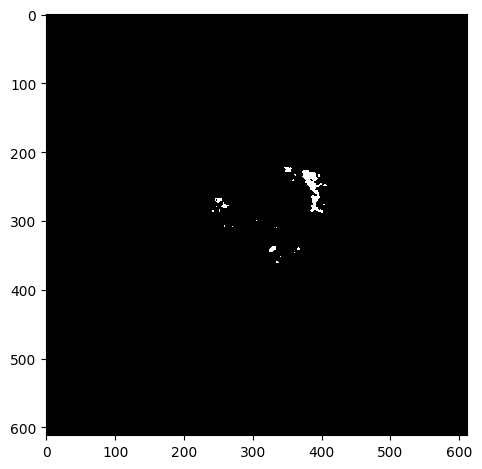

--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_01.czi
Green Channel


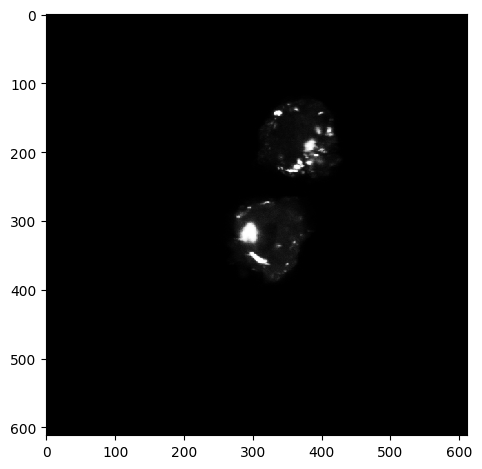

Segmented Cells


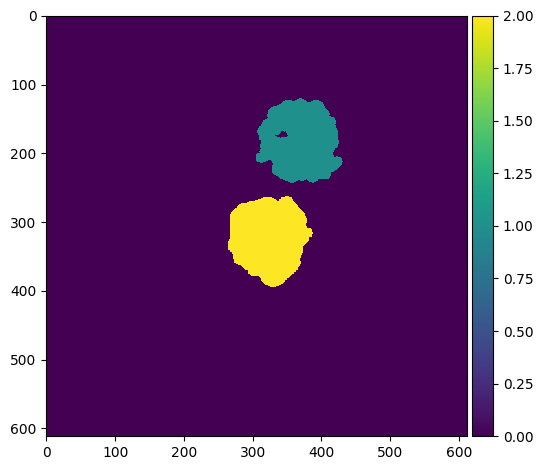

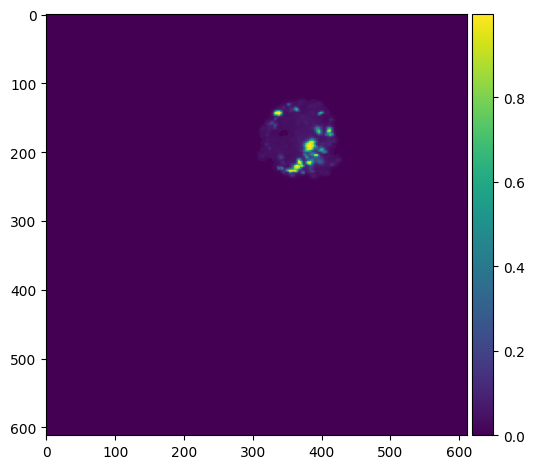

Bin count 199


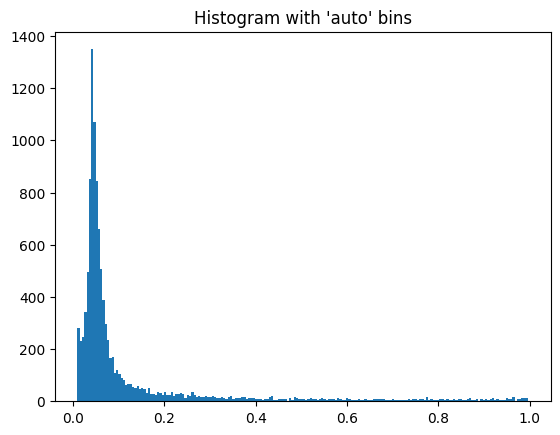

Standard Deviation:  0.18698611928874936
Threshold:  0.49861887749683
Inclusion Areas:  [ 74.  30.  60. 210.  14.  32. 205.  52.]


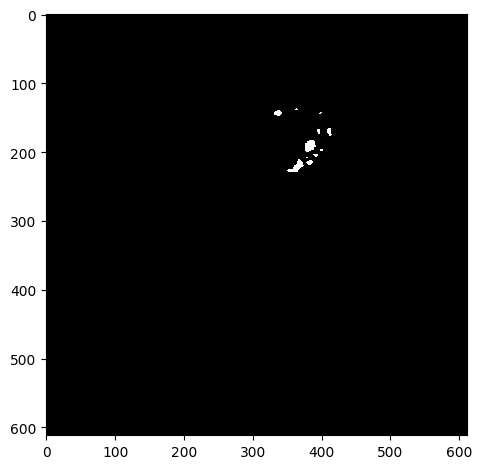

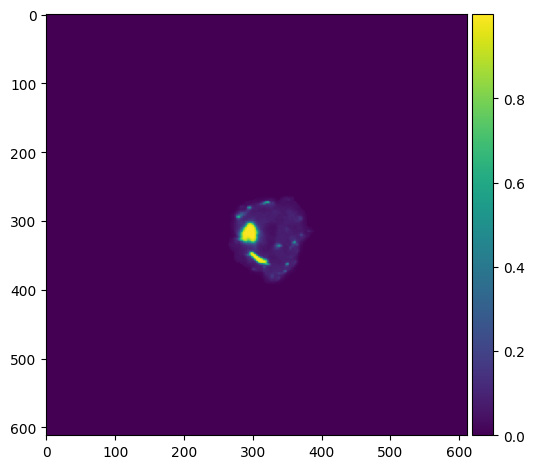

Bin count 203


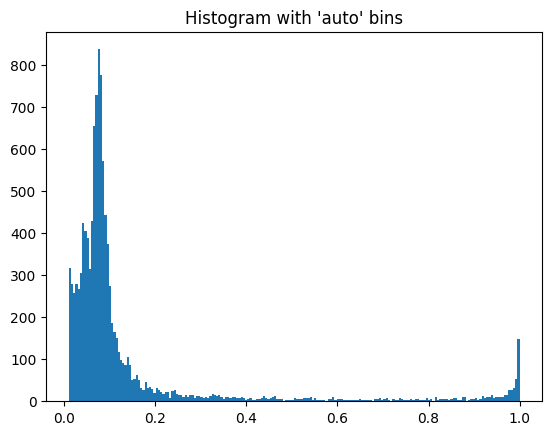

Standard Deviation:  0.21328206377619766
Threshold:  0.5707240521744663
Inclusion Areas:  [550. 191.]


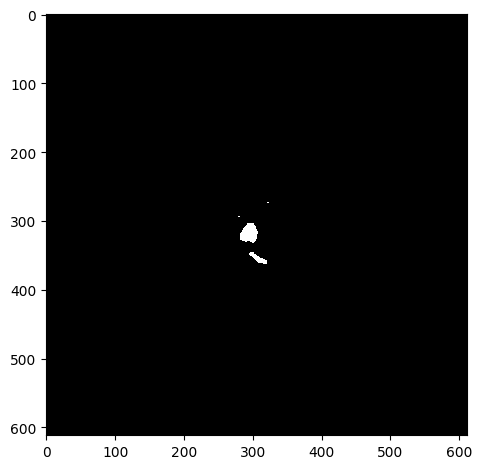

--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_02.czi
Green Channel


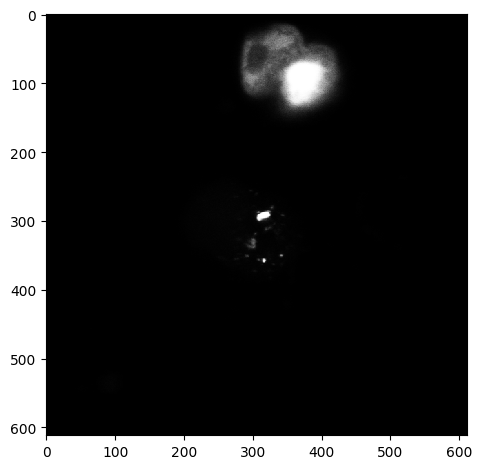

Segmented Cells


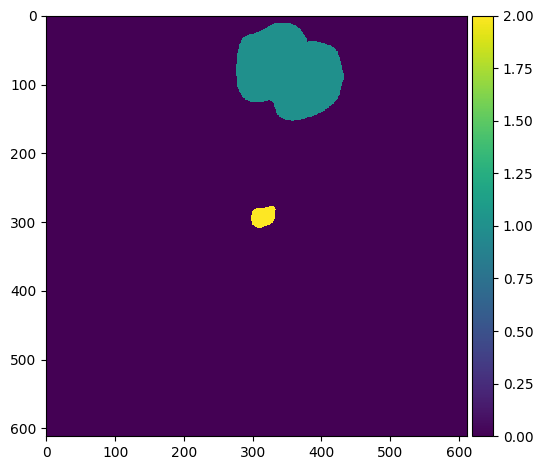

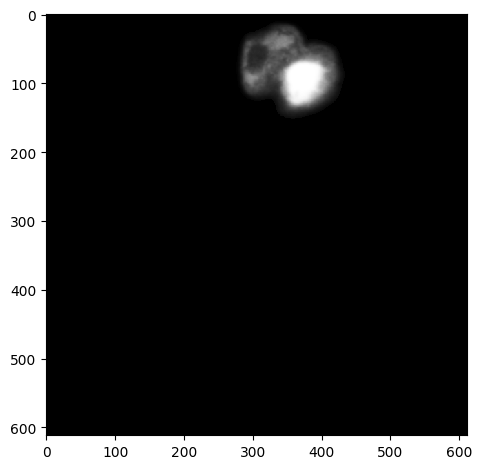

Bin count 40


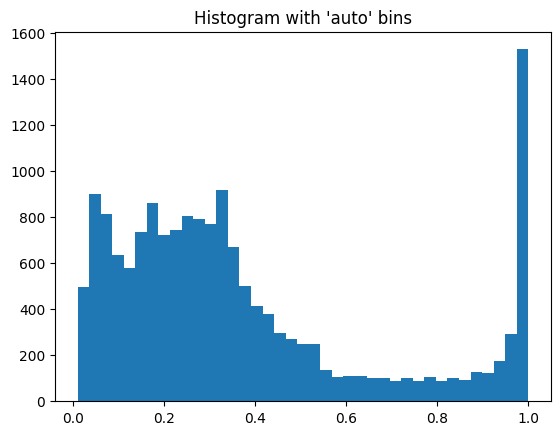

Standard Deviation:  0.2962351931754354
Threshold:  0.96987507971835
Inclusion Areas:  [1578.]


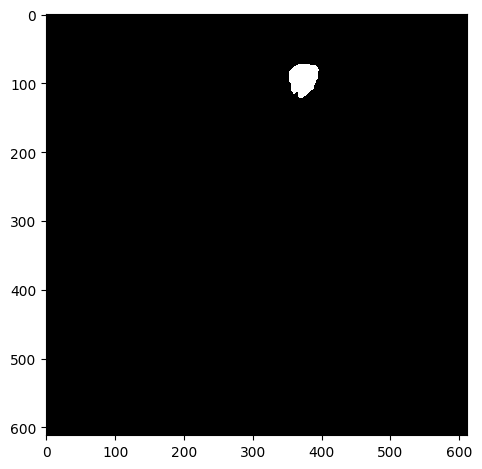

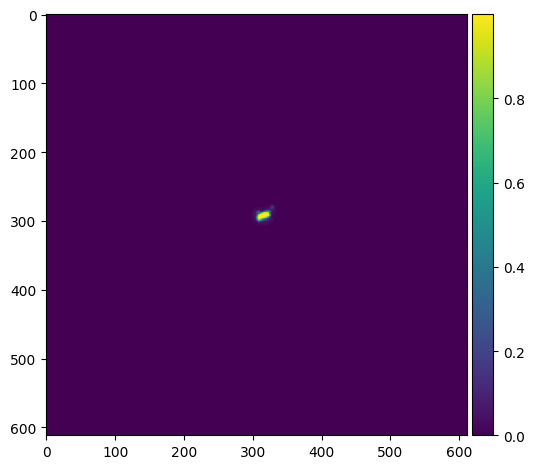

Bin count 16


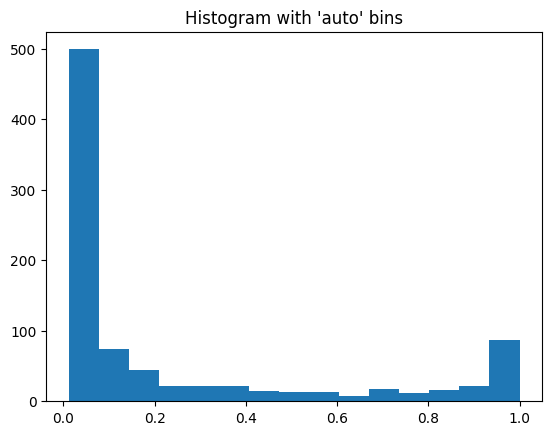

Standard Deviation:  0.33324198987399
Threshold:  0.9098805959796065
Inclusion Areas:  [94.]


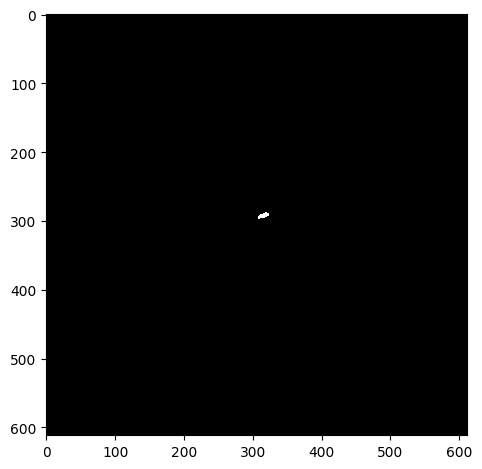

--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_03.czi
Green Channel


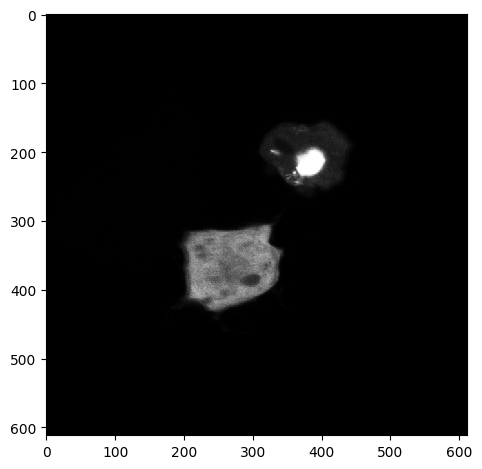

Segmented Cells


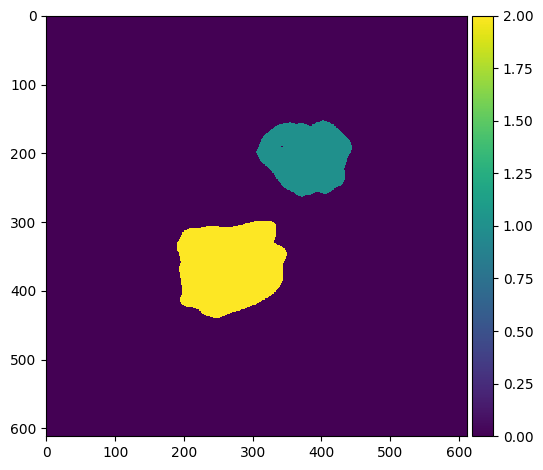

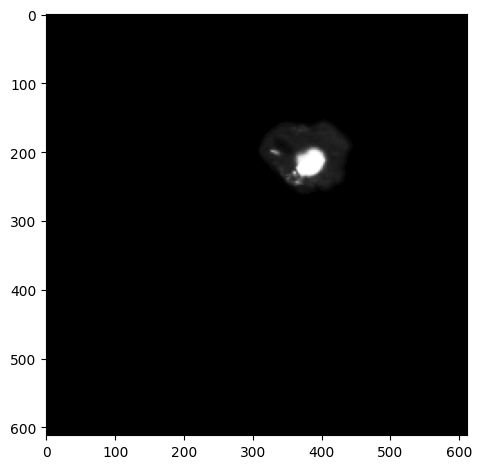

Bin count 145


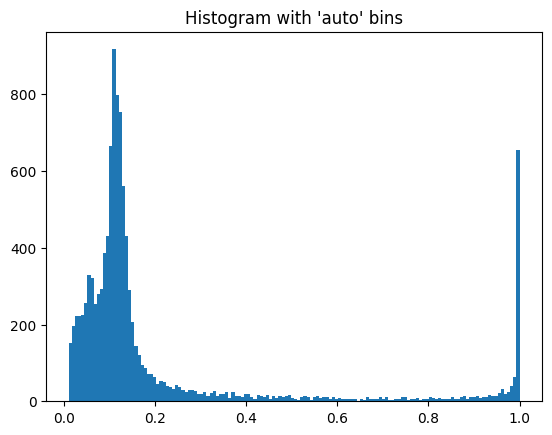

Standard Deviation:  0.2709936134597426
Threshold:  0.7591750589128037
Inclusion Areas:  [1103.]


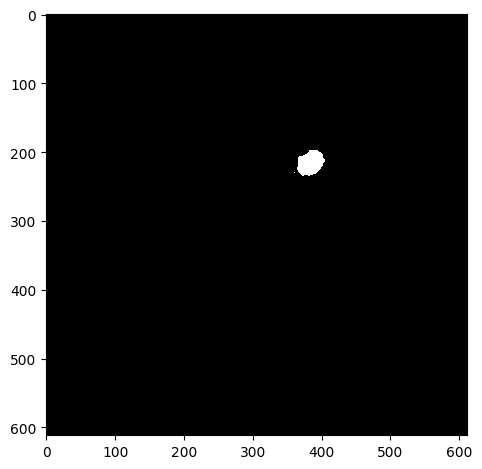

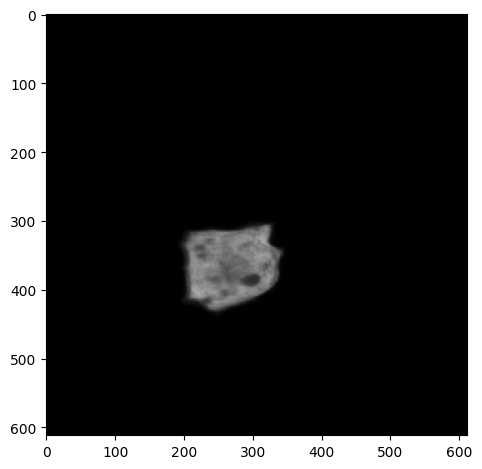

Bin count 37


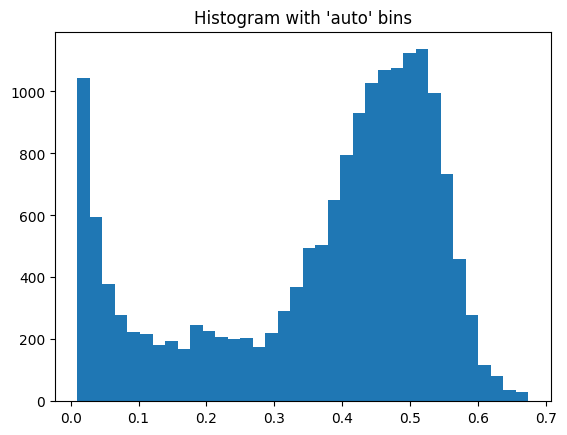

Standard Deviation:  0.17536009824459192
Threshold:  0.7193782242762703
--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_04.czi
Green Channel


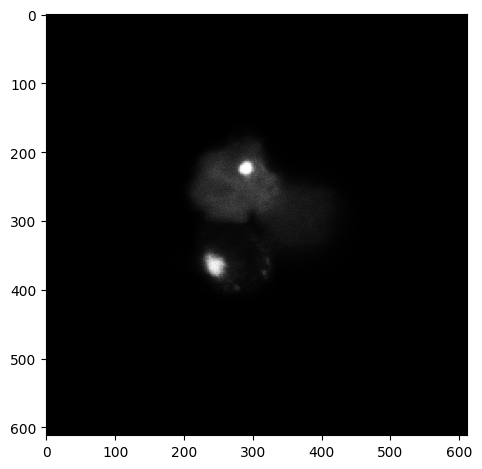

Segmented Cells


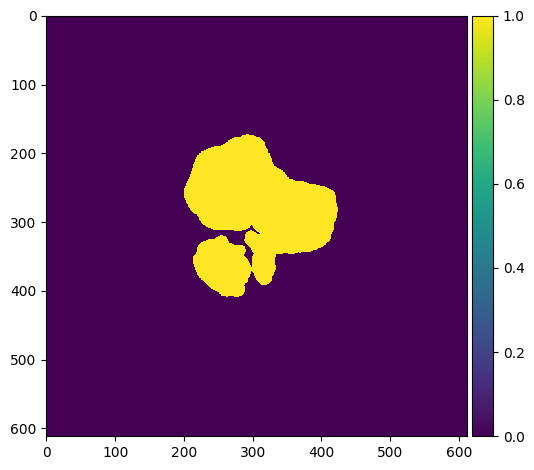

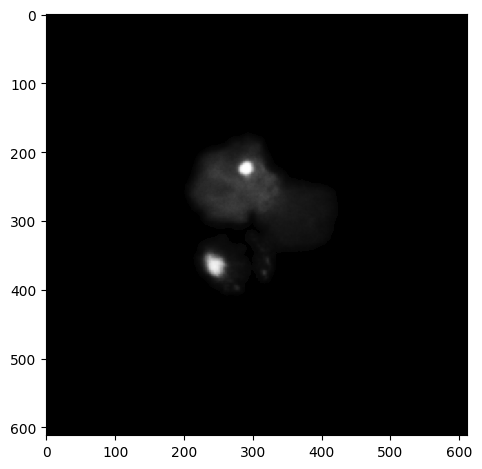

Bin count 133


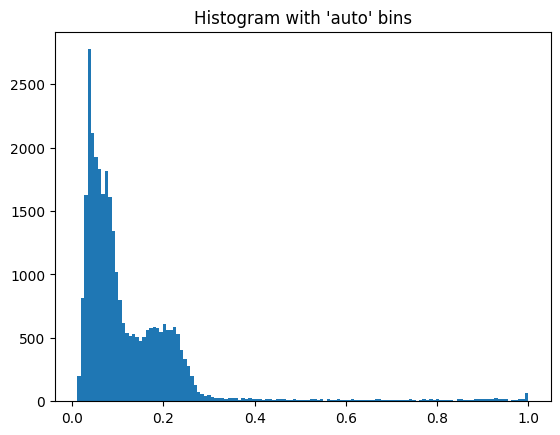

Standard Deviation:  0.1364764138988879
Threshold:  0.4009037415780813
Inclusion Areas:  [451. 640.]


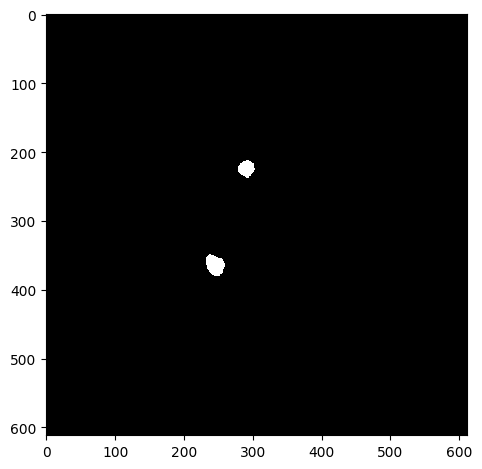

--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_05.czi
Green Channel


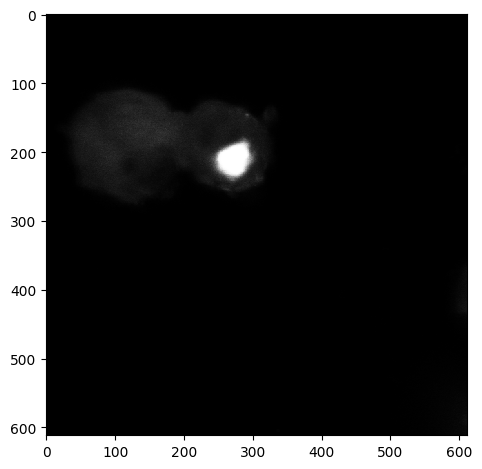

Segmented Cells


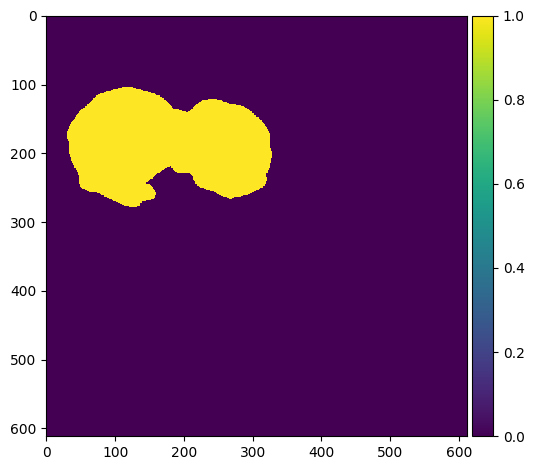

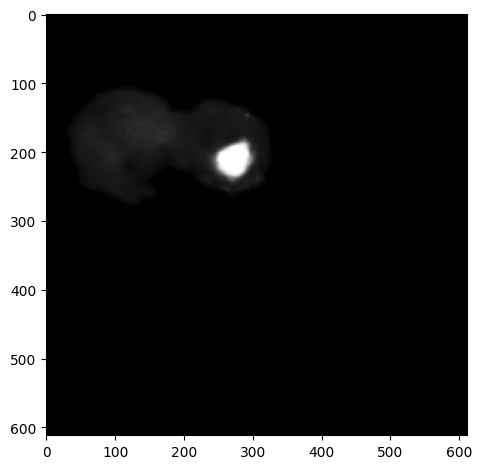

Bin count 321


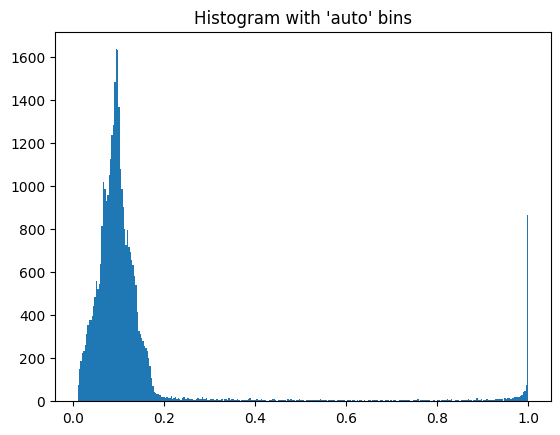

Standard Deviation:  0.19161482961011647
Threshold:  0.5258374101770921
Inclusion Areas:  [1974.]


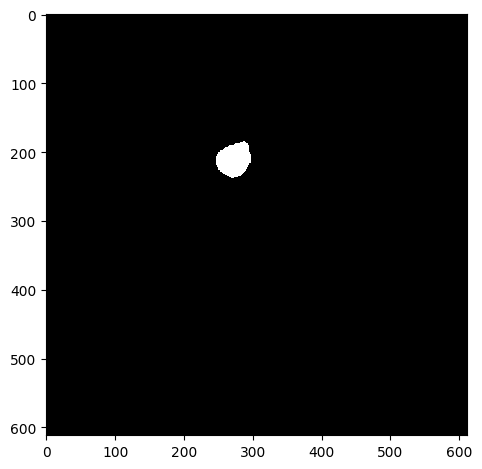

--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_067.czi
Green Channel


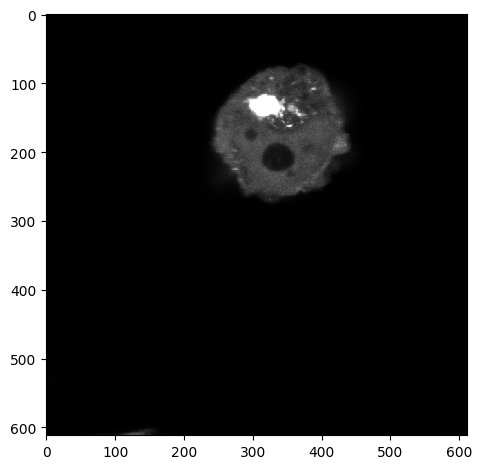

Segmented Cells


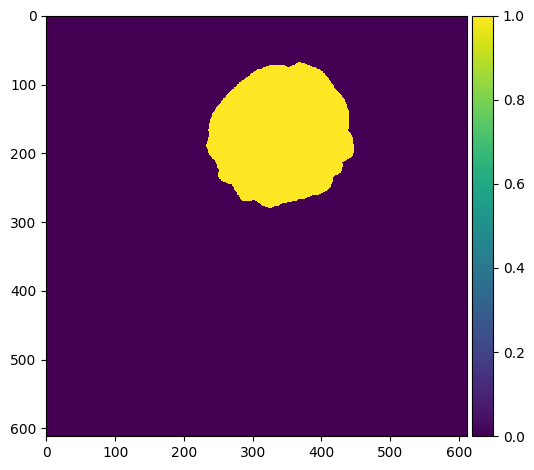

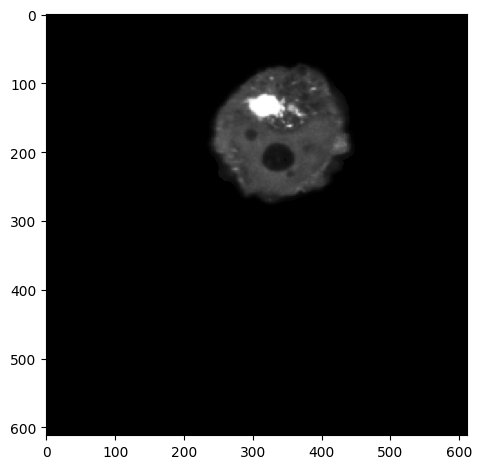

Bin count 134


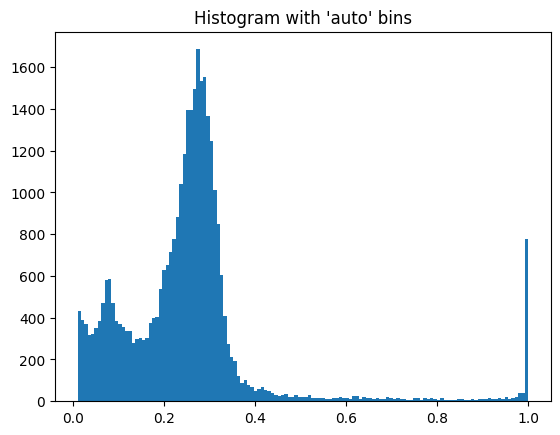

Standard Deviation:  0.17231458456080356
Threshold:  0.6012385588961897
Inclusion Areas:  [1376.  108.   19.]


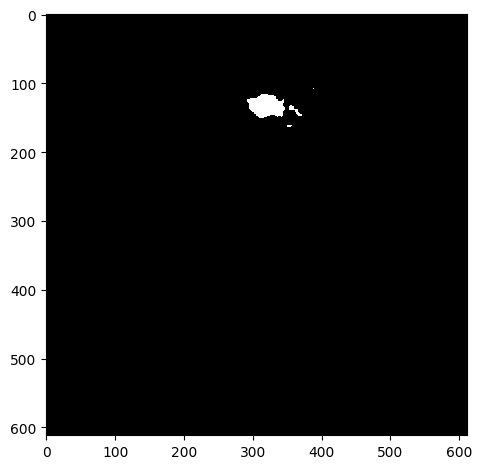

--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_07.czi
Green Channel


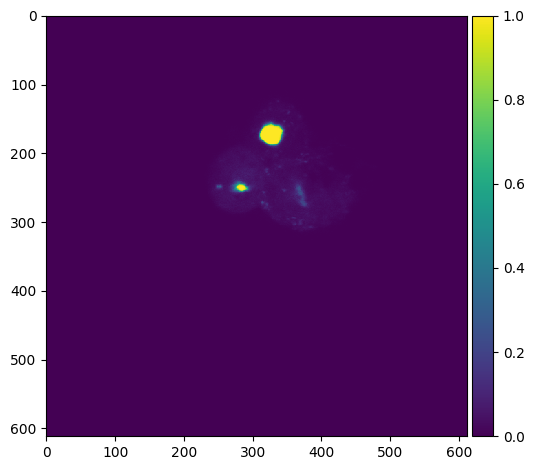

Segmented Cells


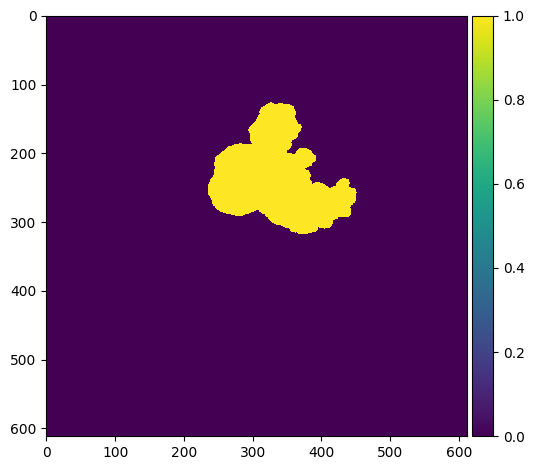

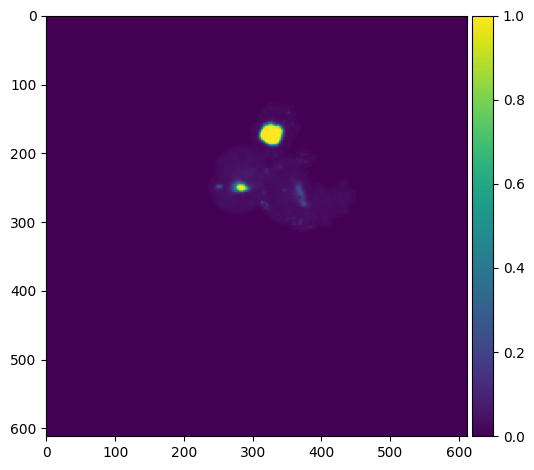

Bin count 696


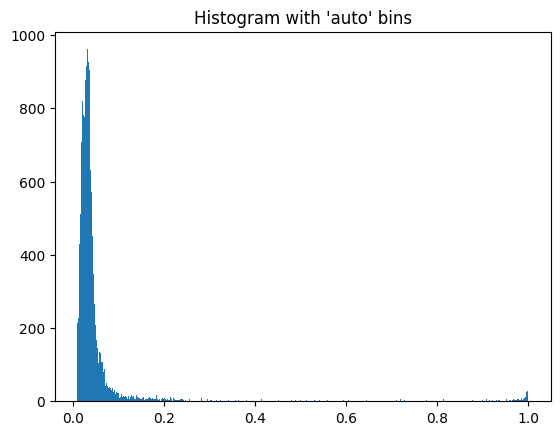

Standard Deviation:  0.18469120363581776
Threshold:  0.45000244558866975
Inclusion Areas:  [835. 176.]


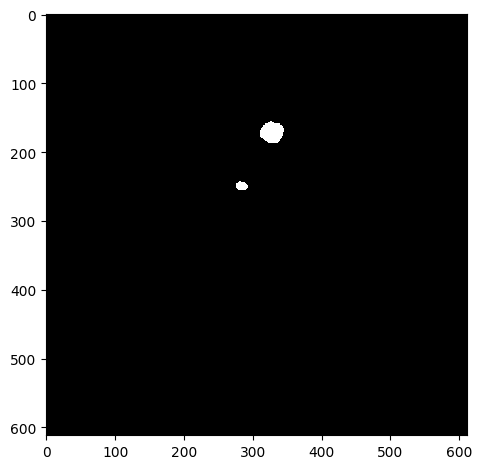

--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_08.czi
Green Channel


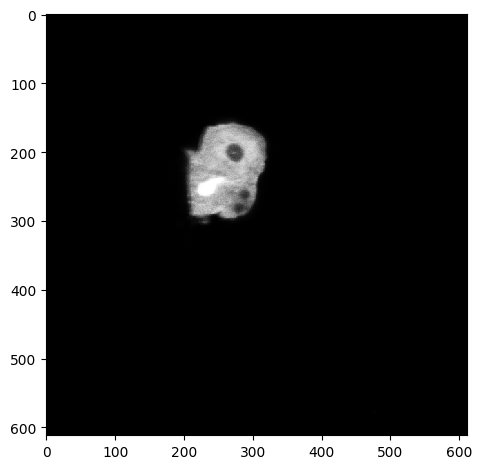

Segmented Cells


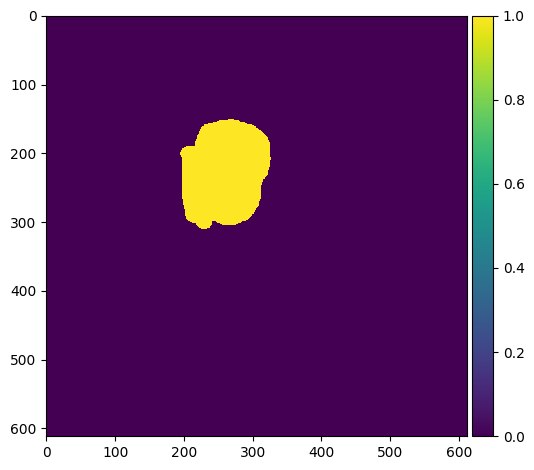

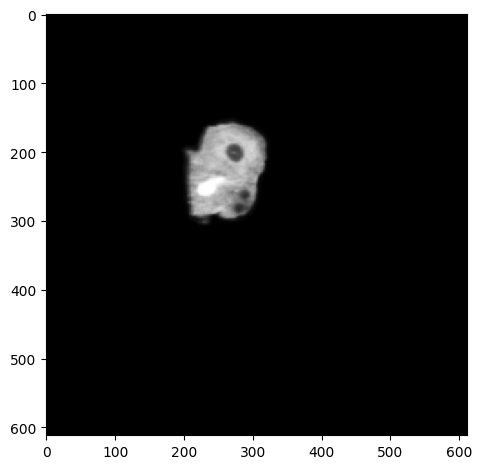

Bin count 30


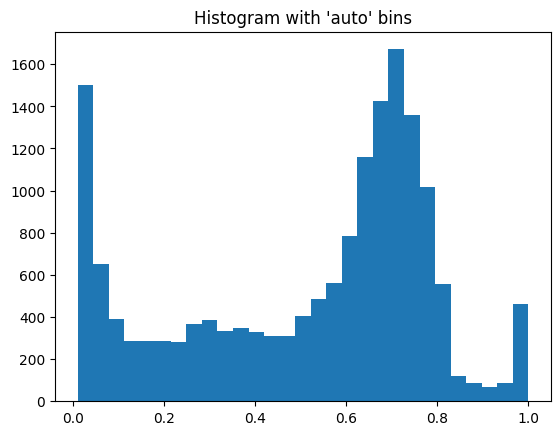

Standard Deviation:  0.27521599511467765
Threshold:  1.0642016469772857
--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_09.czi
Green Channel


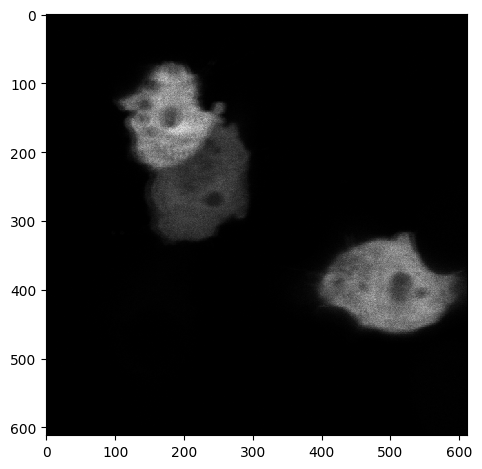

Segmented Cells


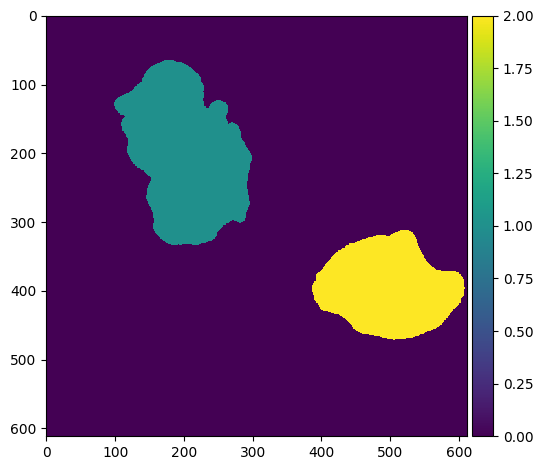

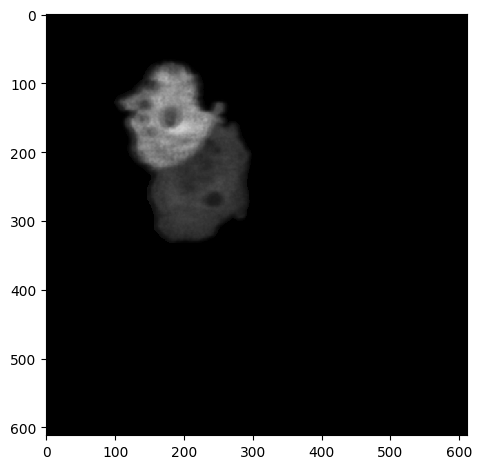

Bin count 53


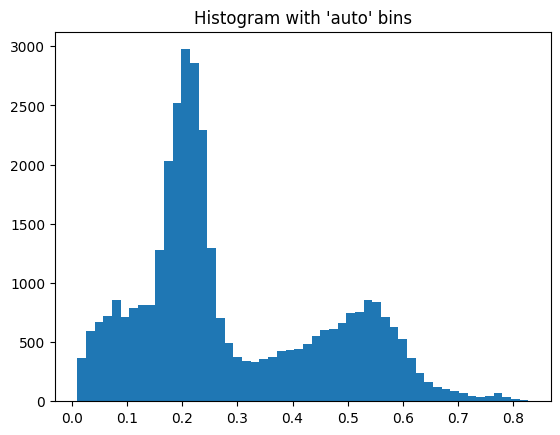

Standard Deviation:  0.17175026416744654
Threshold:  0.6332690786153934
Inclusion Areas:  [ 51.  65.  13.  11. 712.  11.]


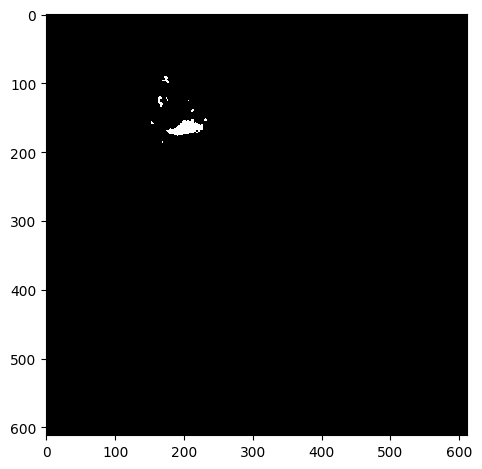

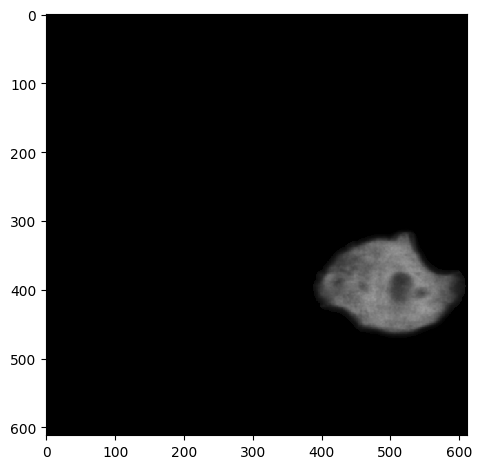

Bin count 39


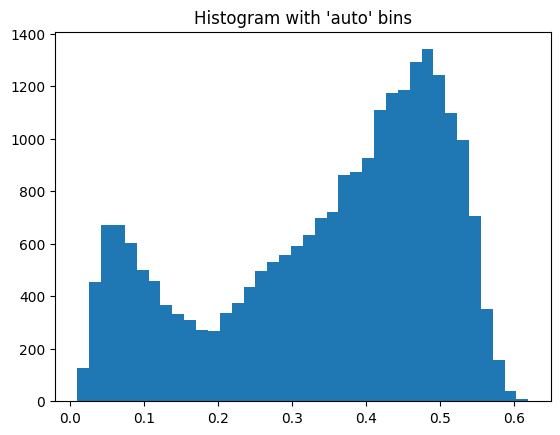

Standard Deviation:  0.15563432159382456
Threshold:  0.6597119217609089
--------------------------------------------------
--------------------------------------------------
WT_ADAMTS19_10.czi
Green Channel


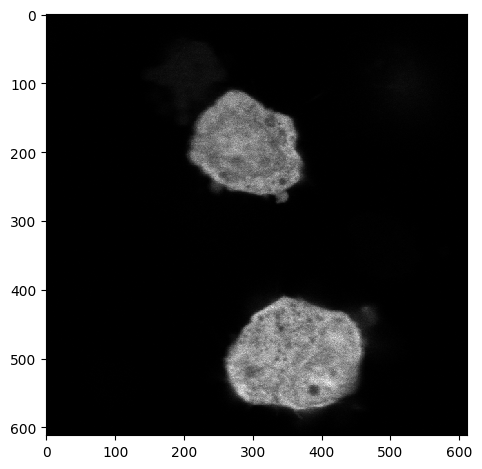

Segmented Cells


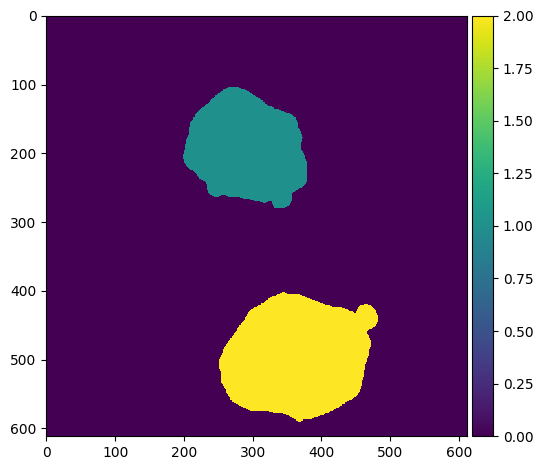

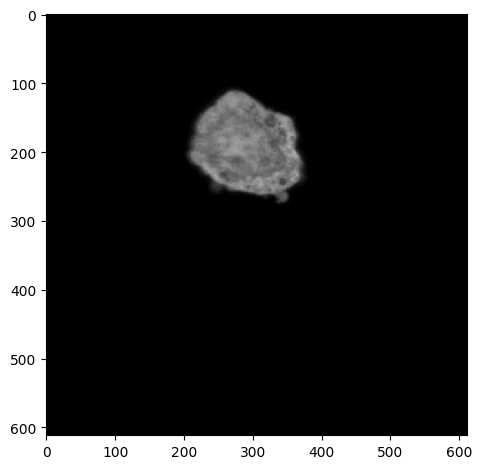

Bin count 61


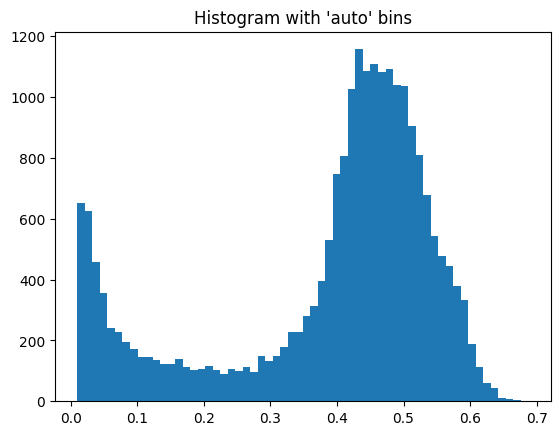

Standard Deviation:  0.16669860056404243
Threshold:  0.7207650996369652


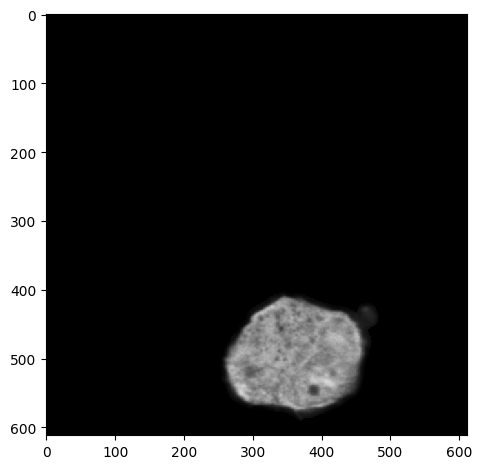

Bin count 65


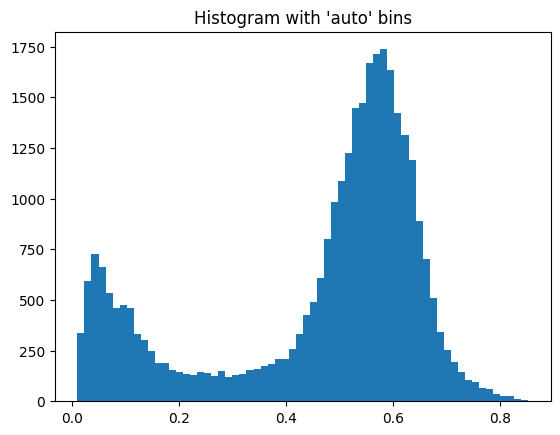

Standard Deviation:  0.20243838032847017
Threshold:  0.8665499353743549
--------------------------------------------------
--------------------------------------------------
WT_SCR_01.czi
Green Channel


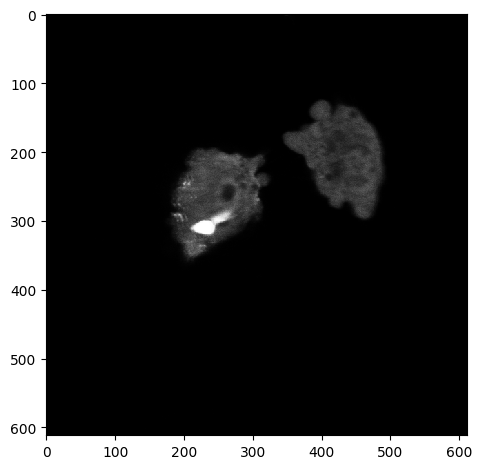

Segmented Cells


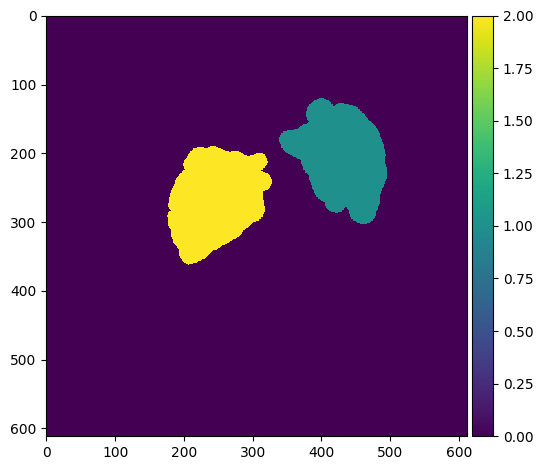

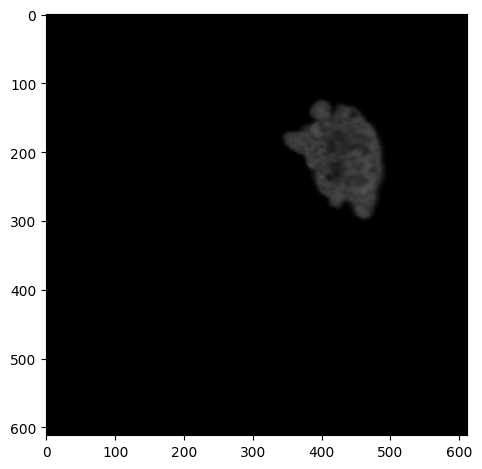

Bin count 51


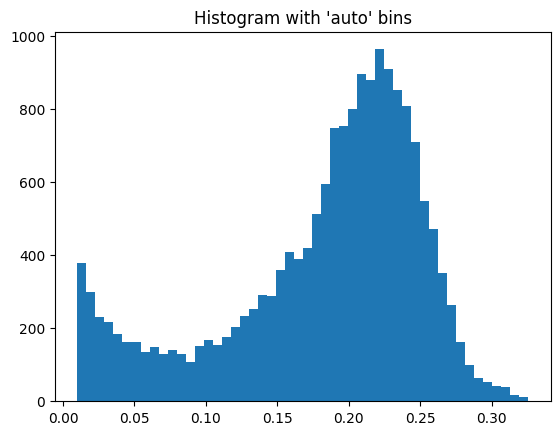

Standard Deviation:  0.06999154105819329
Threshold:  0.3222695452945923


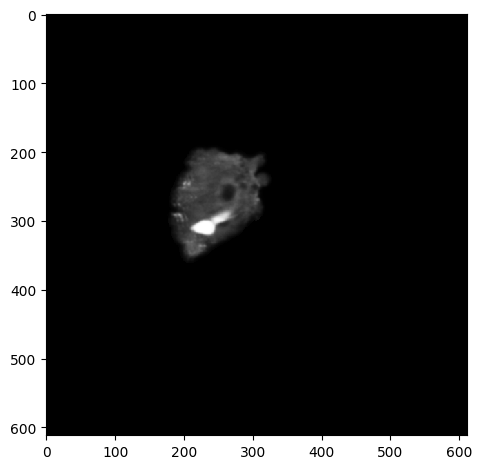

Bin count 101


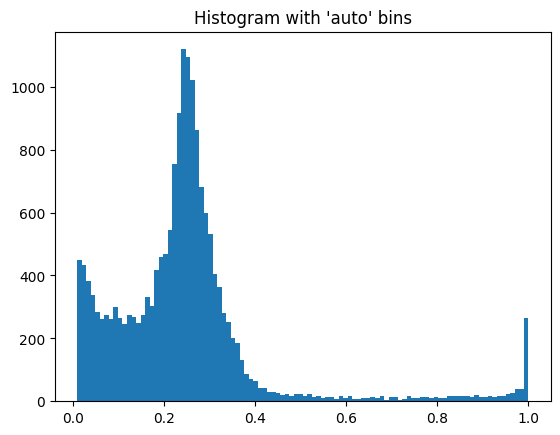

Standard Deviation:  0.1759642566820191
Threshold:  0.5992254048346949
Inclusion Areas:  [854.]


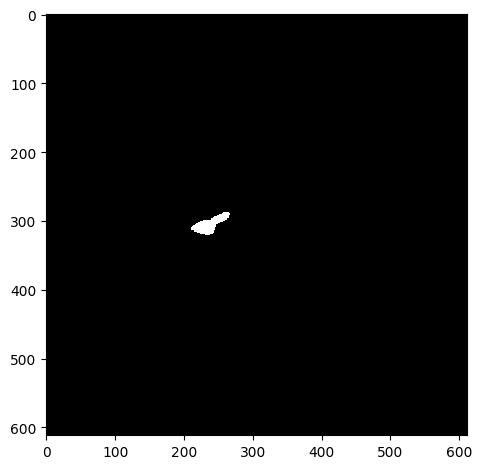

--------------------------------------------------
--------------------------------------------------
WT_SCR_02.czi
Green Channel


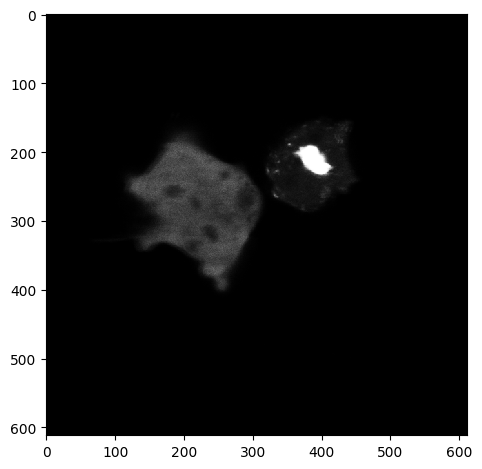

Segmented Cells


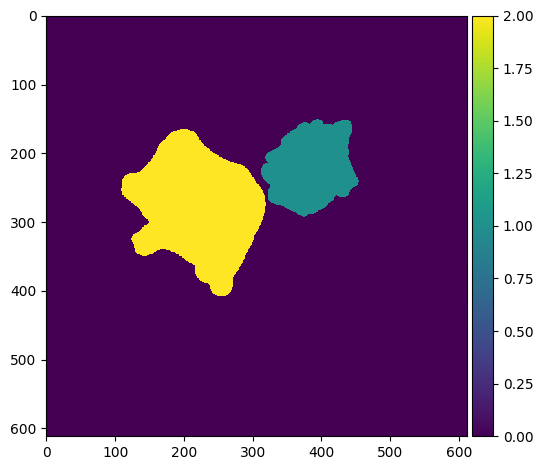

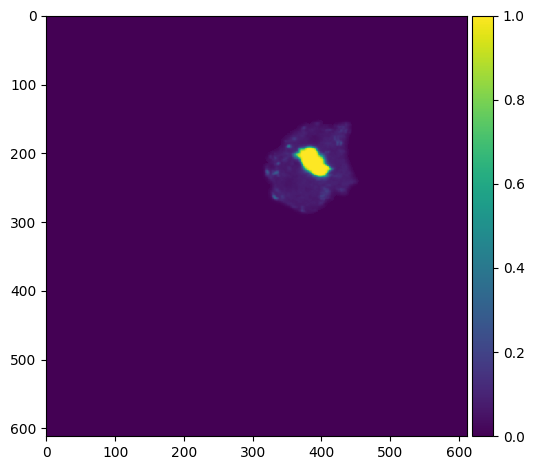

Bin count 294


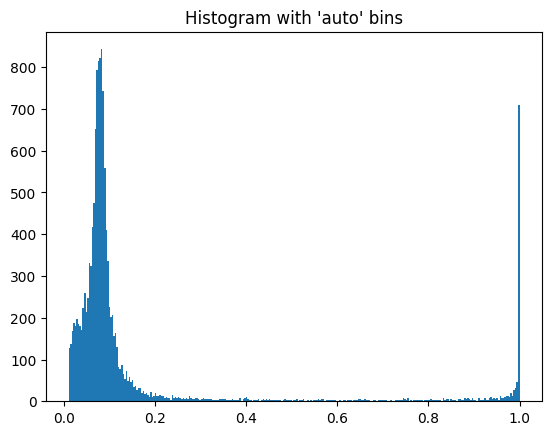

Standard Deviation:  0.2569021553173192
Threshold:  0.6803191823232588
Inclusion Areas:  [1208.]


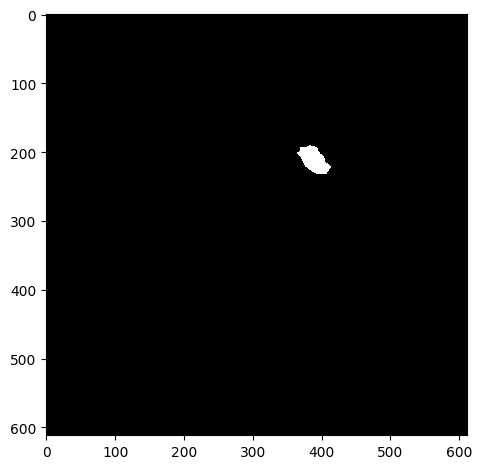

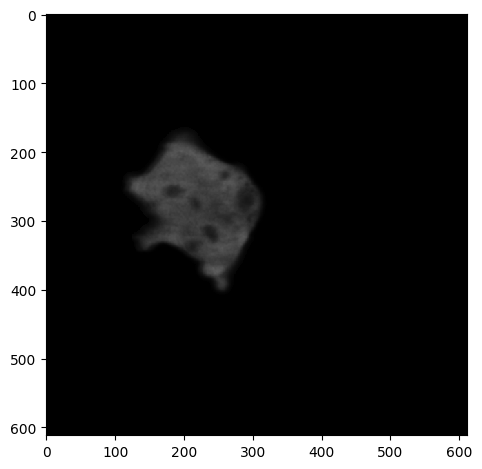

Bin count 43


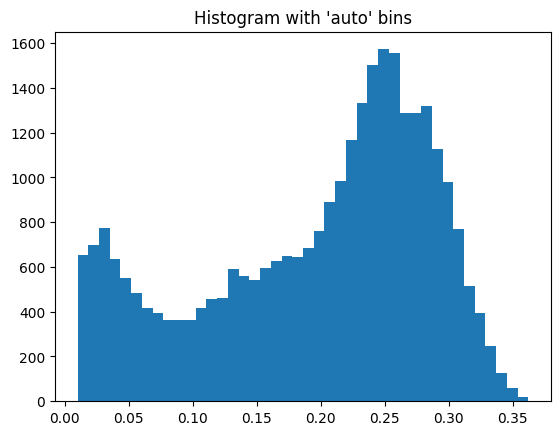

Standard Deviation:  0.08904538125139284
Threshold:  0.37485430812978593
--------------------------------------------------
--------------------------------------------------
WT_SCR_03.czi
Green Channel


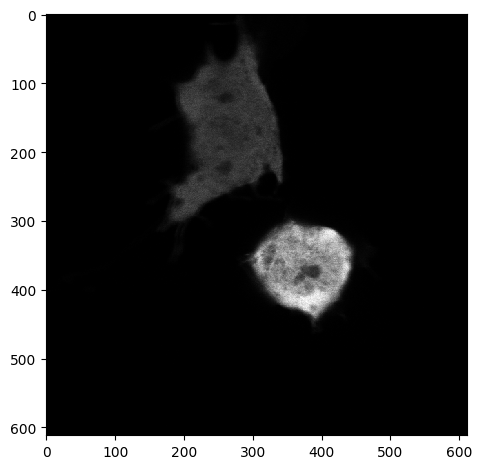

Segmented Cells


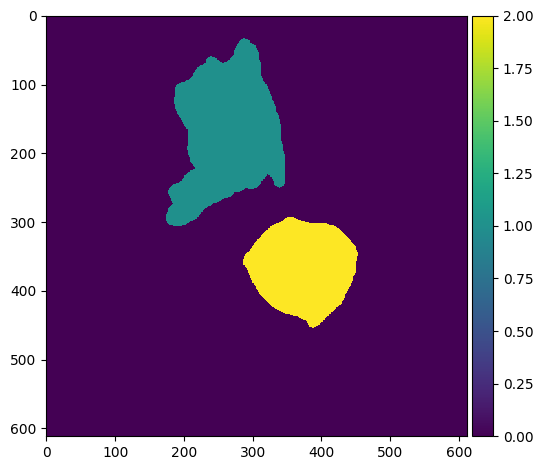

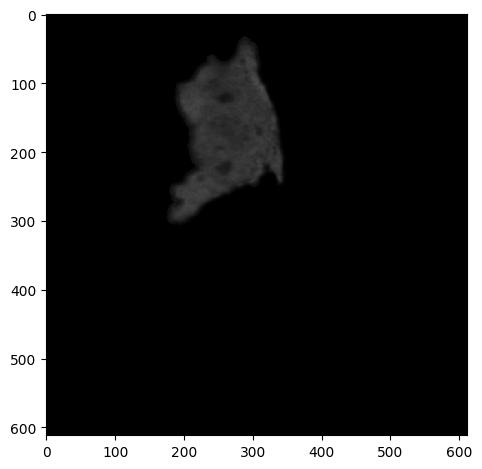

Bin count 76


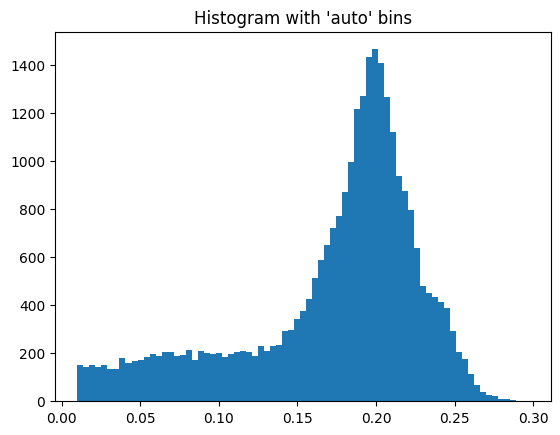

Standard Deviation:  0.057390437507071325
Threshold:  0.28731910178593206


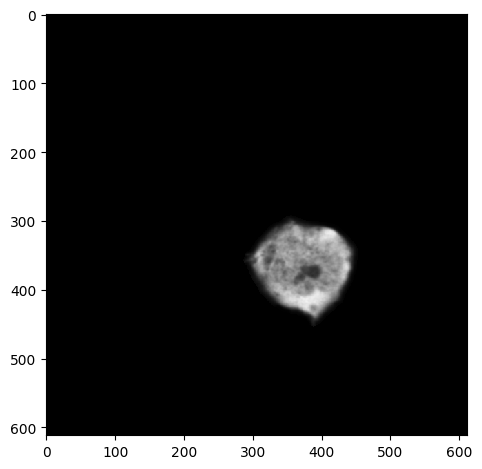

Bin count 37


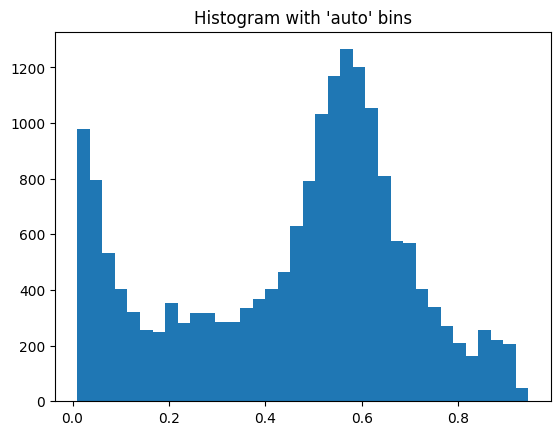

Standard Deviation:  0.23867259293745846
Threshold:  0.936779078092471
--------------------------------------------------
--------------------------------------------------
WT_SCR_04.czi
Green Channel


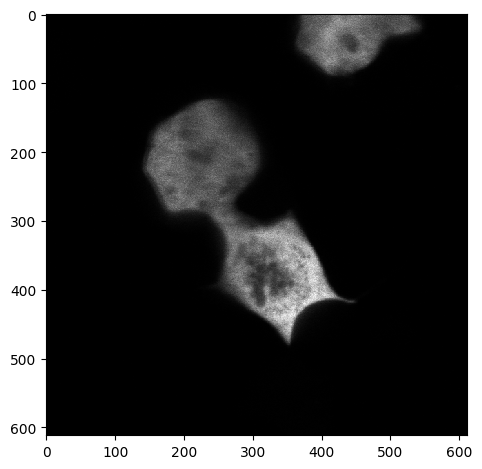

Segmented Cells


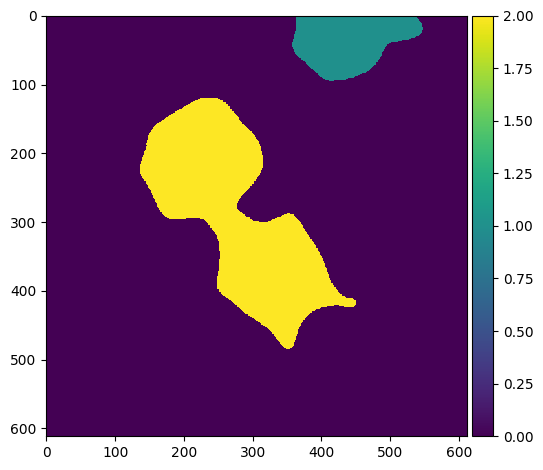

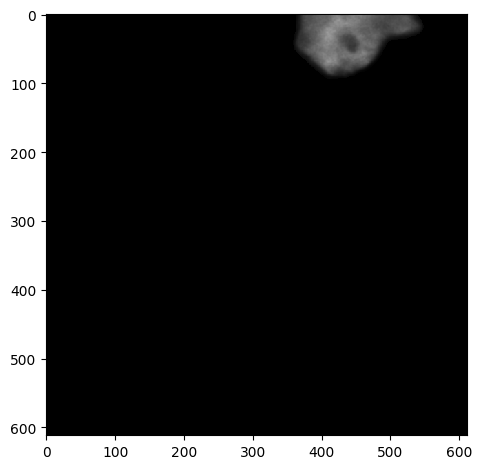

Bin count 39


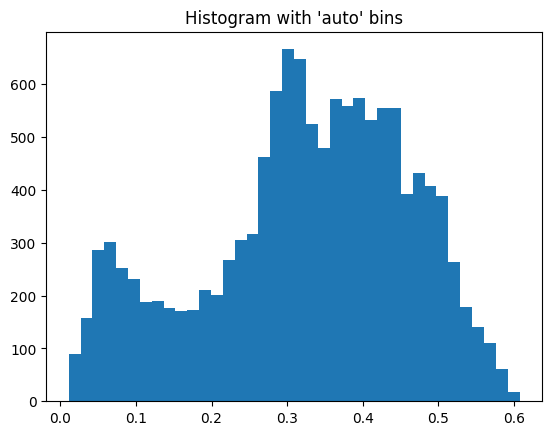

Standard Deviation:  0.13702997275988563
Threshold:  0.5985935897598402


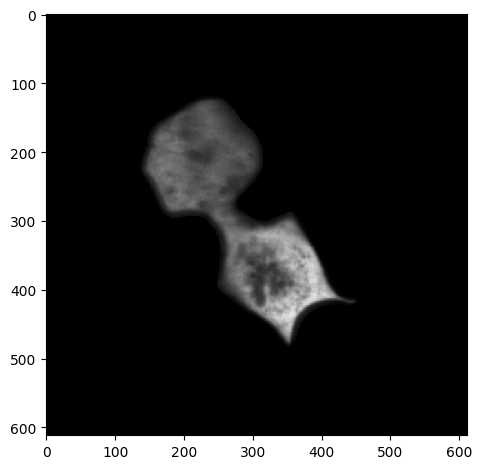

Bin count 81


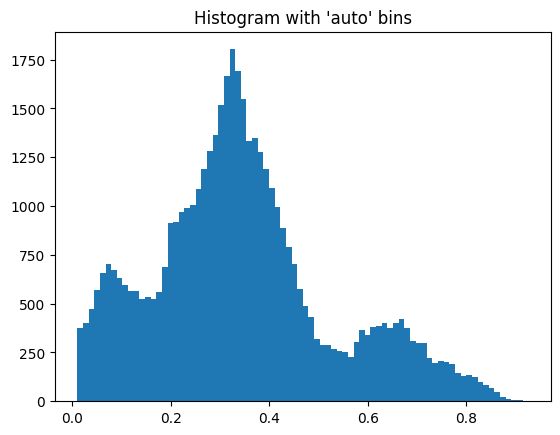

Standard Deviation:  0.18327006103425555
Threshold:  0.7118567307069861
Inclusion Areas:  [  27.   26.   13.   25. 1139.   39.  758.   54.]


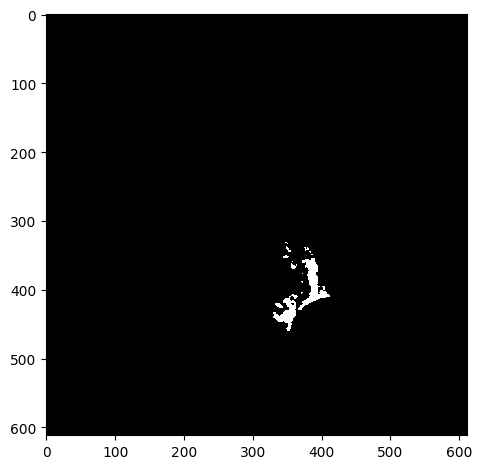

--------------------------------------------------
--------------------------------------------------
WT_SCR_05.czi
Green Channel


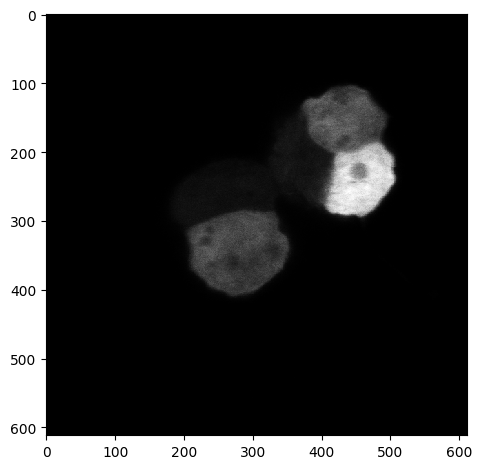

Segmented Cells


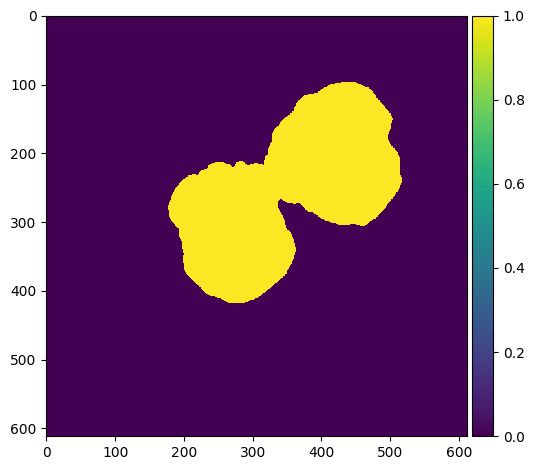

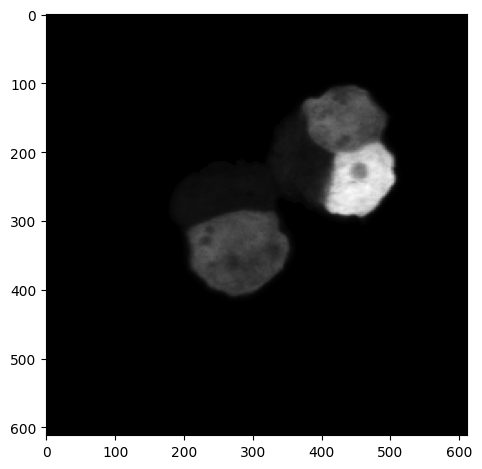

Bin count 82


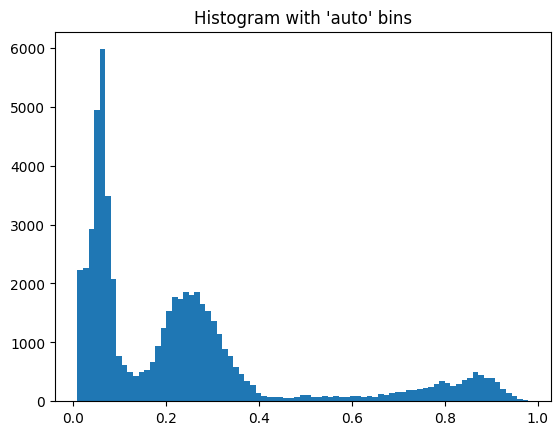

Standard Deviation:  0.24126759636897113
Threshold:  0.7228034407657
Inclusion Areas:  [5733.]


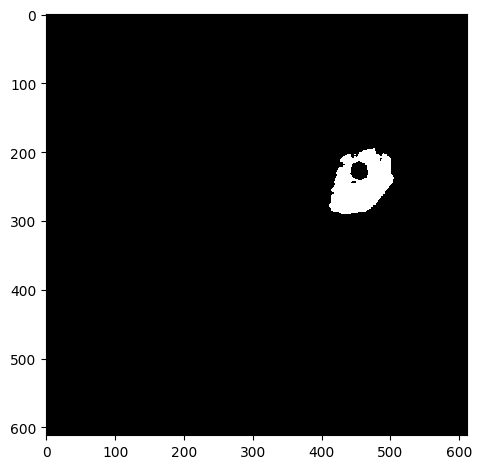

--------------------------------------------------
--------------------------------------------------
WT_SCR_06.czi
Green Channel


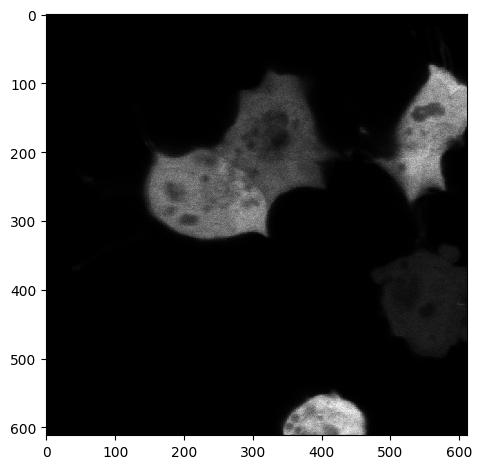

Segmented Cells


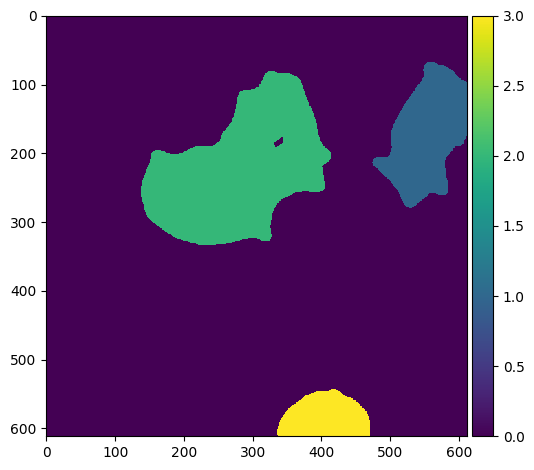

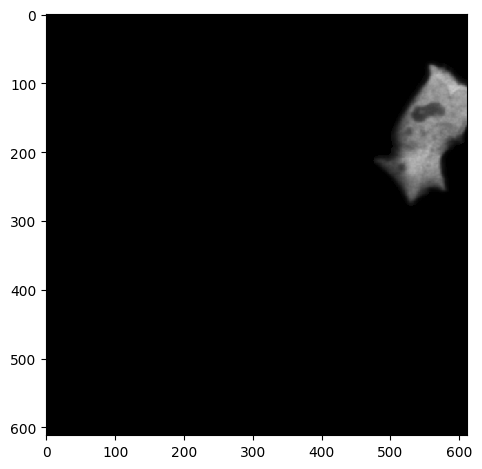

Bin count 31


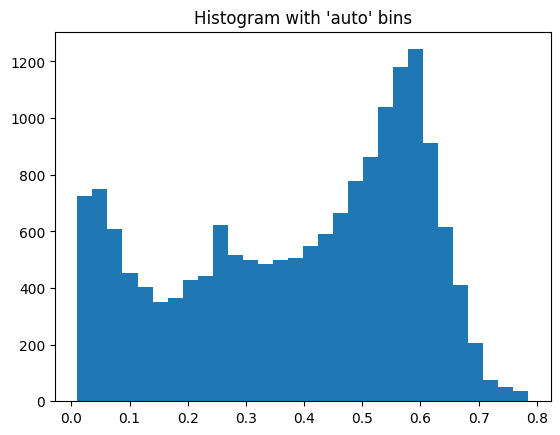

Standard Deviation:  0.2021550218947707
Threshold:  0.7939162212566597


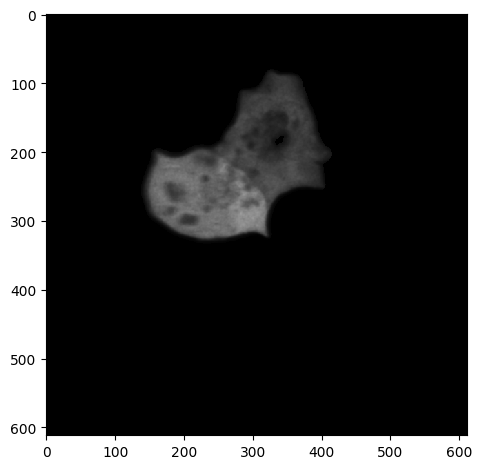

Bin count 55


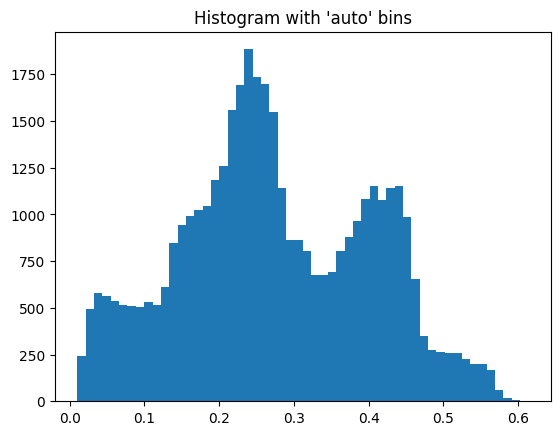

Standard Deviation:  0.12725150099849597
Threshold:  0.5291217037229368
Inclusion Areas:  [ 35.  13.  50. 664.]


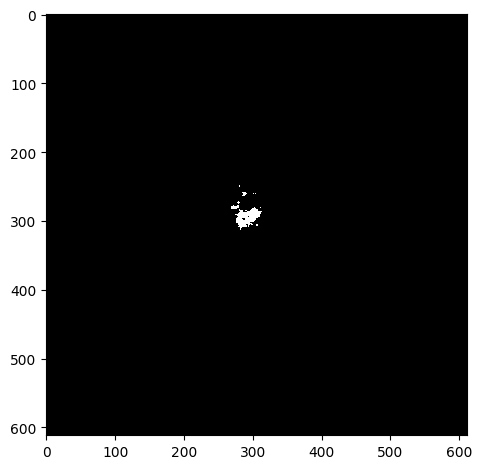

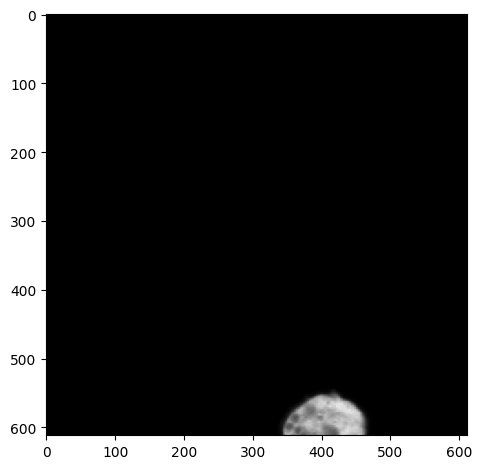

Bin count 25


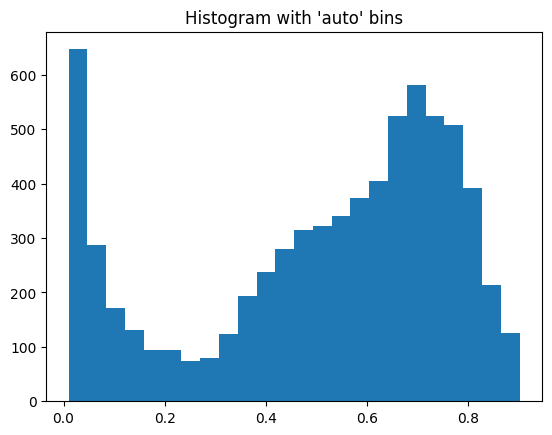

Standard Deviation:  0.2594176502853651
Threshold:  1.0292105604076651
--------------------------------------------------
--------------------------------------------------
WT_SCR_07.czi
Green Channel


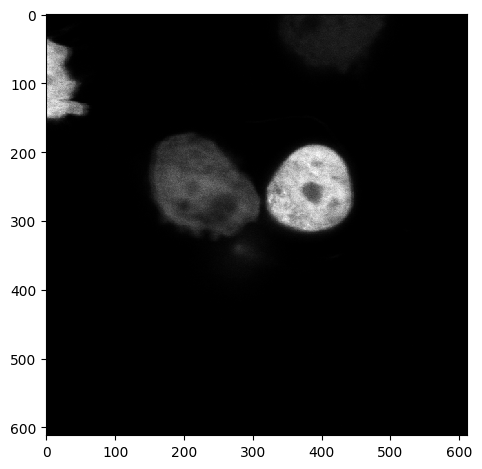

Segmented Cells


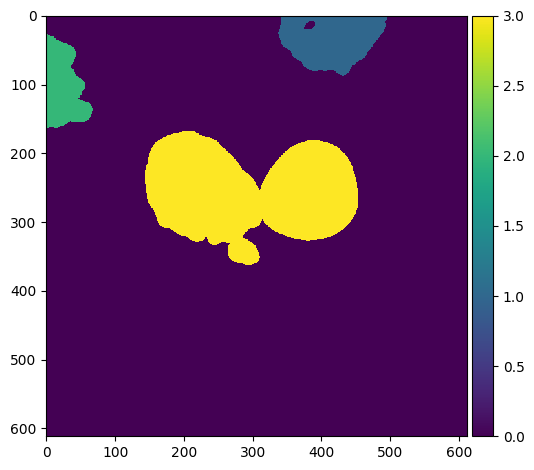

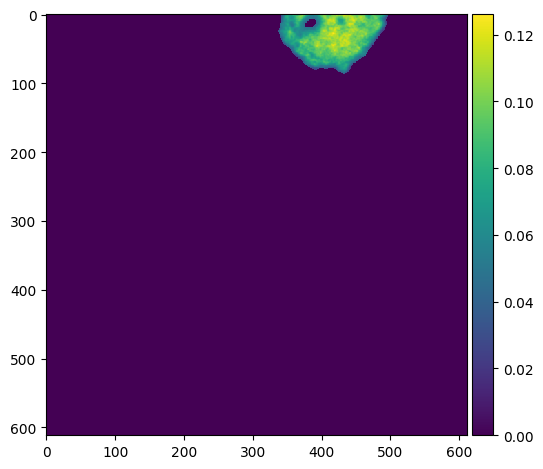

Bin count 38


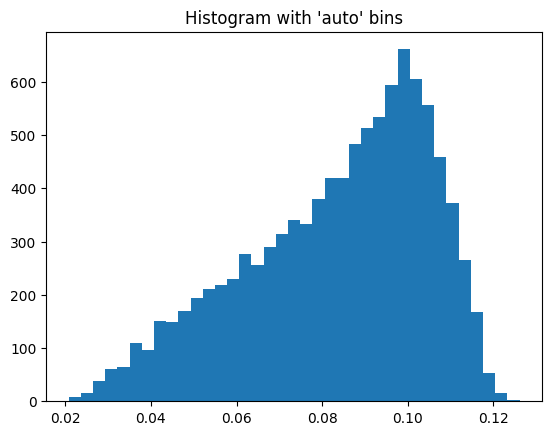

Standard Deviation:  0.021390182090922753
Threshold:  0.12631435856558917


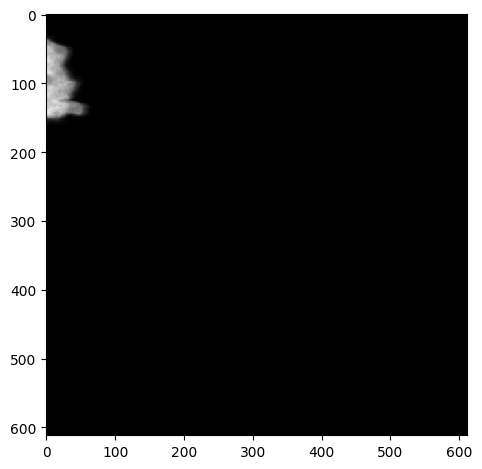

Bin count 16


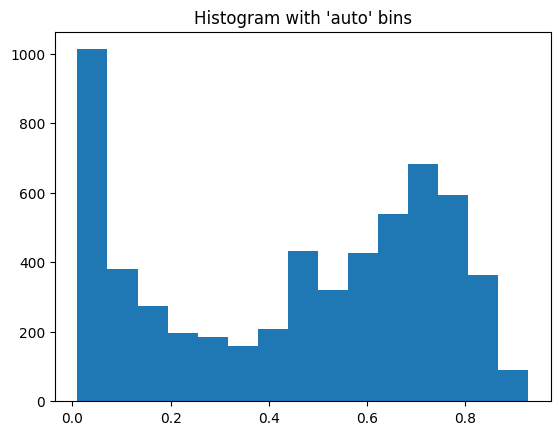

Standard Deviation:  0.28607436383316587
Threshold:  1.025499368707234


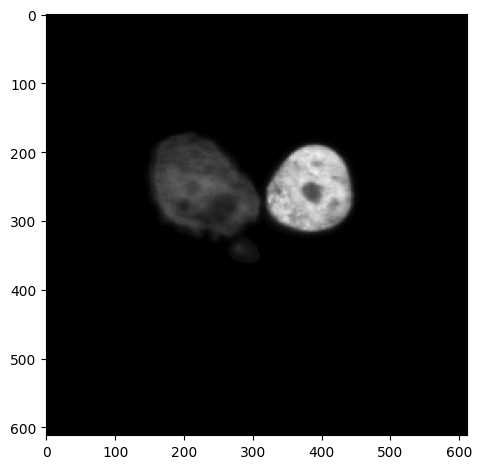

Bin count 38


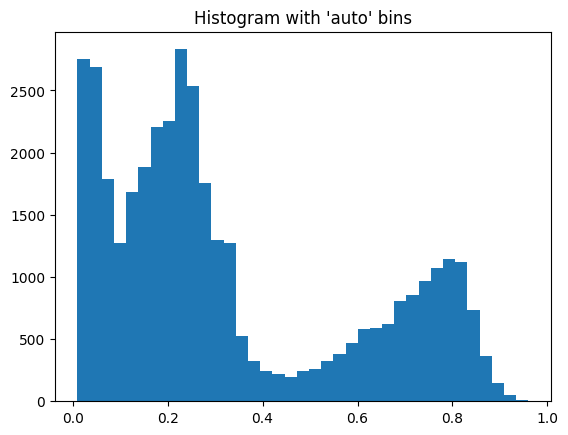

Standard Deviation:  0.263252863902893
Threshold:  0.8566898539450537
Inclusion Areas:  [208.  62.  83.  35.  61.  53.  31.  19.]


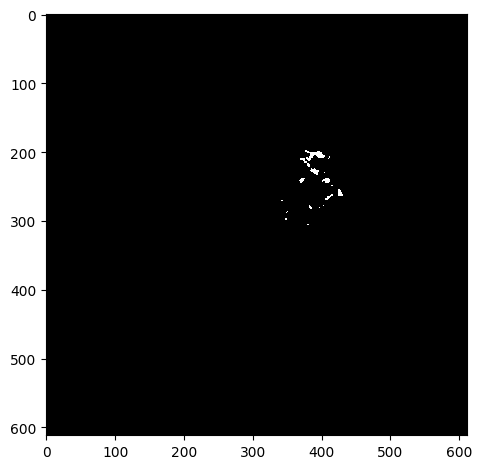

--------------------------------------------------
--------------------------------------------------
WT_SCR_08.czi
Green Channel


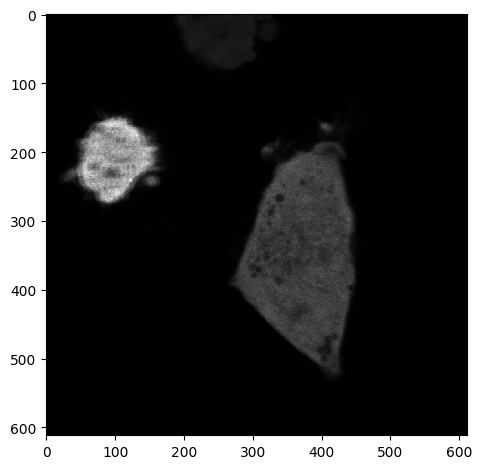

Segmented Cells


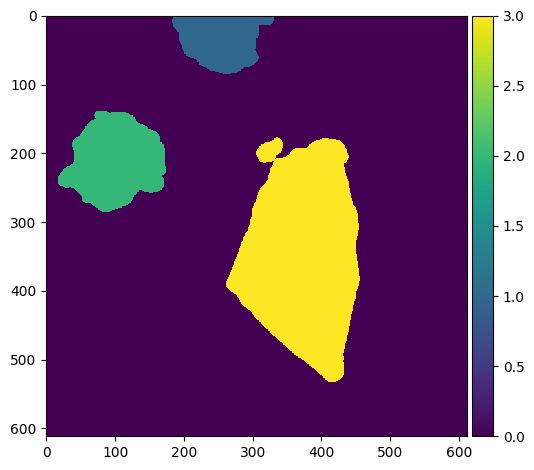

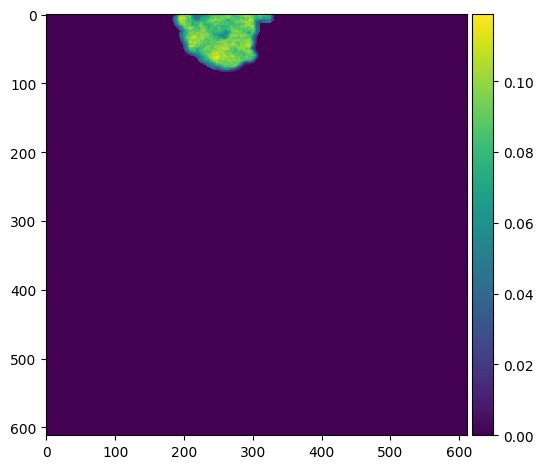

Bin count 55


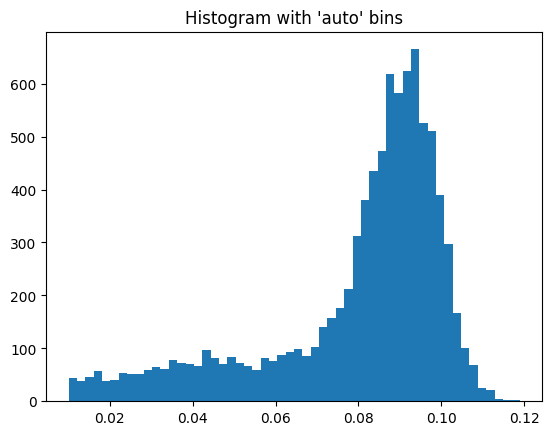

Standard Deviation:  0.022150390289257145
Threshold:  0.12391544108310419


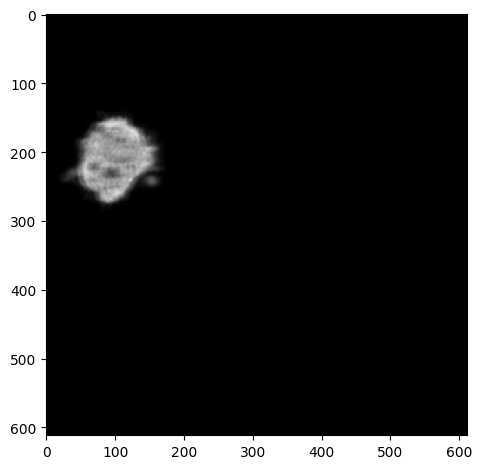

Bin count 23


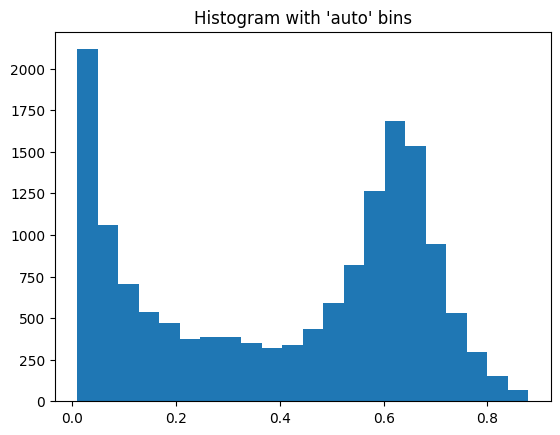

Standard Deviation:  0.25961084089119146
Threshold:  0.9277943647920637


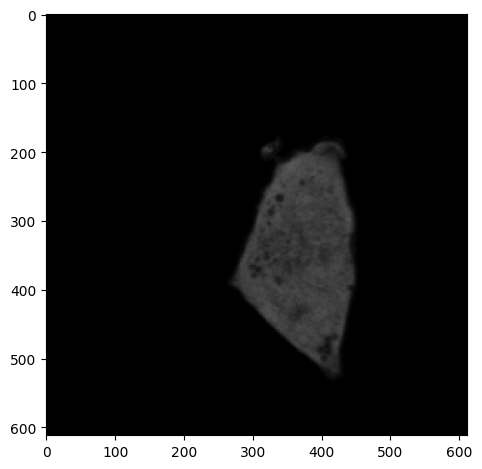

Bin count 84


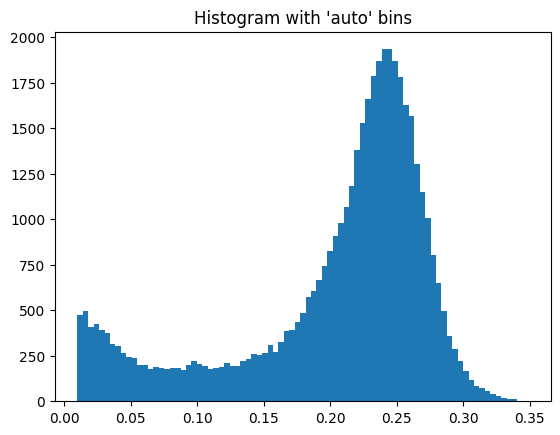

Standard Deviation:  0.07389655201669432
Threshold:  0.3508376014744893
--------------------------------------------------
--------------------------------------------------
WT_SCR_09.czi
Green Channel


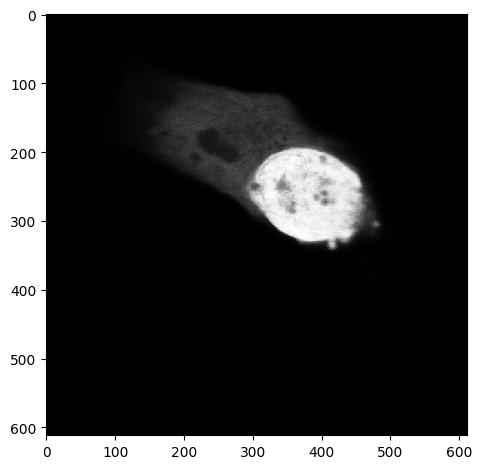

Segmented Cells


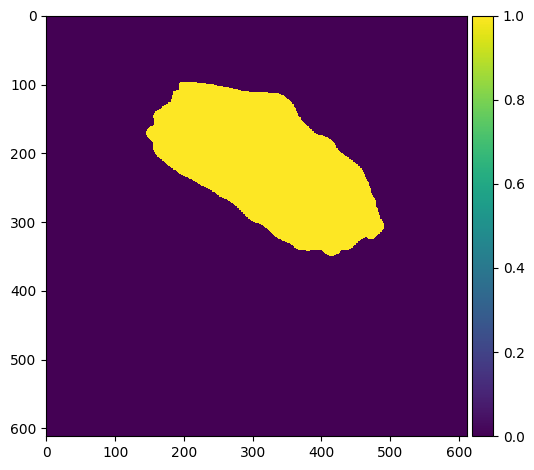

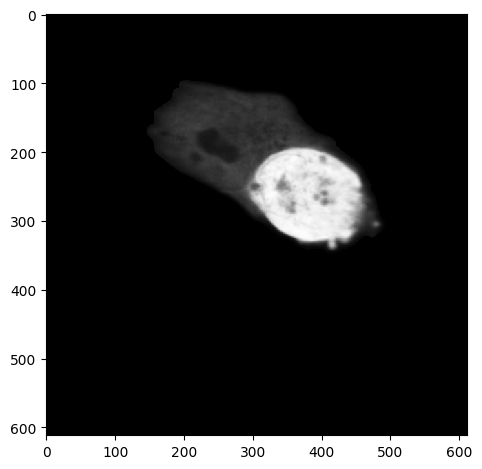

Bin count 29


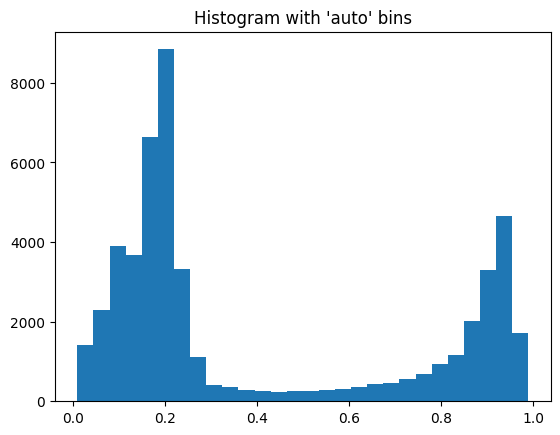

Standard Deviation:  0.33671121658631603
Threshold:  1.0806313102719152
--------------------------------------------------
--------------------------------------------------
WT_SCR_10.czi
Green Channel


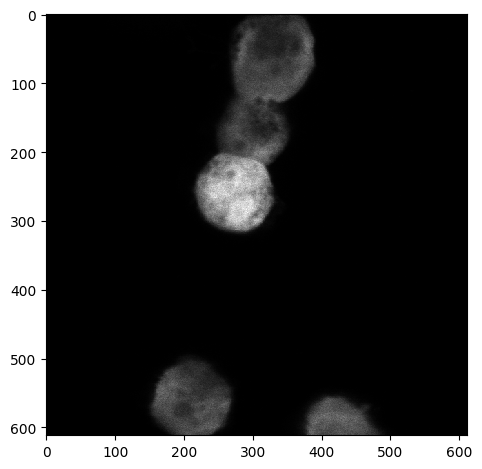

Segmented Cells


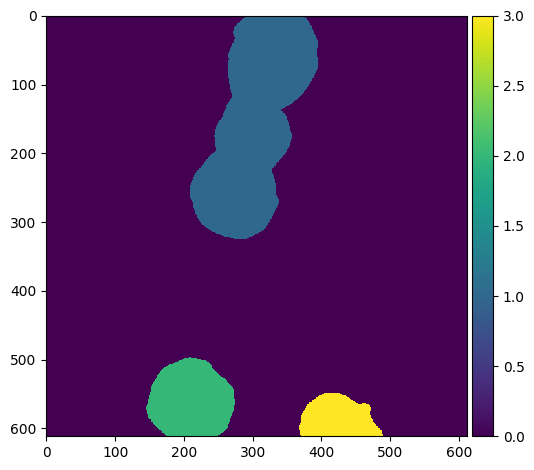

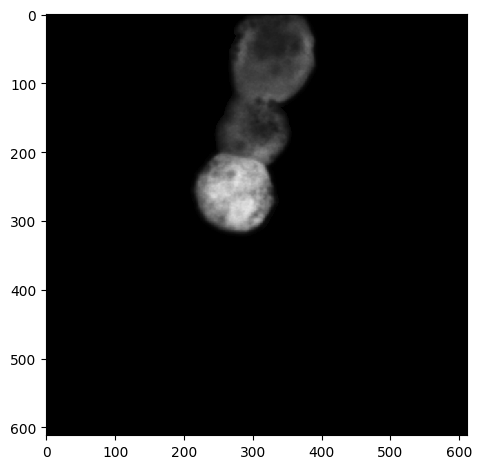

Bin count 59


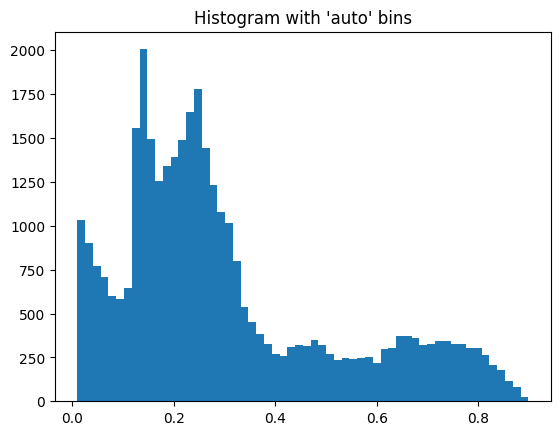

Standard Deviation:  0.2163636363057801
Threshold:  0.7368996144900354
Inclusion Areas:  [1254.   14. 1052.]


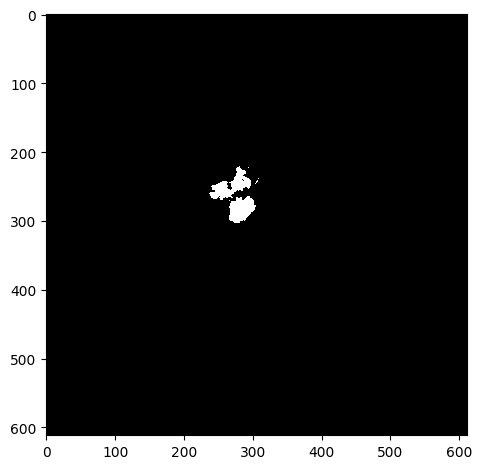

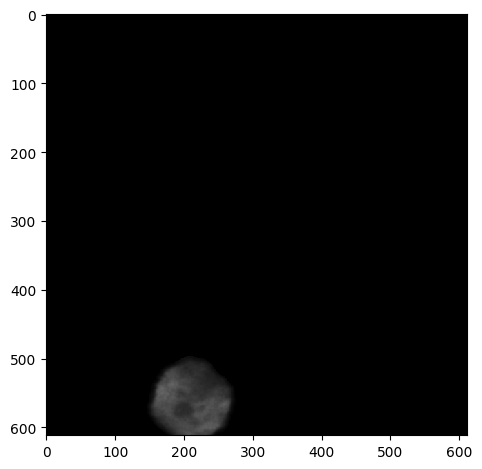

Bin count 35


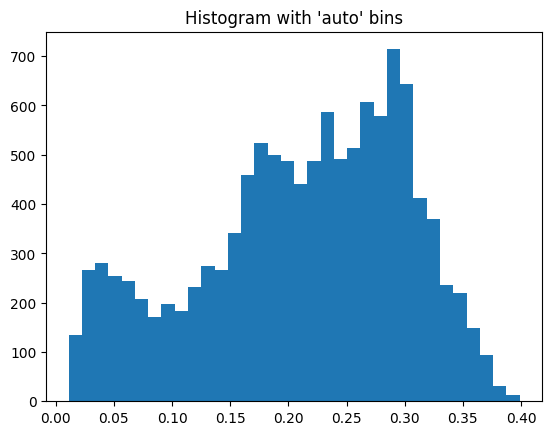

Standard Deviation:  0.08966036080170821
Threshold:  0.3909199991929808


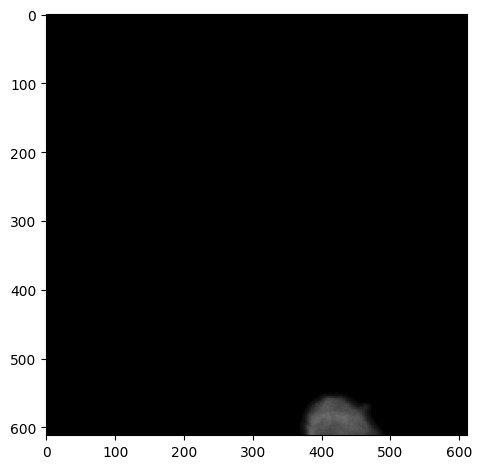

Bin count 20


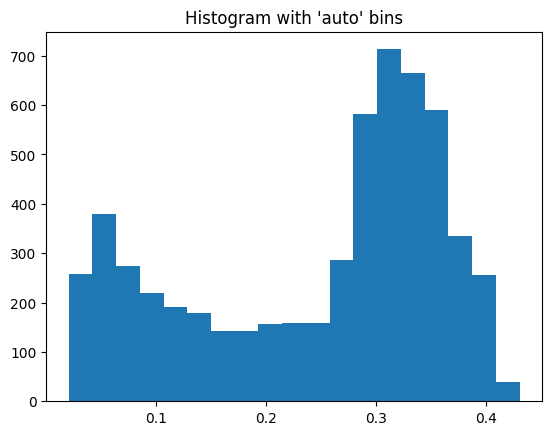

Standard Deviation:  0.11460229399572437
Threshold:  0.476489408119441
--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_01.czi
Green Channel


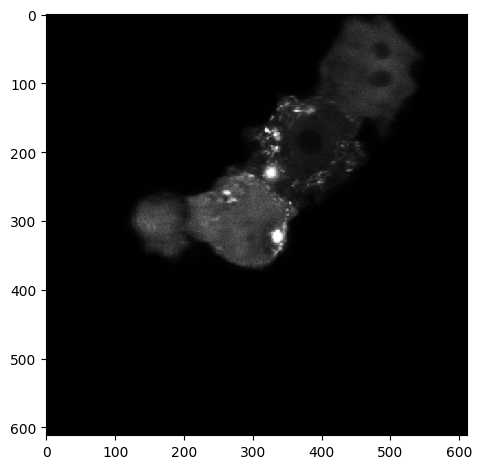

Segmented Cells


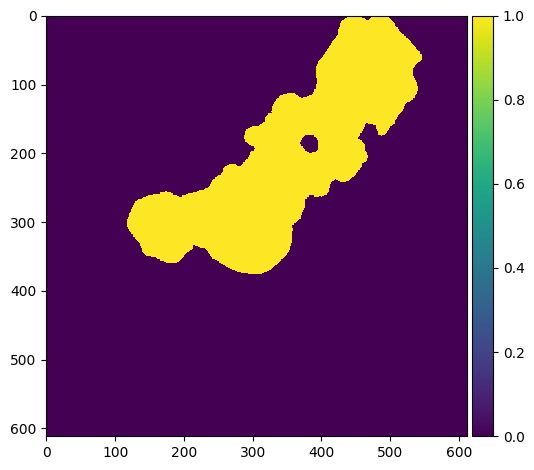

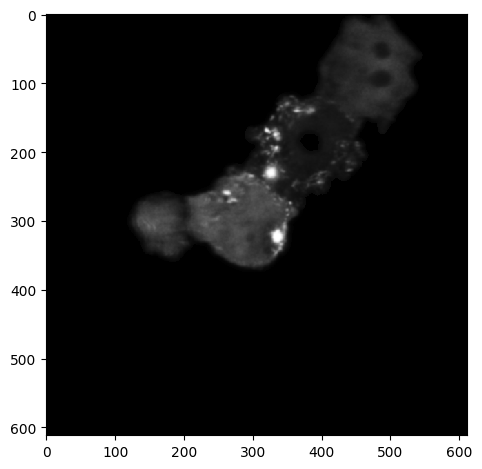

Bin count 145


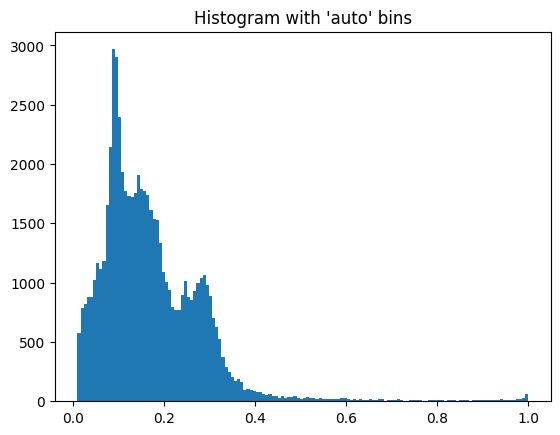

Standard Deviation:  0.11674768570080395
Threshold:  0.4055670544575227
Inclusion Areas:  [ 50.  44. 197.  64. 354.  41.  46.  11. 211.  11.  15. 544.]


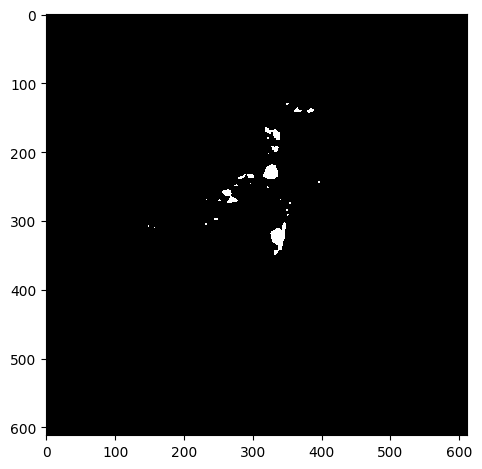

--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_02.czi
Green Channel


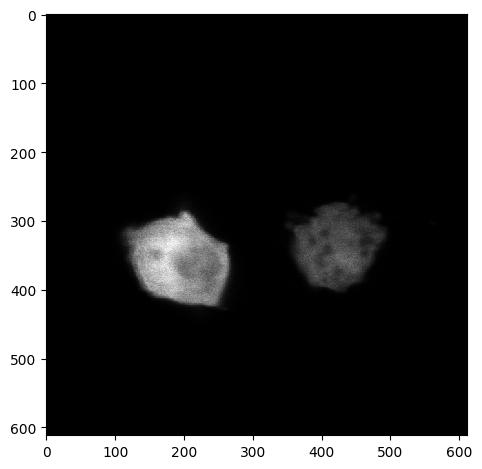

Segmented Cells


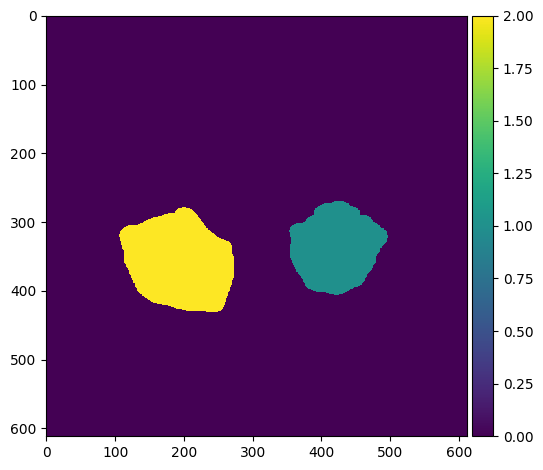

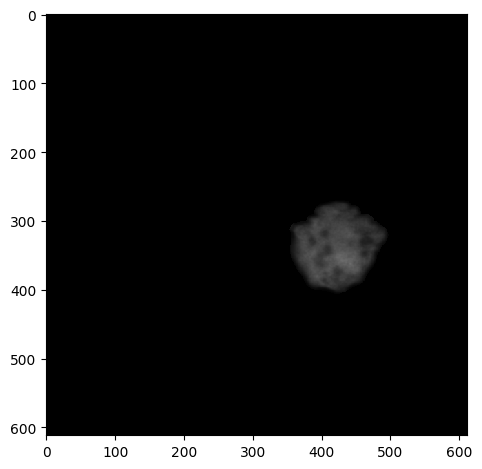

Bin count 46


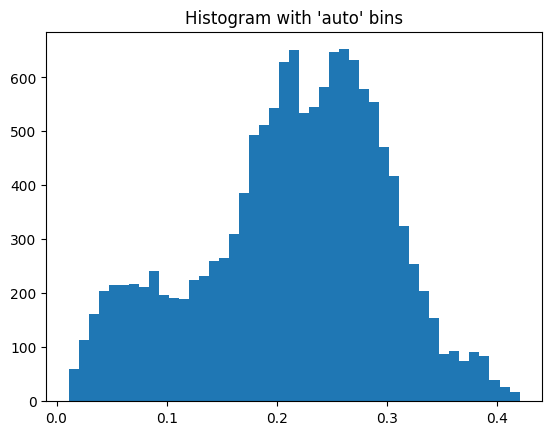

Standard Deviation:  0.08452074939663994
Threshold:  0.3831462145854228
Inclusion Areas:  [170.]


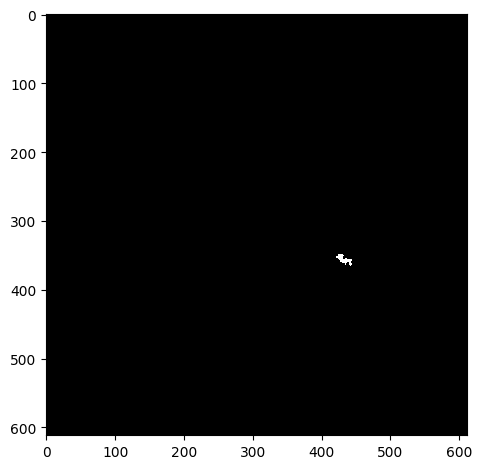

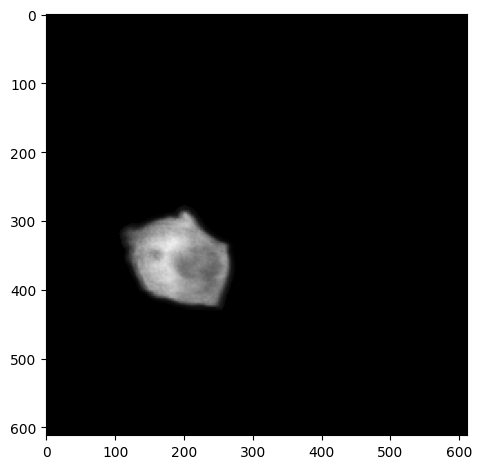

Bin count 40


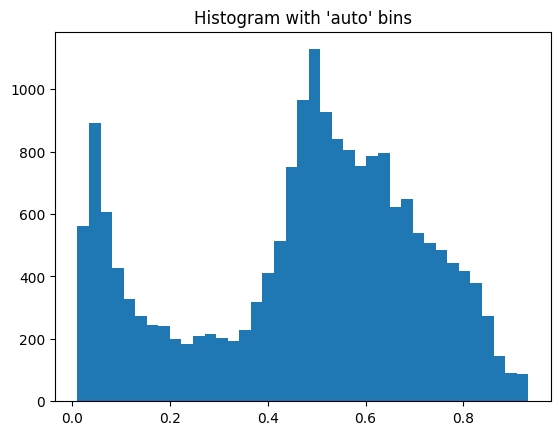

Standard Deviation:  0.23818290753816135
Threshold:  0.9524177047084308
--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_03.czi
Green Channel


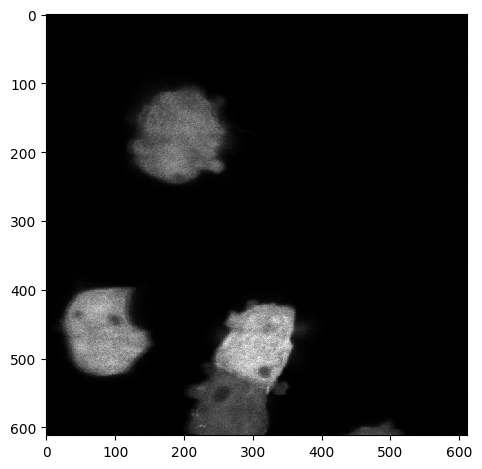

Segmented Cells


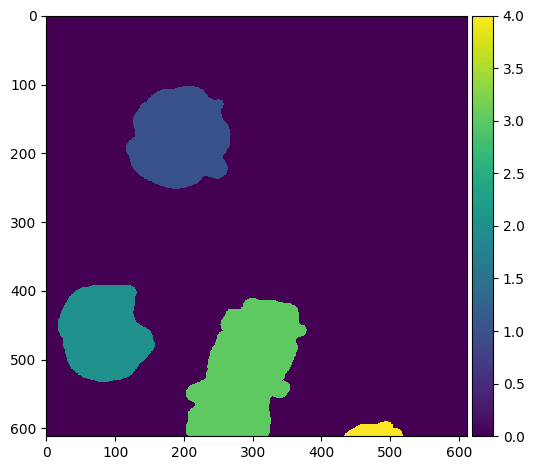

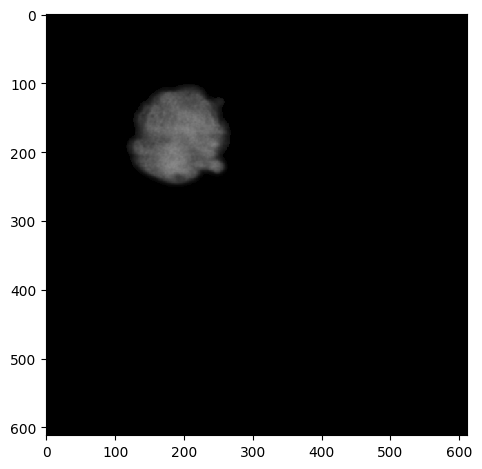

Bin count 36


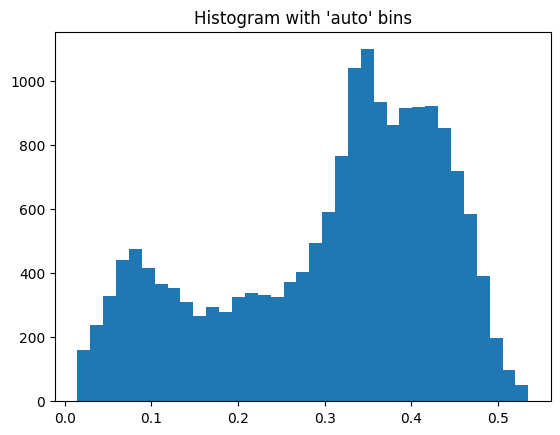

Standard Deviation:  0.12908139483108905
Threshold:  0.5641623227802688


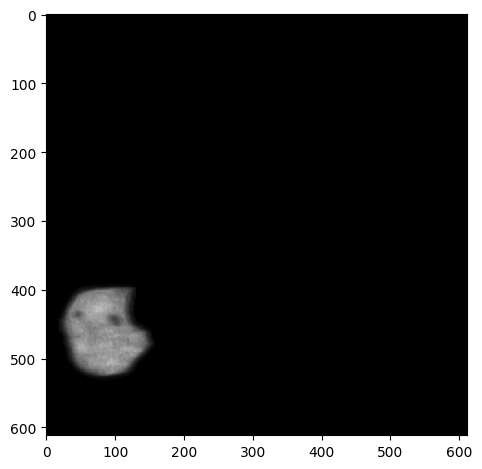

Bin count 31


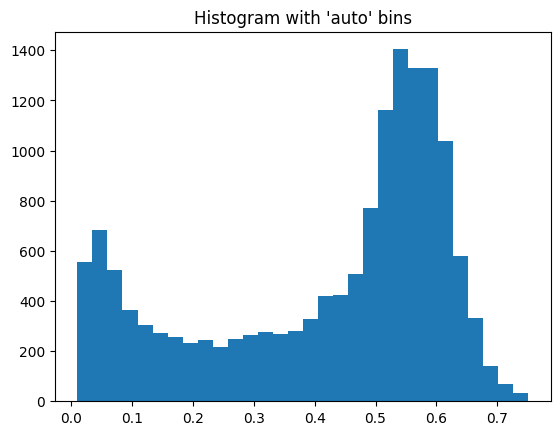

Standard Deviation:  0.2011631261782091
Threshold:  0.8212729687902192


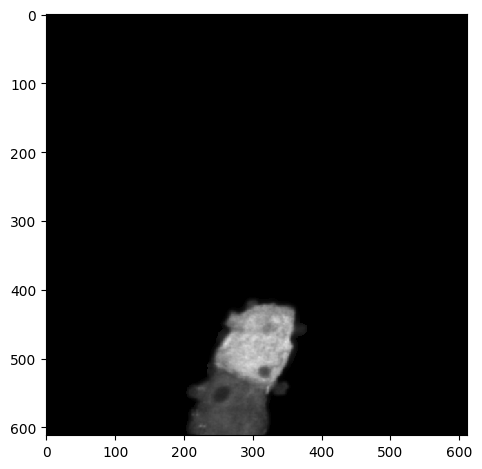

Bin count 32


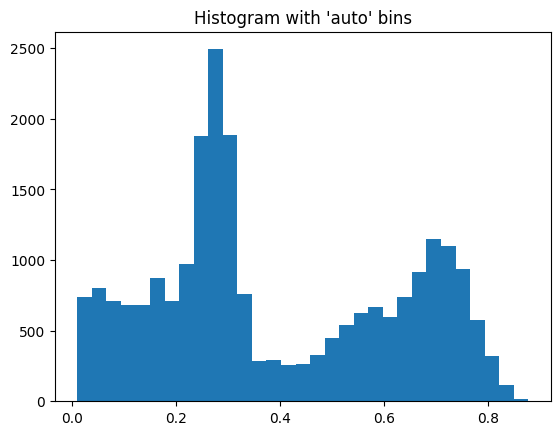

Standard Deviation:  0.23344626590119325
Threshold:  0.8589686483289473


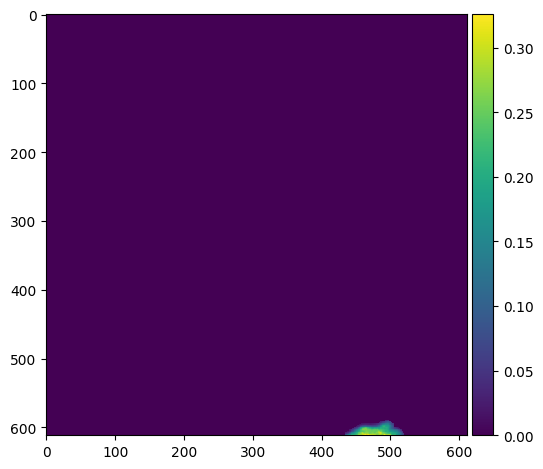

Bin count 13


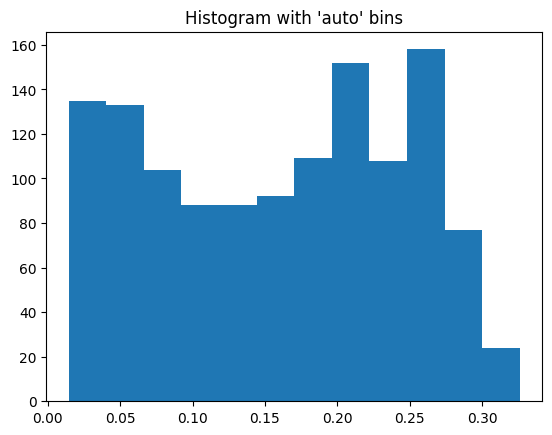

Standard Deviation:  0.08552016917184378
Threshold:  0.33018494194009373
--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_04.czi
Green Channel


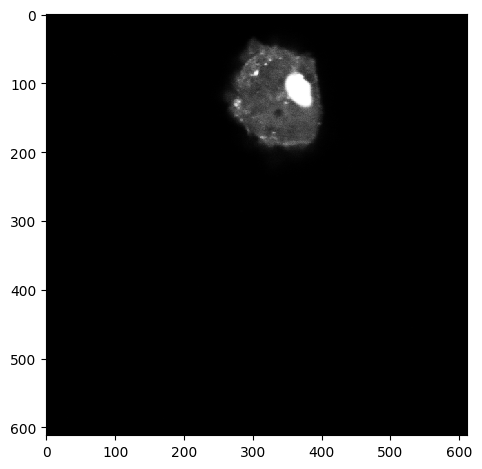

Segmented Cells


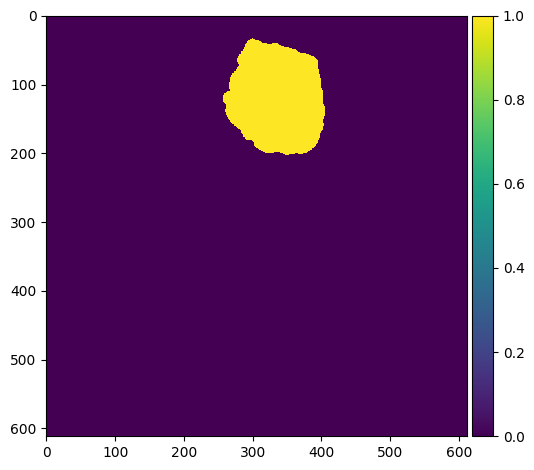

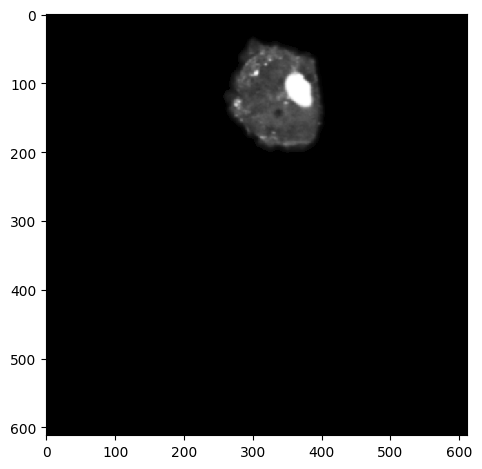

Bin count 114


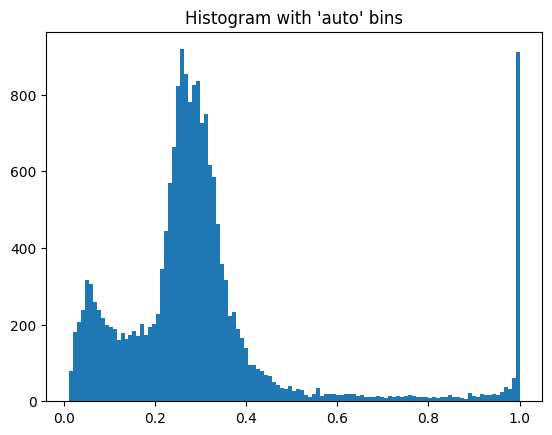

Standard Deviation:  0.2157344442221215
Threshold:  0.740454151312826
Inclusion Areas:  [  29. 1346.]


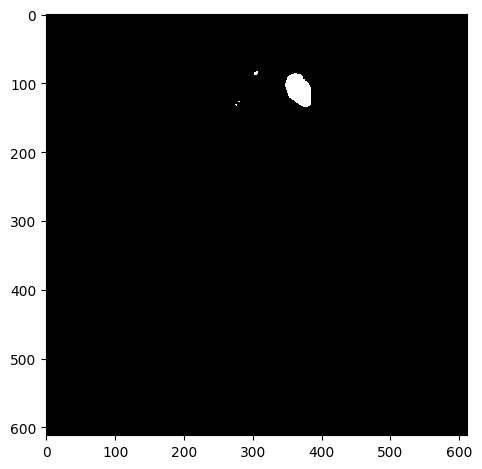

--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_05.czi
Green Channel


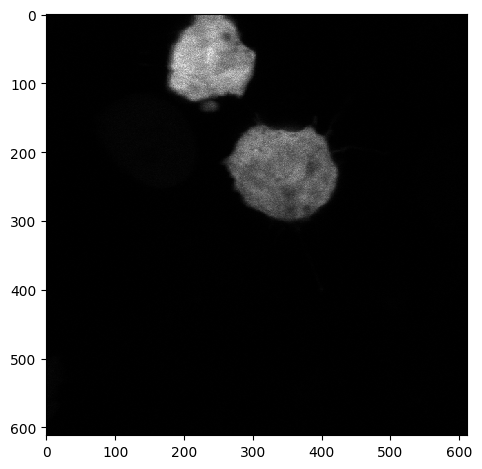

Segmented Cells


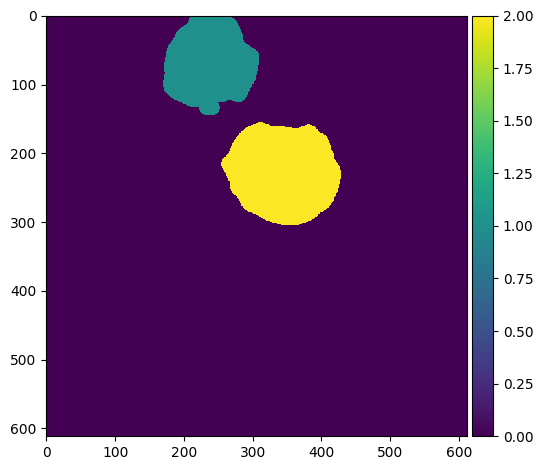

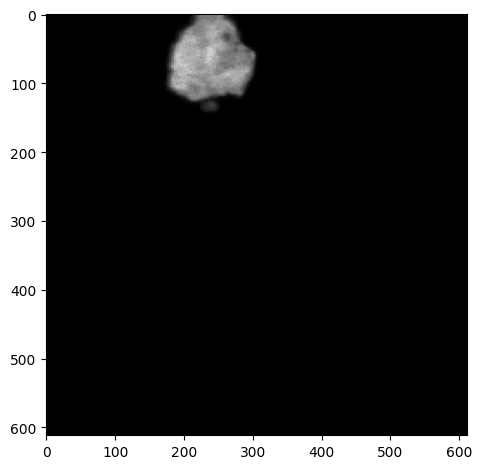

Bin count 34


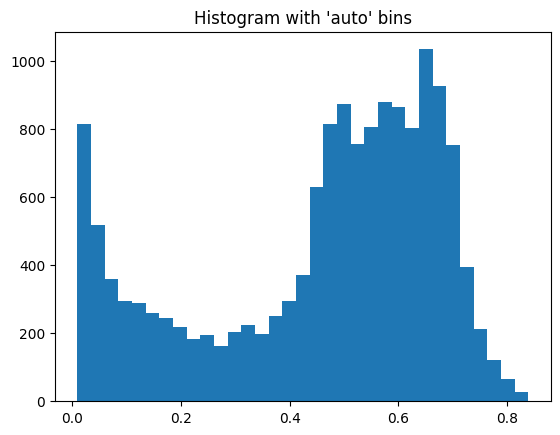

Standard Deviation:  0.21955909318657846
Threshold:  0.8961718126080991


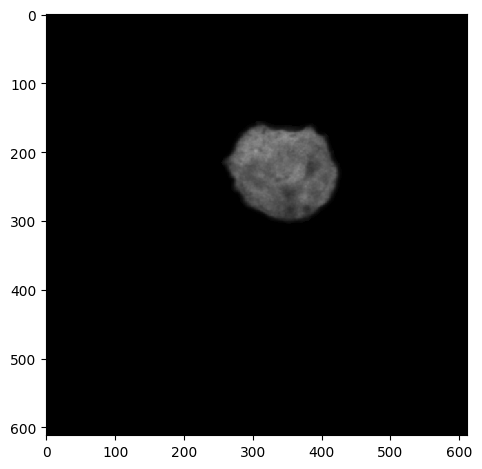

Bin count 58


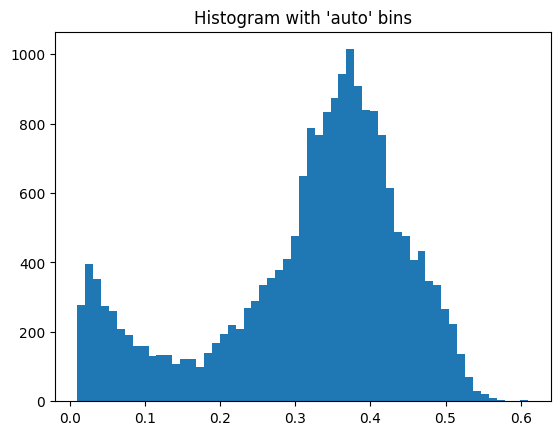

Standard Deviation:  0.12902410008637388
Threshold:  0.5769349616021378
--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_06.czi
Green Channel


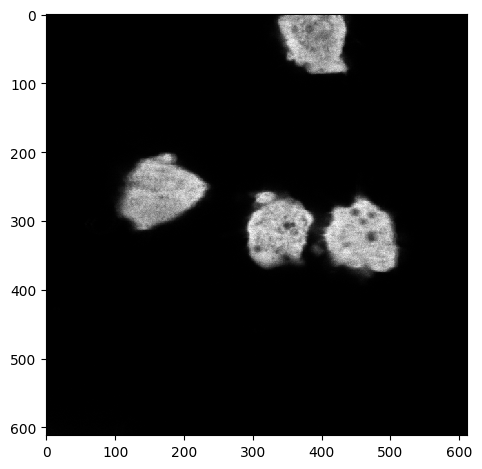

Segmented Cells


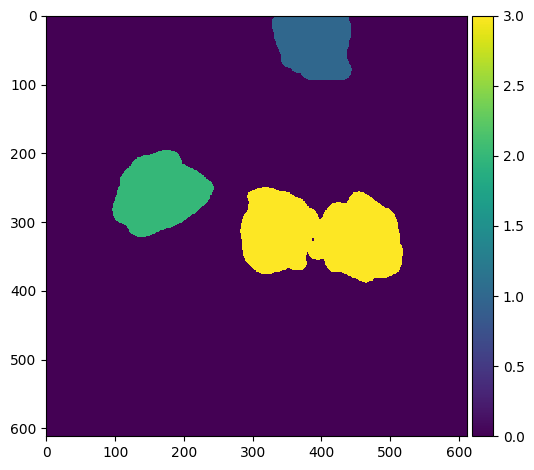

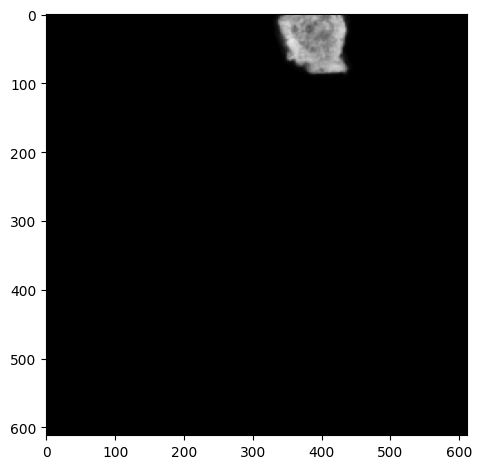

Bin count 35


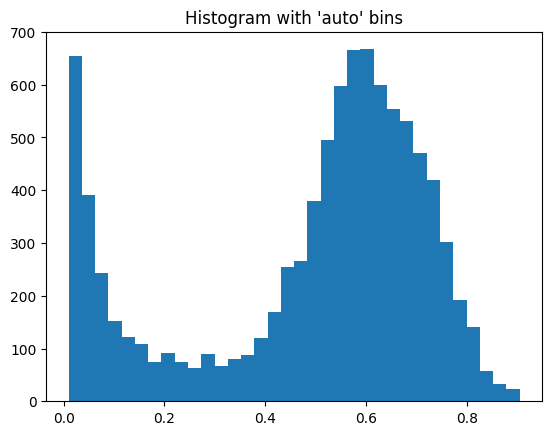

Standard Deviation:  0.2382964587892093
Threshold:  0.966069754490537


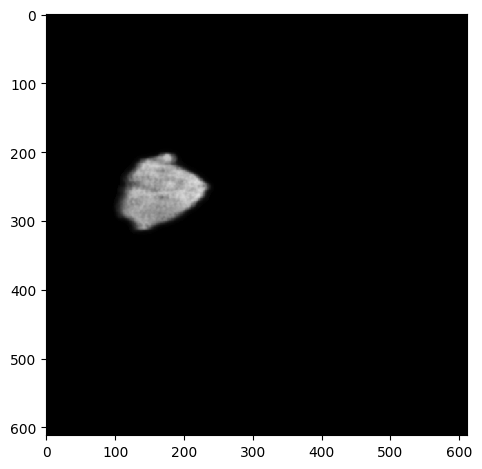

Bin count 24


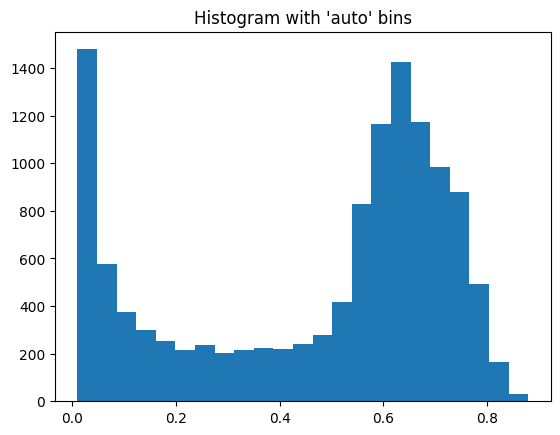

Standard Deviation:  0.26024095972499317
Threshold:  0.9906702531747904


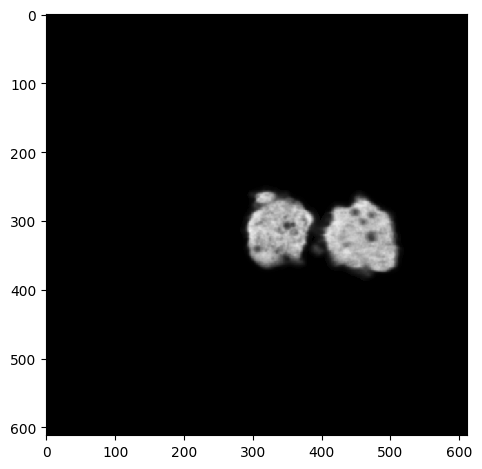

Bin count 26


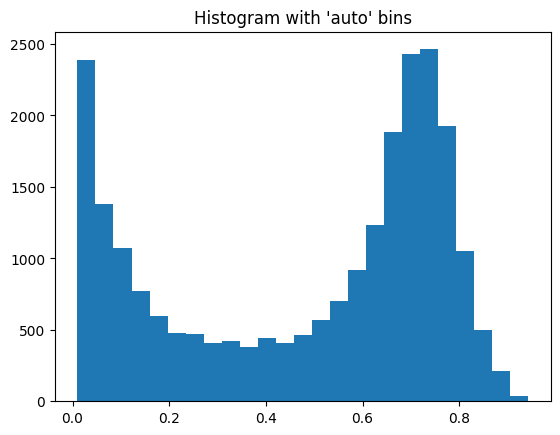

Standard Deviation:  0.28304617827326617
Threshold:  1.0497343211806822
--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_07.czi
Green Channel


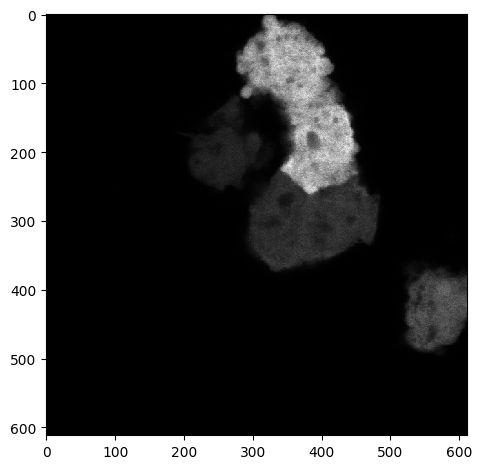

Segmented Cells


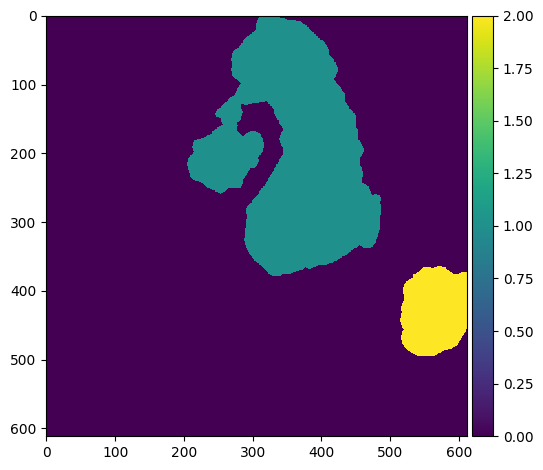

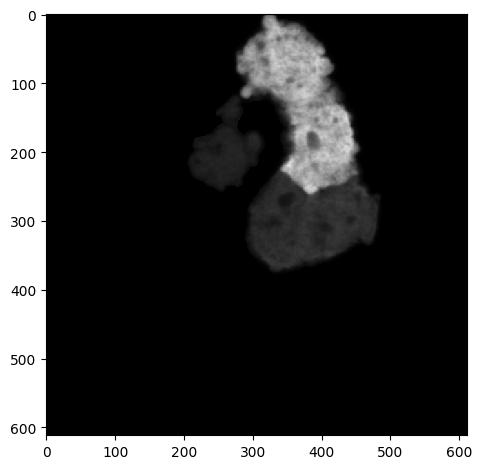

Bin count 41


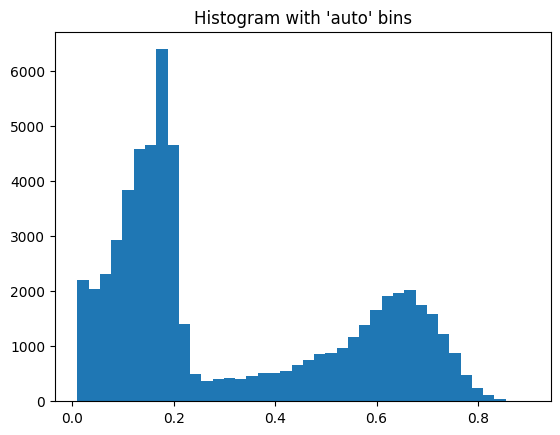

Standard Deviation:  0.23957842777498875
Threshold:  0.7957470066030599
Inclusion Areas:  [13. 26. 33. 25. 20. 71. 16. 46. 17.]


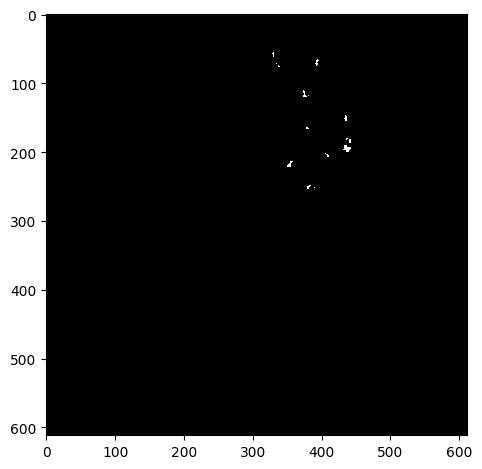

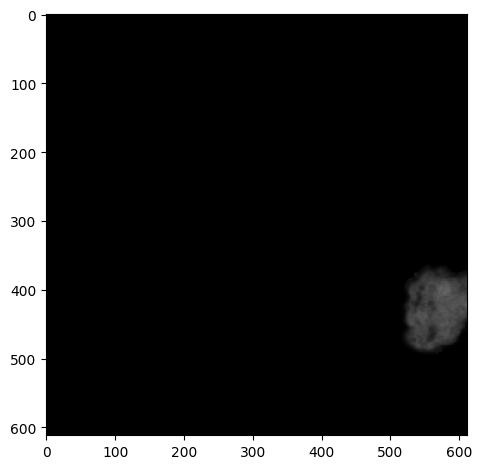

Bin count 33


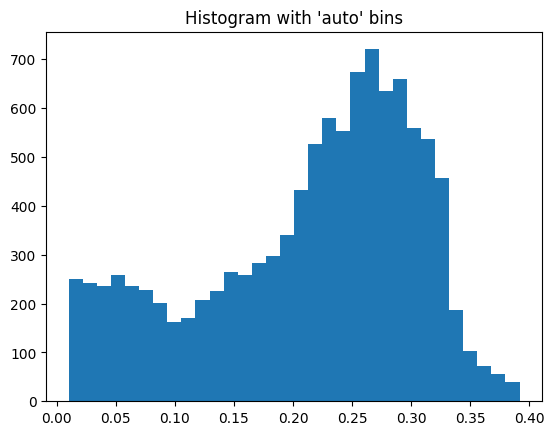

Standard Deviation:  0.09176014018064423
Threshold:  0.39727276079822726
--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_08.czi
Green Channel


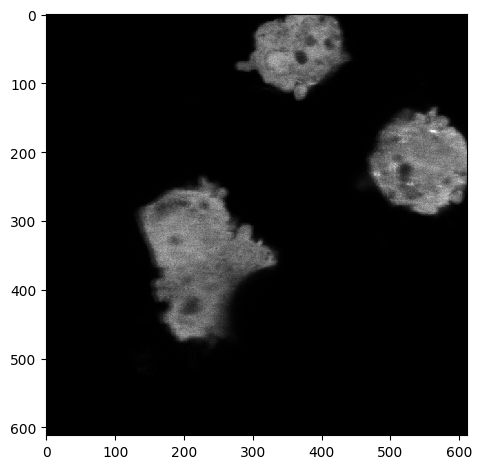

Segmented Cells


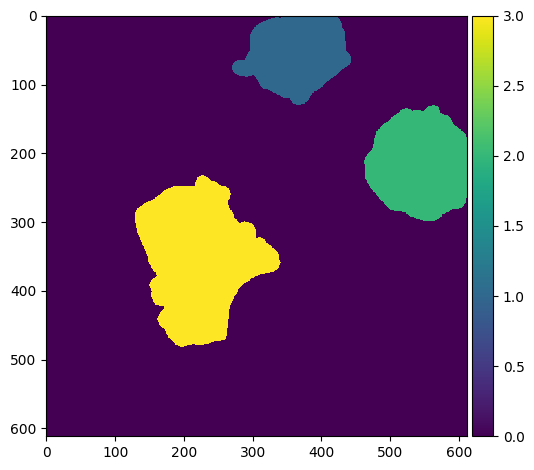

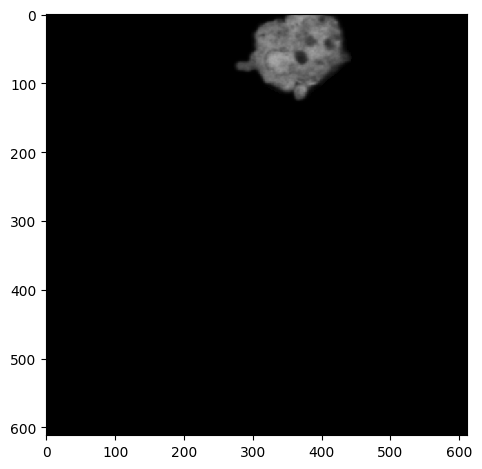

Bin count 43


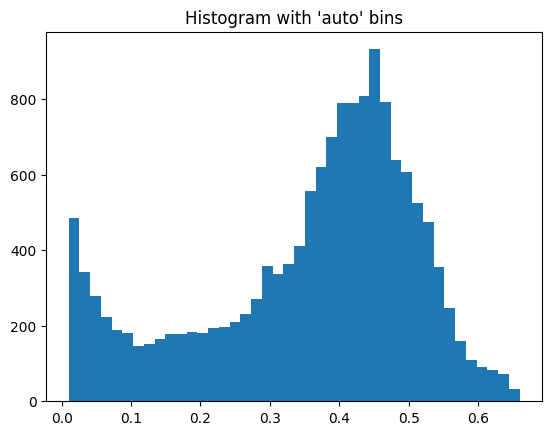

Standard Deviation:  0.15582110117240716
Threshold:  0.6691261313615617


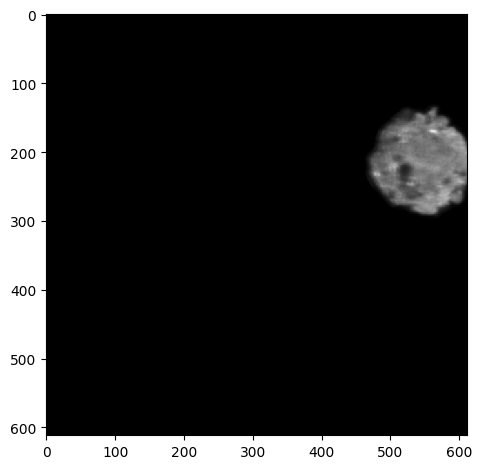

Bin count 62


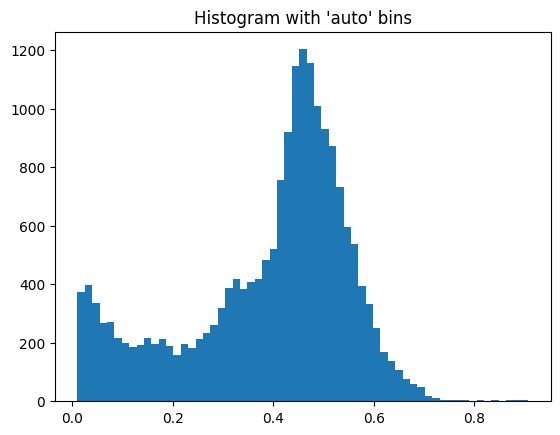

Standard Deviation:  0.1641478414700219
Threshold:  0.7184773696169922
Inclusion Areas:  [39.]


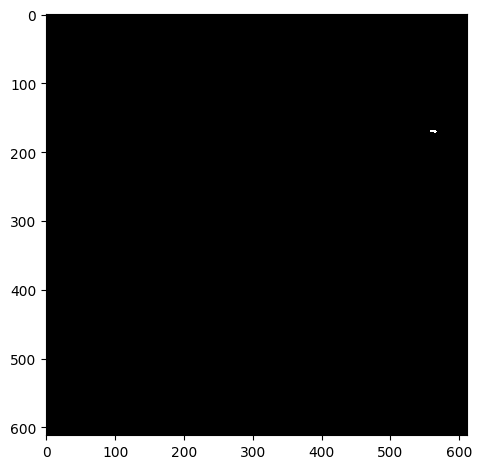

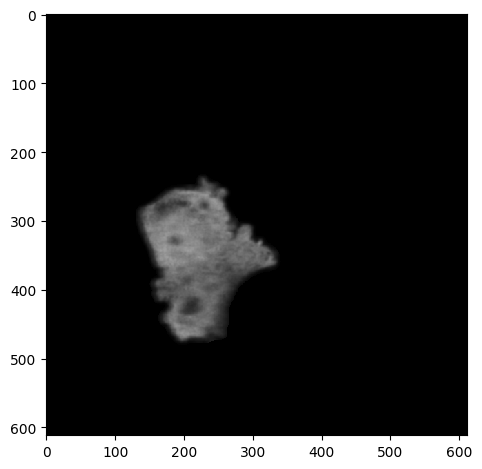

Bin count 48


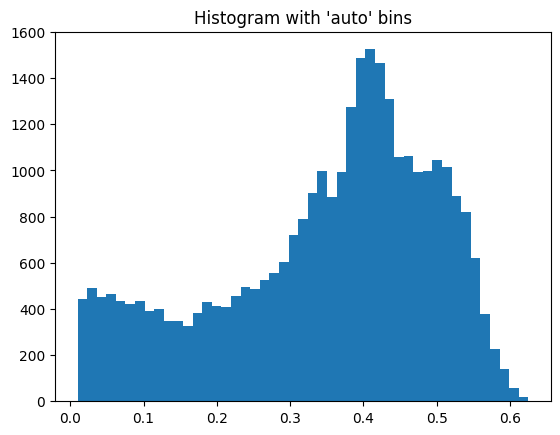

Standard Deviation:  0.1485664582586453
Threshold:  0.6451547044956132
--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_09.czi
Green Channel


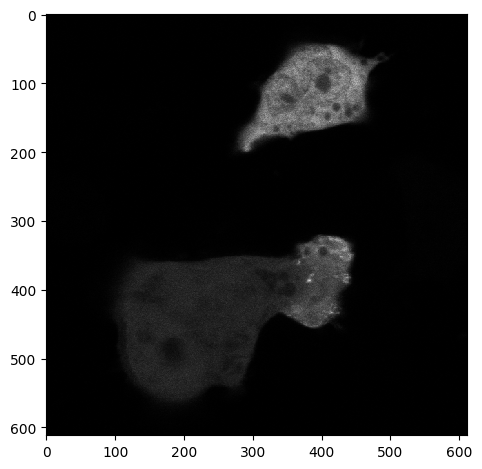

Segmented Cells


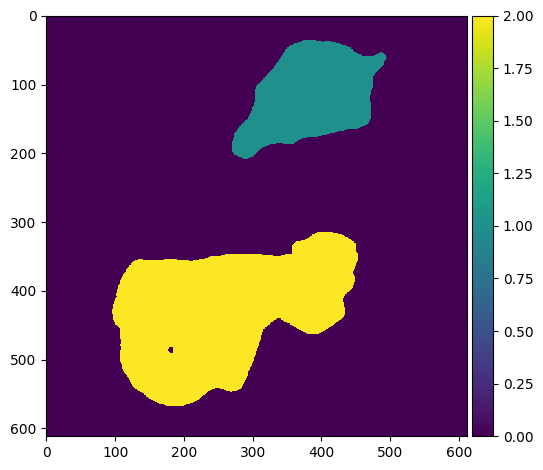

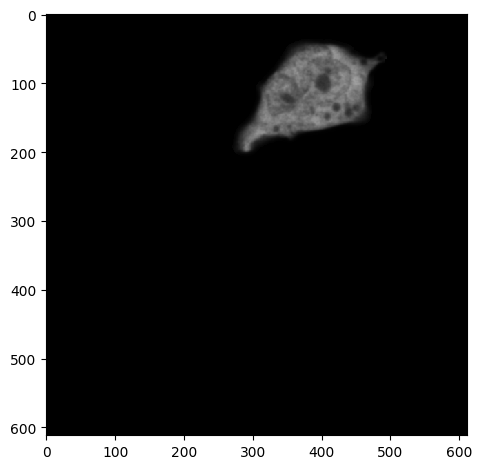

Bin count 38


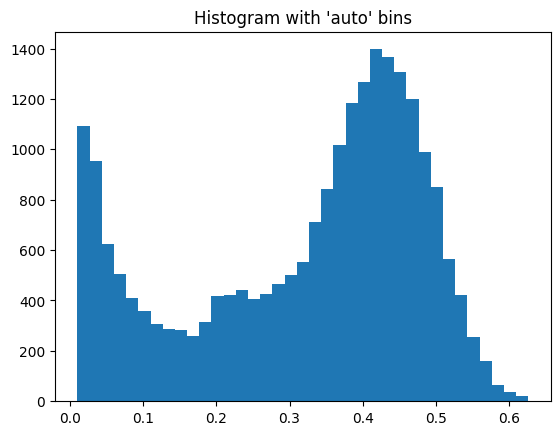

Standard Deviation:  0.15979070762079267
Threshold:  0.6412726424421198


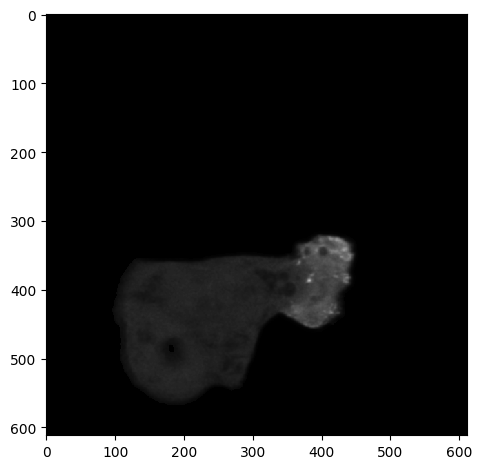

Bin count 384


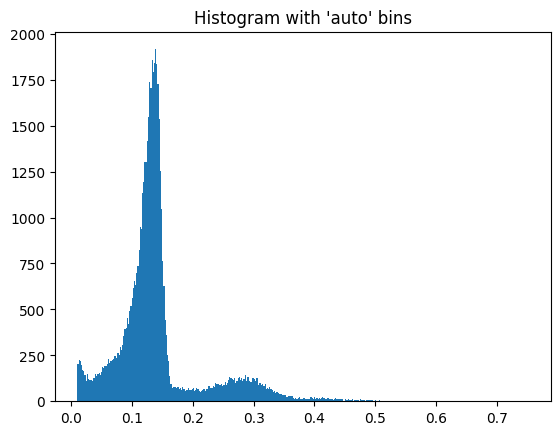

Standard Deviation:  0.07454179584574433
Threshold:  0.2920512514077254
Inclusion Areas:  [2340.   17.   23.   32.  117.   17.  515.  327.   15.   76.   16.]


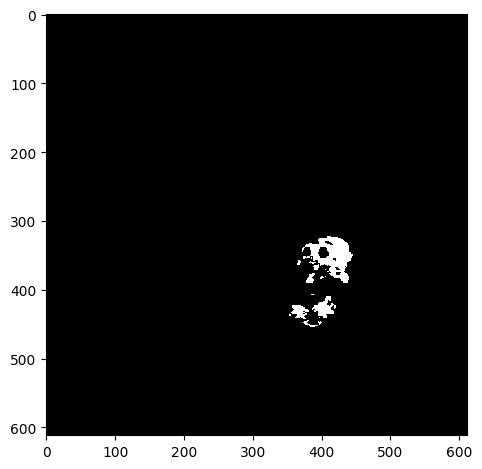

--------------------------------------------------
--------------------------------------------------
WT_TAX1BP1_10.czi
Green Channel


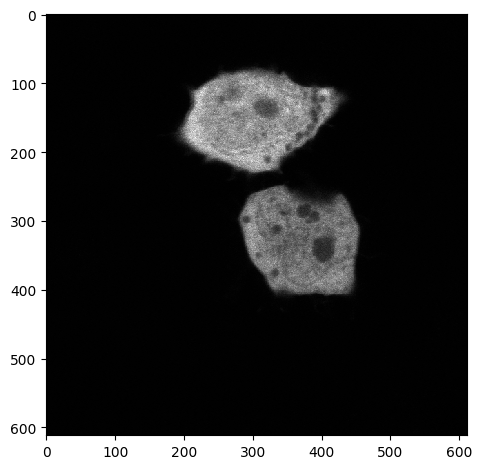

Segmented Cells


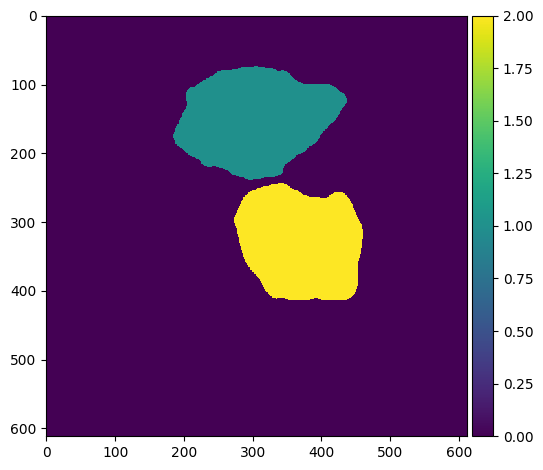

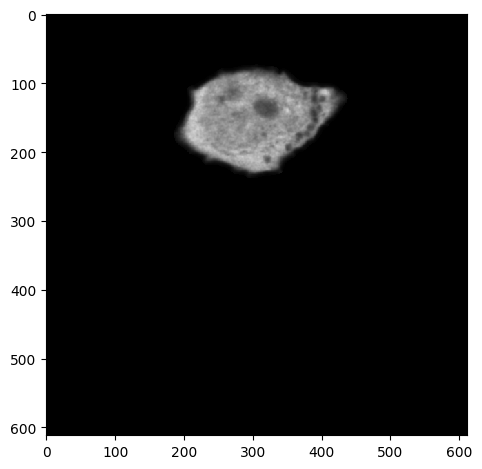

Bin count 49


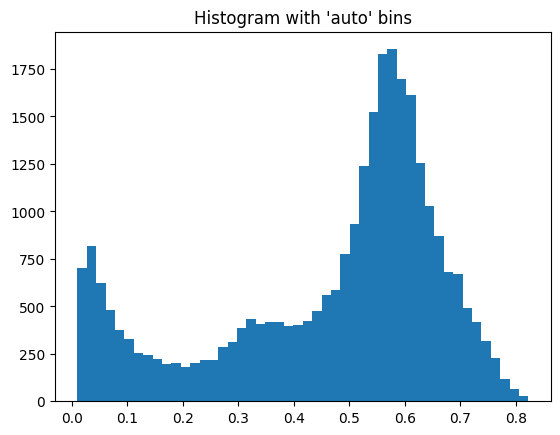

Standard Deviation:  0.20503839970762602
Threshold:  0.8770201183054351


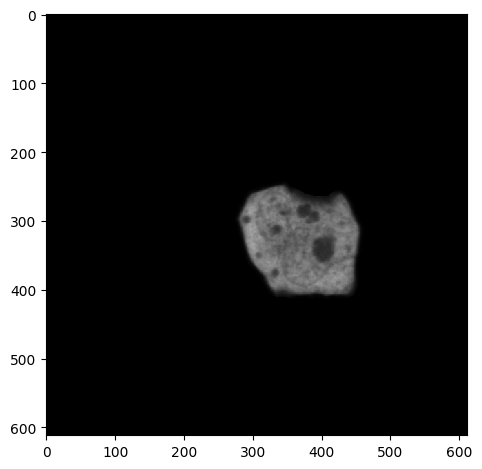

Bin count 51


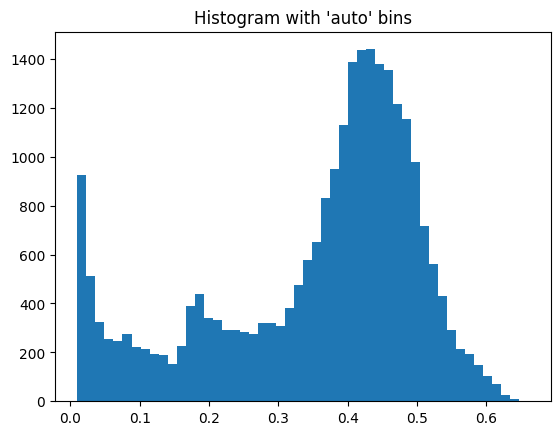

Standard Deviation:  0.15128249580088168
Threshold:  0.6586626660104559
--------------------------------------------------


In [5]:
if __name__ == "__main__":
    folders = ['011124_PFF_SCR_TAX_ADAM/new settings', '251024_PFF_SCR_TAX_ADAM', '281024_PFF_SCR_TAX_ADAM_800/new new settings','291024_PFF_SCR_TAX_ADAM_780']
    analyze_all_images(folders[1])
    # for folder in folders:
    #     analyze_all_images(folder)
